# Цифровые full data-driven модели ценообразования на рынке сельскохозяйственных земель Омской области в третьем квартале 2024 года (материал находится в разработе)

[К.А. Мурашев](https://t.me/Kirjasalo)* (ООО "Совконсалт"), [Е.В. Ткаченко](https://t.me/elen_1212)* (Некоммерческое партнёрство "Омская Коллегия Оценщиков"). * в алфавитном порядке

Данный материал представляет собой backend-часть исследования рынка сельскохозяйственных земель Омской области во 2-3 квартале 2024 года. Данный материал полностью основан на данных и не включает в себя какие-либо субъективные либо опросные значения. При его подготовке, использовался модуль'[Syväjärvi](https://t.me/AIinValuation)' разработанный компаниями Sovconsult DOO (Совконсалт ООО) и Meleksa AB предназначенный для интеллектуального анализа данных рынков и разработки моделей ценообразования на основе технологий искусственного интеллекта. Исходные данные для анализа были предоставлены "[Омской Коллегией Оценщиков](https://око55.рф/)" и размещены в [свободном доступе](https://web.tresorit.com/l/jPHmL#6Z_L62XP4tDLQh2AhM2tMA) согласно ["Требованиям к использованию информации и данных в оценке, судебной и несудебной экспертизе при определении рыночной и иной стоимости объектов недвижимости"](http://sroroo.ru/upload/iblock/7f6/VO_02_24-small.pdf).

При разработке данного исследования, были использованы данные о 85 объектах представляющих собой оферты о продаже земельных участков для сельскохозяйственного производства. Сбор данных и их первичная обработка были осуществлены на стороне Омской коллегии оценщиков. 

Данный материал содержит следующие разделы:

1. Тематические карты: агроклиматическое зонирование, тепловая карта цен аналогов, тепловая карта средних и медианных цен по районам.
1. Описательные статистики рынка.
1. Изолированный анализ т.е., анализ влияние на стоимость каждого признака по отдельности.
1. Совместный анализ т.е., анализ влияние всех признаков с учётом их взаимодействия.
1. Предсказательные модели для расчёта стоимости включая онлайн-калькуляторы.

Данный материал предназначен для решения следующих задач:
1. Комплаенс мероприятия.
1. Антифродинговые процедуры.
1. Оценка рисков.
1. Информационное обеспечение подразделений экономической безопасности.
1. Автоматизированный налоговый контроль.
1. Формирование представления о ценообразовании на рынке сельскохозяйственных земель Омской области во втором и третьем квартале 2024 года.
1. Предсказание стоимости объектов на рынке сельскохозяйственных земель Омской области во втором и третьем квартале 2024 года на основе предложенных моделей.
1. Мониторинг стоимости активов и их портфелей.
1. Контроль результатов работы независимых оценщиков.
1. Ознакомление с технологиями анализа данных в оценке стоимости.
1. Автоматическое изготовление справок о стоимости для сотрудников Федеральной Службы Безопасности Российской Федерации, Следственного Комитета  Российской Федерации и Министерства Внутренних Дел Российской Федерации.
1. Разработка информационных продуктов для оценщиков и судебных экспертов.

In [1]:
# Import libraries
import geopandas as gpd
import folium
from shapely.ops import unary_union
import pandas as pd
import json
import pandas as pd
import branca.colormap as cm
import random
import numpy as np
import seaborn as sns
from syvajarvirus55a243 import create_map_m0
from syvajarvirus55a243 import create_map_m1
from syvajarvirus55a243 import create_map_m2
from syvajarvirus55a243 import calculate_descriptive_statistics
from syvajarvirus55a243 import linear_regression_plot
from syvajarvirus55a243 import plot_isolated_analysis
from syvajarvirus55a243 import perform_linear_regression
from syvajarvirus55a243 import plot_violin_comparison
from syvajarvirus55a243 import plot_kde_comparison
from syvajarvirus55a243 import perform_mann_whitney_tests
from syvajarvirus55a243 import mann_whitney_effect_sizes
from syvajarvirus55a243 import perform_roc_analysis
from syvajarvirus55a243 import perform_logistic_regression
from syvajarvirus55a243 import compare_groups_with_ratios
from syvajarvirus55a243 import compare_groups_with_differences
from syvajarvirus55a243 import plot_kde_with_log_transform
from syvajarvirus55a243 import plot_pie_chart
from syvajarvirus55a243 import plot_bar_chart
from syvajarvirus55a243 import create_binary_column


# Set random  seed
random.seed(552644099)  # Set seed for reproducibility

## Тематические карты

### Агроклиматическое зонирование Омской области

Согласно данным Омской колегии оценщиков, в Омской области выделяют две климатические зоны: северную и южную, а также четыре агроклиматических района: северный, северная лесостепь, южная лесостепь, степь. Далее приводится код для построения интерактивной карты. В правом верхнем углу находится кнопка вызова меню для управления слоями.  Картографическая основа [OpenStreetMap](https://www.openstreetmap.org) (Лицензия: [Open Data Commons Open Database License (ODbL)](https://opendatacommons.org/licenses/odbl/)). При построении карты использовались правила зоны UTM Zone 43N и соответствующая ей проекция epsg=32643.

In [2]:
# Specify the path to your GeoJSON file
geojson_path = 'omsk_region.geojson'

# Create the map m0
m0 = create_map_m0(geojson_path)

# Display the map
m0

### Ценовое зонирование

Построим карту наблюдений. Цвет точки зависит от цены за 1 кв. м. Тепловая шкала показана в верхней части карты. При наведении курсора на объект, всплывает инфомационное окно с основными сведениям о нём. Управление слоями также осуществляется с помощью кнопки в правом верхнем углу.

In [3]:
# Specify the paths to your GeoJSON and CSV files
geojson_path = 'omsk_region.geojson'
csv_path = 'data_omsk_agro_243.csv'

# Create the map m1
m1 = create_map_m1(geojson_path, csv_path)

# Display the map
m1

Построим тепловую карту средних и медианных цен по районам. Переключение между средними и медианные ценами осуществляется кнопкой управления слоями.

In [4]:
# Specify the paths to your GeoJSON and CSV files
geojson_path = 'omsk_region.geojson'
csv_path = 'data_omsk_agro_243.csv'

# Create the map m2
m2 = create_map_m2(geojson_path, csv_path)

# Display the map
m2


### Описательные статистики рынка

Рассматриваемый набор данных, предоставленный НП "Омская коллегия оценщиков" включает следующие переменные:

1. id &mdash; универсальный идентификатор объекта;
1. latutude &mdash; широта объекта;
1. longitude  &mdash; долгота объекта;
1. climate_zone  &mdash; климатическая зона (северная либо южная);
1. agricultural_zone &mdash; агроклиматический район (северный, северная лесостепь, южная лесостепь, южная);
1. district &mdash; район расположения объекта;
1. price &mdash; цена оферты за объект в рублях, НДС не облагается;
1. area &mdash; площадь объекта в квадратных метрах;
1. ownership &mdash; тип права на объект: частная собственность либо долевая (в т.ч. пай);
1. permitted &mdash; вид разрешённого использования: сельскозяйственное использование, личное подсобное хозяйство;
1. actual &mdash; фактическое использование участка: пашня, сенокос, пастбище, кормовые угодья, не используется и т.д.;
1. crop_yield &mdash; балл бонитета;
1. capital_distance &mdash; расстояние от Омска;
1. elevator_distance &mdash; расстояние от ближайщего элеватора;
1. is_paved_road &mdash; индикатор наличия подъезда к участку по дороге с твёрдым покрытием;
1. shape &mdash; форма участка с точки зрения удобства механизированной обработки (простая, сложная);
1. is_marked &mdash; индикатор наличия установленных границ участка;
1. is_coast &mdash; индикатор наличия собственной береговой линии;
1. offer_date &mdash; дата фиксации оферты;
1. is_brokerage &mdash; индикатор наличия посредника в виде агентства недвижимости;
1. is_single &mdash; индикатор одноконтурности участка;
1. is_electricity &mdash; индикатор электрификации участка;
1. is_gas &mdash; индикатор газификации участка.


Рассчитаем основные метрики для количественных переменных: 'price', 'area', 'price_per_sqm', 'crop_yield', 'capital_distance', 'elevator_distance'. Среди таких метрик: среднее, медиана, минимальное, максимальное, размах, дисперсия, стандартное отклонение, коэффициент ассиметрии, коэффициент эксцесса, 5, 10, 25, 50, 75, 90, 95 перцентили, коэффициент вариации, среднее абсолютное отклонение.


In [2]:
# Read data
df = pd.read_csv('data_omsk_agro_243.csv')

# List of numerical columns to analyze
df['price_per_sqm'] = df['price'] / df['area']

# Create separate Data Frames for different groups of districts
specific_districts = ['Омский район']  # List of districts to include
df_omsk = df[df['district'].isin(specific_districts)]
df_not_omsk = df[~df['district'].isin(specific_districts)]


In [6]:
# Define numerical columns list
numerical_columns = ['price', 'area', 'price_per_sqm', 'crop_yield', 'capital_distance', 'elevator_distance']

# Calculate descriptive statistics
stats_df = calculate_descriptive_statistics(df, numerical_columns)

# Display the statistics
print(stats_df)

                   count          mean         median           min  \
price               90.0  1.769636e+06  850000.000000  85000.000000   
area                90.0  4.370873e+05  138000.000000   9897.000000   
price_per_sqm       90.0  1.550428e+01       5.662393      0.118334   
crop_yield          90.0  6.275556e+01      70.000000     40.000000   
capital_distance    90.0  8.954444e+01      64.500000      0.000000   
elevator_distance   90.0  5.765556e+01      37.000000      1.500000   

                            max         range      variance       std_dev  \
price              1.300000e+07  1.291500e+07  5.653988e+12  2.377812e+06   
area               1.121776e+07  1.120786e+07  1.652466e+12  1.285483e+06   
price_per_sqm      1.150370e+02  1.149186e+02  5.149360e+02  2.269220e+01   
crop_yield         7.300000e+01  3.300000e+01  1.182991e+02  1.087654e+01   
capital_distance   5.150000e+02  5.150000e+02  7.676723e+03  8.761691e+01   
elevator_distance  2.990000e+02  2.97500

Данные статистики доступны в файле `data_omsk_agro_243_stats.csv`.

In [7]:
stats_df.to_csv('data_omsk_agro_243_stats.csv', index=True)

In [8]:
# Calculate descriptive statistics
stats_df_omsk = calculate_descriptive_statistics(df_omsk, numerical_columns)

# Display the statistics
print(stats_df_omsk)

                   count          mean        median            min  \
price               33.0  2.581485e+06  1.500000e+06  250000.000000   
area                33.0  1.308797e+05  6.252400e+04    9897.000000   
price_per_sqm       33.0  3.416947e+01  2.604167e+01       5.330056   
crop_yield          33.0  7.000000e+01  7.000000e+01      70.000000   
capital_distance    33.0  1.978788e+01  1.800000e+01       0.000000   
elevator_distance   33.0  3.009091e+01  2.500000e+01       1.500000   

                            max         range      variance       std_dev  \
price              1.300000e+07  1.275000e+07  8.455525e+12  2.907838e+06   
area               1.876153e+06  1.866256e+06  1.013308e+11  3.183250e+05   
price_per_sqm      1.150370e+02  1.097069e+02  8.038658e+02  2.835253e+01   
crop_yield         7.000000e+01  0.000000e+00  0.000000e+00  0.000000e+00   
capital_distance   7.400000e+01  7.400000e+01  2.646098e+02  1.626683e+01   
elevator_distance  8.100000e+01  7.95000

In [9]:
stats_df_omsk.to_csv('data_omsk_omsk_agro_243_stats.csv', index=True)

In [10]:
# Calculate descriptive statistics
stats_df_not_omsk = calculate_descriptive_statistics(df_not_omsk, numerical_columns)

# Display the statistics
print(stats_df_not_omsk)

                   count          mean    median           min           max  \
price               57.0  1.299619e+06  590000.0  85000.000000  1.010000e+07   
area                57.0  6.143654e+05  190000.0  25800.000000  1.121776e+07   
price_per_sqm       57.0  4.698117e+00       3.0      0.118334  3.488372e+01   
crop_yield          57.0  5.856140e+01      59.0     40.000000  7.300000e+01   
capital_distance    57.0  1.299298e+02     111.0     17.000000  5.150000e+02   
elevator_distance   57.0  7.361404e+01      44.0     16.000000  2.990000e+02   

                          range      variance       std_dev  skewness  \
price              1.001500e+07  3.540816e+12  1.881706e+06  3.006613   
area               1.119196e+07  2.481096e+12  1.575149e+06  5.839121   
price_per_sqm      3.476539e+01  3.486933e+01  5.905026e+00  3.133606   
crop_yield         3.300000e+01  1.391792e+02  1.179742e+01 -0.248536   
capital_distance   4.980000e+02  7.521745e+03  8.672799e+01  1.677774   
e

In [11]:
stats_df_not_omsk.to_csv('data_omsk_not_omsk_agro_243_stats.csv', index=True)

Рассчитаем логарифмы количественных переменных, построим графики ядерной оценки плотности и проведём тест на нормальность распределения.

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


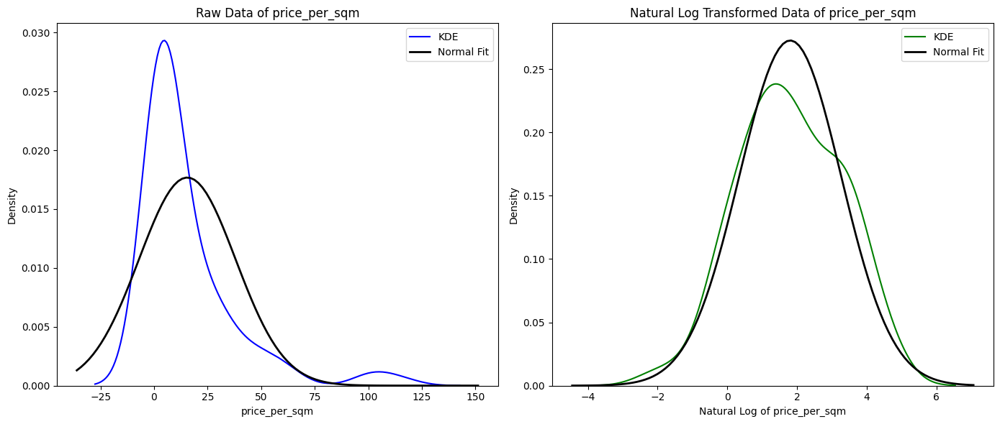


Summary Statistics for price_per_sqm:
count     90.000000
mean      15.504279
std       22.692201
min        0.118334
25%        2.288658
50%        5.662393
75%       22.503807
max      115.036976
Name: price_per_sqm, dtype: float64

Summary Statistics for Natural Log of price_per_sqm:
count    90.000000
mean      1.804959
std       1.471010
min      -2.134242
25%       0.827893
50%       1.733669
75%       3.113296
max       4.745254
Name: price_per_sqm, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.66523, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.98629, p-value=0.46831

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [12]:
# Specify the column of interest
column_of_interest = 'price_per_sqm'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)


Таким образом, можно сделать вывод о логарифмически нормальном распределении удельных цен предложений.

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


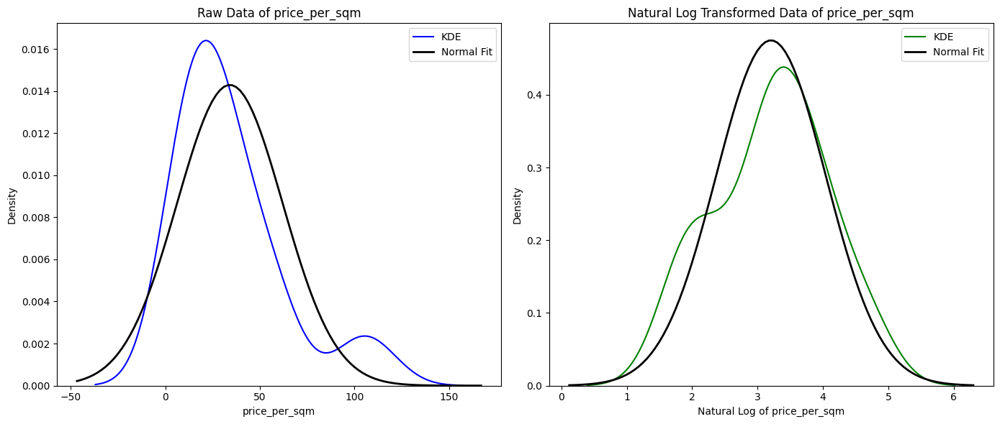


Summary Statistics for price_per_sqm:
count     33.000000
mean      34.169468
std       28.352527
min        5.330056
25%       15.606189
50%       26.041667
75%       46.037690
max      115.036976
Name: price_per_sqm, dtype: float64

Summary Statistics for Natural Log of price_per_sqm:
count    33.000000
mean      3.204622
std       0.852966
min       1.673362
25%       2.747668
50%       3.259698
75%       3.829460
max       4.745254
Name: price_per_sqm, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.83300, p-value=0.00015

Shapiro-Wilk Test for log-transformed data:
Statistic=0.96001, p-value=0.25858

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [15]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


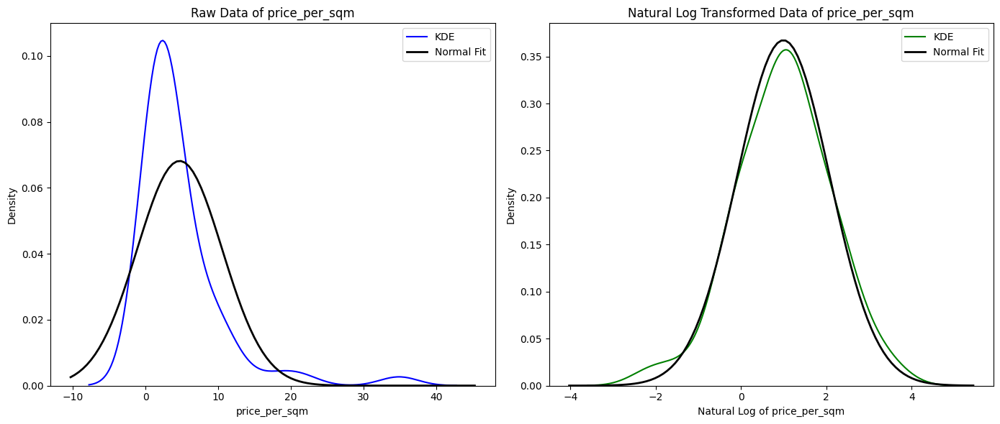


Summary Statistics for price_per_sqm:
count    57.000000
mean      4.698117
std       5.905026
min       0.118334
25%       1.243781
50%       3.000000
75%       5.363636
max      34.883721
Name: price_per_sqm, dtype: float64

Summary Statistics for Natural Log of price_per_sqm:
count    57.000000
mean      0.994628
std       1.095654
min      -2.134242
25%       0.218156
50%       1.098612
75%       1.679642
max       3.552020
Name: price_per_sqm, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.65758, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.98913, p-value=0.88839

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [16]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


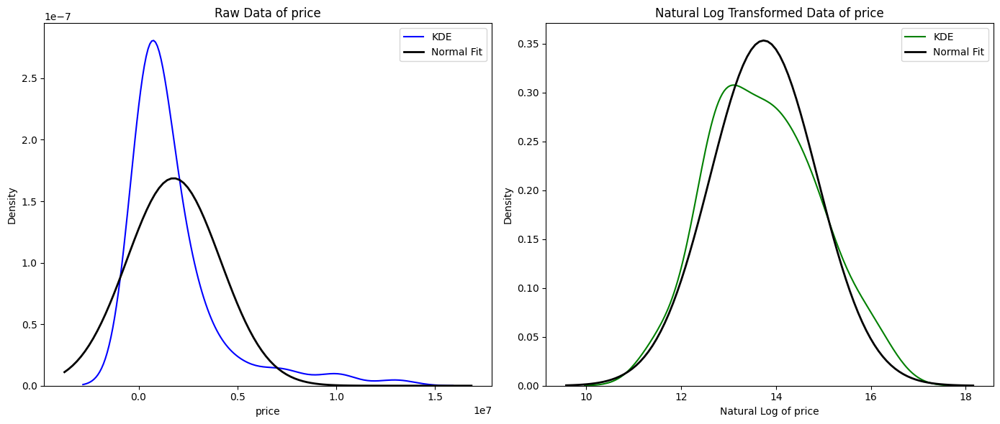


Summary Statistics for price:
count    9.000000e+01
mean     1.769636e+06
std      2.377812e+06
min      8.500000e+04
25%      3.850000e+05
50%      8.500000e+05
75%      2.074250e+06
max      1.300000e+07
Name: price, dtype: float64

Summary Statistics for Natural Log of price:
count    90.000000
mean     13.739659
std       1.135747
min      11.350407
25%      12.860750
50%      13.651259
75%      14.544893
max      16.380460
Name: price, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.66046, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.98387, p-value=0.33030

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [18]:
# Specify the column of interest
column_of_interest = 'price'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


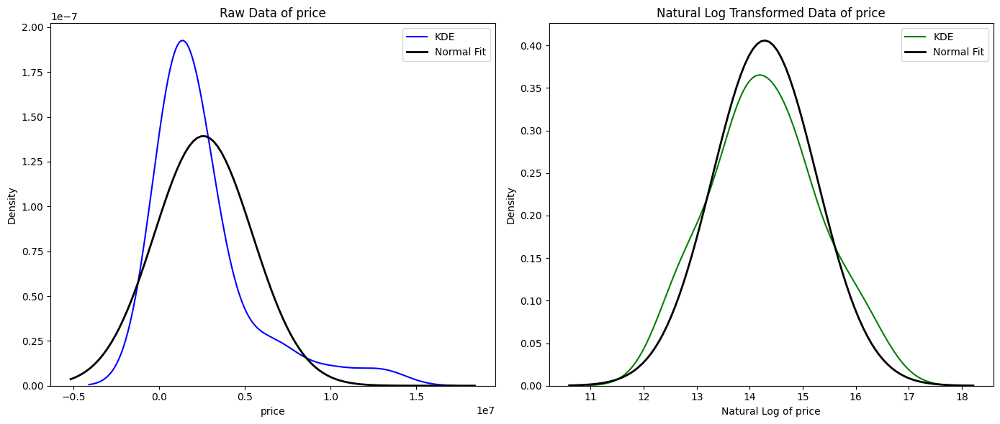


Summary Statistics for price:
count    3.300000e+01
mean     2.581485e+06
std      2.907838e+06
min      2.500000e+05
25%      1.000000e+06
50%      1.500000e+06
75%      2.500000e+06
max      1.300000e+07
Name: price, dtype: float64

Summary Statistics for Natural Log of price:
count    33.000000
mean     14.279569
std       0.998166
min      12.429216
25%      13.815511
50%      14.220976
75%      14.731801
max      16.380460
Name: price, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.72133, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.97554, p-value=0.64607

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [19]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


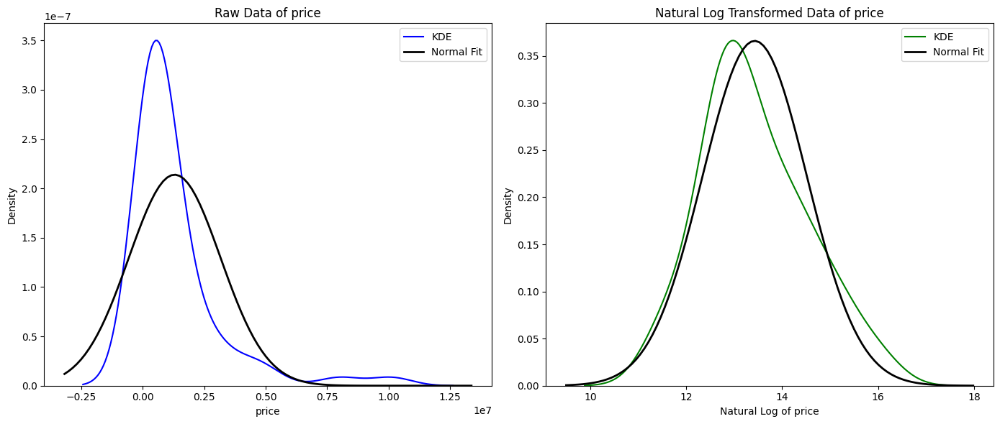


Summary Statistics for price:
count    5.700000e+01
mean     1.299619e+06
std      1.881706e+06
min      8.500000e+04
25%      3.000000e+05
50%      5.900000e+05
75%      1.500000e+06
max      1.010000e+07
Name: price, dtype: float64

Summary Statistics for Natural Log of price:
count    57.000000
mean     13.427079
std       1.099769
min      11.350407
25%      12.611538
50%      13.287878
75%      14.220976
max      16.128046
Name: price, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.61228, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.97165, p-value=0.20004

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [20]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

Таким образом, можно сделать вывод о логарифмически нормальном распределении абсолютных цен предложений.

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


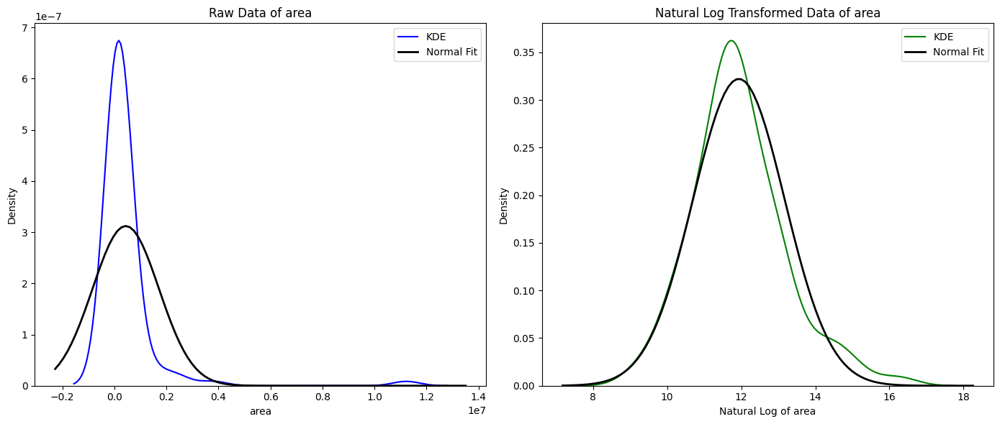


Summary Statistics for area:
count    9.000000e+01
mean     4.370873e+05
std      1.285483e+06
min      9.897000e+03
25%      7.097500e+04
50%      1.380000e+05
75%      3.072402e+05
max      1.121776e+07
Name: area, dtype: float64

Summary Statistics for Natural Log of area:
count    90.000000
mean     11.934699
std       1.245553
min       9.199987
25%      11.169805
50%      11.834904
75%      12.632643
max      16.233009
Name: area, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.29043, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.96476, p-value=0.01529

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [21]:
# Specify the column of interest
column_of_interest = 'area'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


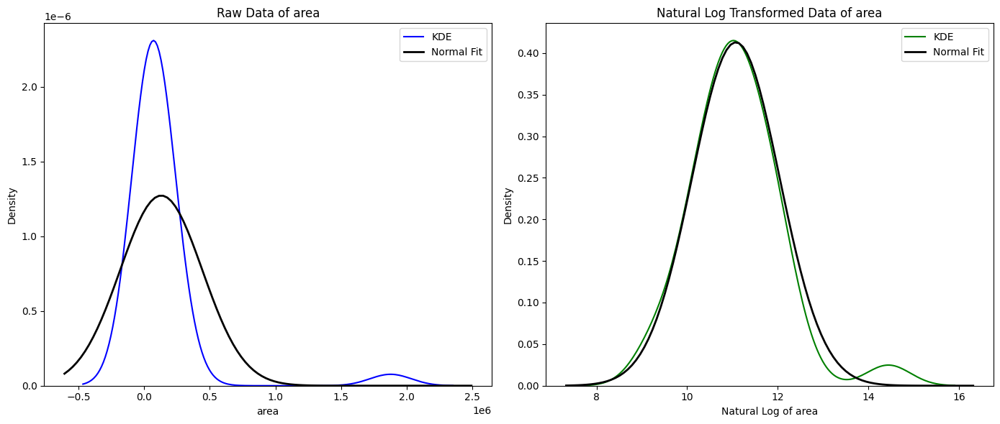


Summary Statistics for area:
count    3.300000e+01
mean     1.308797e+05
std      3.183250e+05
min      9.897000e+03
25%      3.258200e+04
50%      6.252400e+04
75%      9.600000e+04
max      1.876153e+06
Name: area, dtype: float64

Summary Statistics for Natural Log of area:
count    33.000000
mean     11.074948
std       0.981190
min       9.199987
25%      10.391515
50%      11.043306
75%      11.472103
max      14.444734
Name: area, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.30265, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.93509, p-value=0.04896

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [22]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


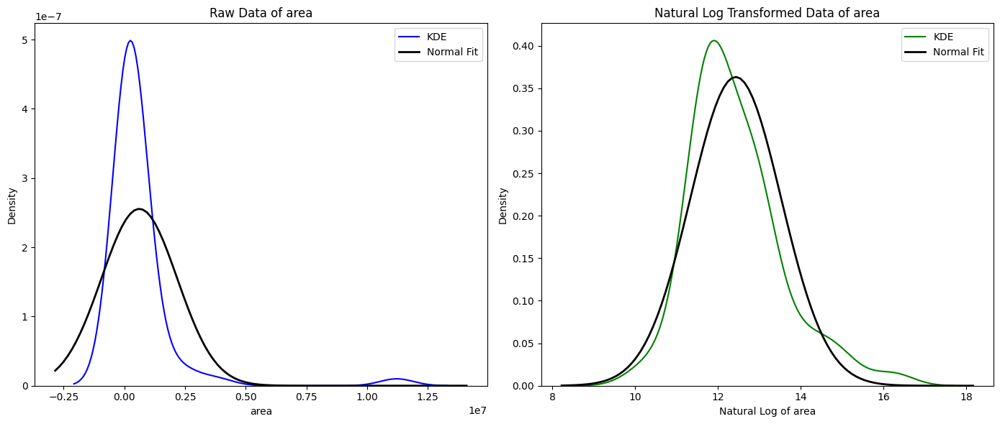


Summary Statistics for area:
count    5.700000e+01
mean     6.143654e+05
std      1.575149e+06
min      2.580000e+04
25%      1.200000e+05
50%      1.900000e+05
75%      4.080000e+05
max      1.121776e+07
Name: area, dtype: float64

Summary Statistics for Natural Log of area:
count    57.000000
mean     12.432451
std       1.108027
min      10.158130
25%      11.695247
50%      12.154779
75%      12.919022
max      16.233009
Name: area, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.33316, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.92107, p-value=0.00118

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [23]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


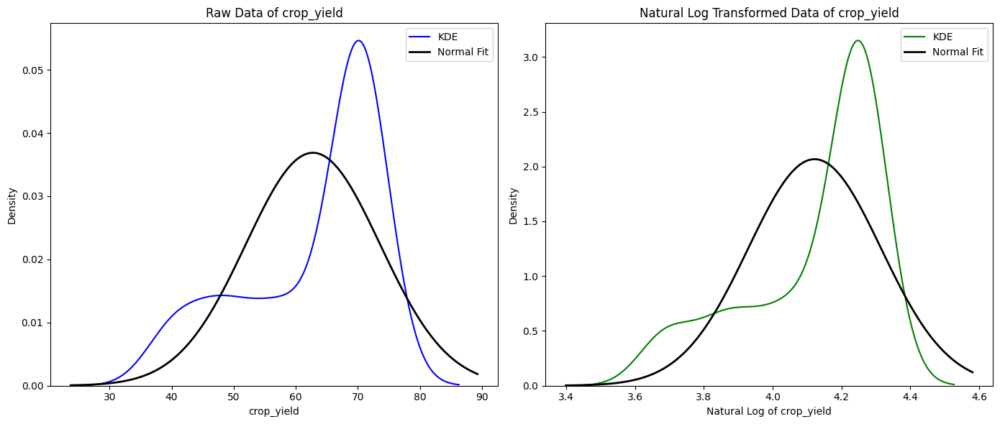


Summary Statistics for crop_yield:
count    90.000000
mean     62.755556
std      10.876540
min      40.000000
25%      55.250000
50%      70.000000
75%      70.000000
max      73.000000
Name: crop_yield, dtype: float64

Summary Statistics for Natural Log of crop_yield:
count    90.000000
mean      4.121991
std       0.194022
min       3.688879
25%       4.011838
50%       4.248495
75%       4.248495
max       4.290459
Name: crop_yield, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.77375, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.75352, p-value=0.00000

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [24]:
# Specify the column of interest
column_of_interest = 'crop_yield'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


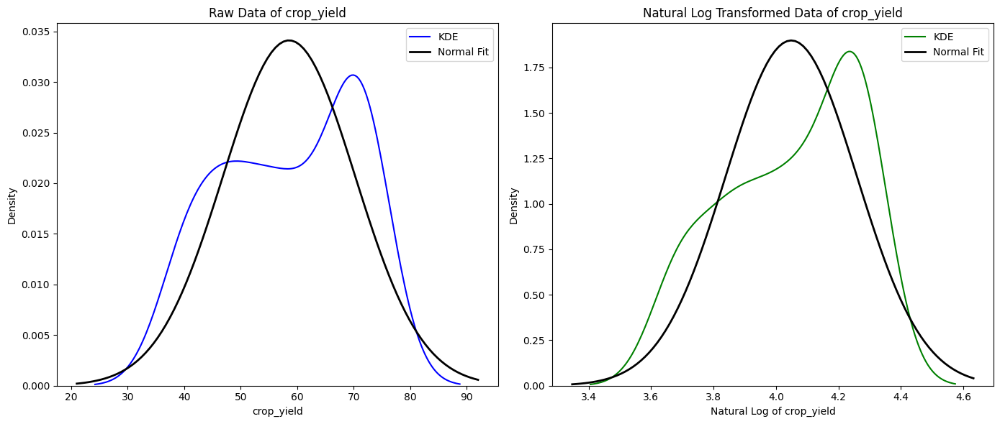


Summary Statistics for crop_yield:
count    57.000000
mean     58.561404
std      11.797423
min      40.000000
25%      49.000000
50%      59.000000
75%      71.000000
max      73.000000
Name: crop_yield, dtype: float64

Summary Statistics for Natural Log of crop_yield:
count    57.000000
mean      4.048752
std       0.211986
min       3.688879
25%       3.891820
50%       4.077537
75%       4.262680
max       4.290459
Name: crop_yield, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.88813, p-value=0.00007

Shapiro-Wilk Test for log-transformed data:
Statistic=0.87934, p-value=0.00004

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [26]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

Data contains zero or negative values. Shifting data by 2.0 to make all values positive.


/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


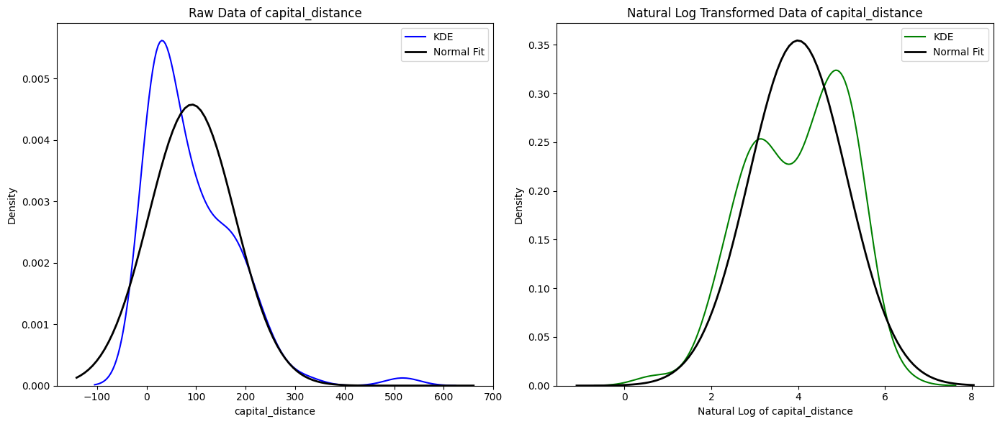


Summary Statistics for capital_distance:
count     90.000000
mean      91.544444
std       87.616909
min        2.000000
25%       22.000000
50%       66.500000
75%      149.750000
max      517.000000
Name: capital_distance, dtype: float64

Summary Statistics for Natural Log of capital_distance:
count    90.000000
mean      3.994863
std       1.131995
min       0.693147
25%       3.091042
50%       4.197174
75%       5.008963
max       6.248043
Name: capital_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.83292, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.95996, p-value=0.00726

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [13]:
# Specify the column of interest
column_of_interest = 'capital_distance'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

Data contains zero or negative values. Shifting data by 2.0 to make all values positive.


/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


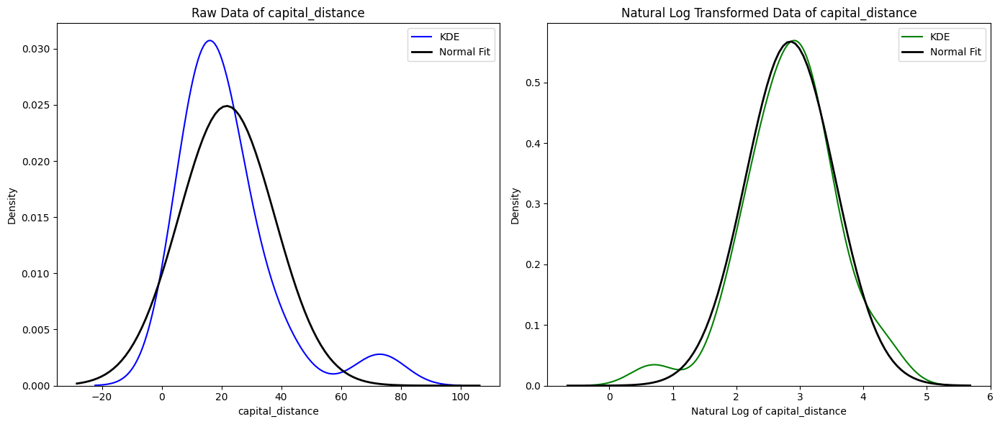


Summary Statistics for capital_distance:
count    33.000000
mean     21.787879
std      16.266833
min       2.000000
25%      12.000000
50%      20.000000
75%      25.000000
max      76.000000
Name: capital_distance, dtype: float64

Summary Statistics for Natural Log of capital_distance:
count    33.000000
mean      2.850186
std       0.713711
min       0.693147
25%       2.484907
50%       2.995732
75%       3.218876
max       4.330733
Name: capital_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.79577, p-value=0.00003

Shapiro-Wilk Test for log-transformed data:
Statistic=0.96421, p-value=0.33839

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data looks normally distributed (fail to reject H0 at alpha=0.05).


In [14]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


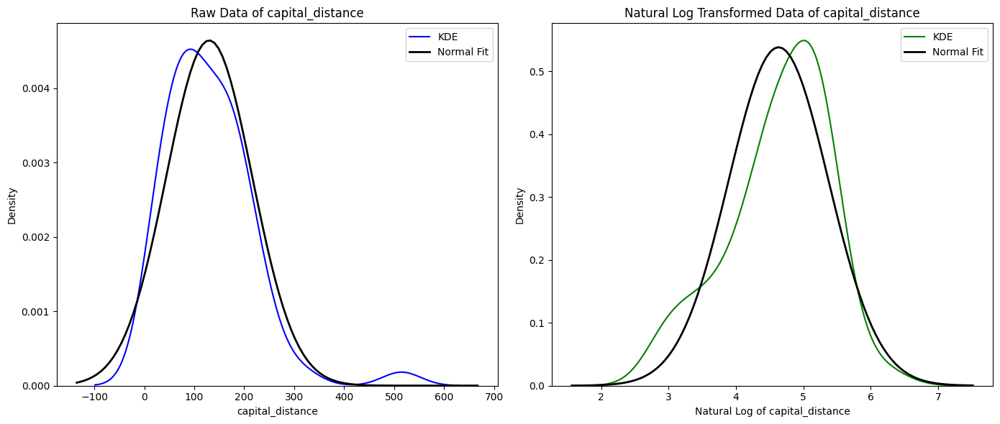


Summary Statistics for capital_distance:
count     57.000000
mean     129.929825
std       86.727994
min       17.000000
25%       65.000000
50%      111.000000
75%      186.000000
max      515.000000
Name: capital_distance, dtype: float64

Summary Statistics for Natural Log of capital_distance:
count    57.000000
mean      4.631668
std       0.747517
min       2.833213
25%       4.174387
50%       4.709530
75%       5.225747
max       6.244167
Name: capital_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.87905, p-value=0.00004

Shapiro-Wilk Test for log-transformed data:
Statistic=0.94987, p-value=0.01941

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [15]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


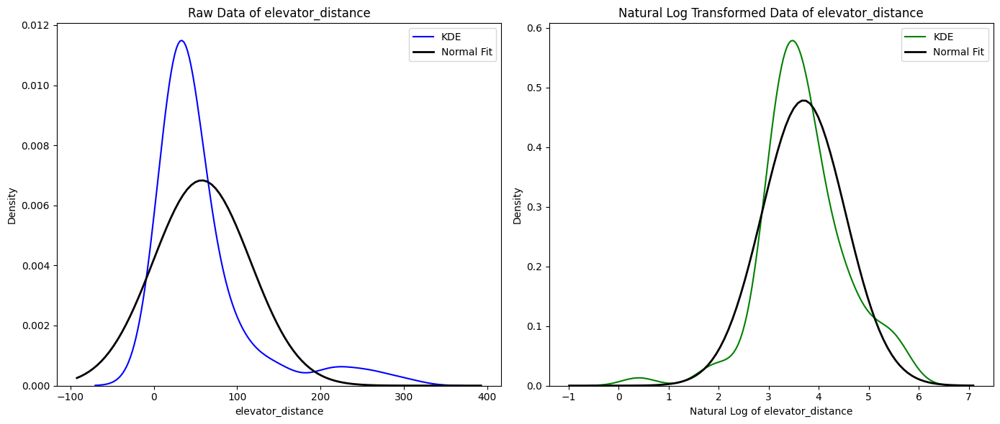


Summary Statistics for elevator_distance:
count     90.000000
mean      57.655556
std       58.705590
min        1.500000
25%       25.000000
50%       37.000000
75%       57.750000
max      299.000000
Name: elevator_distance, dtype: float64

Summary Statistics for Natural Log of elevator_distance:
count    90.000000
mean      3.701765
std       0.838575
min       0.405465
25%       3.218876
50%       3.610918
75%       4.056095
max       5.700444
Name: elevator_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.68008, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.93874, p-value=0.00036

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [16]:
# Specify the column of interest
column_of_interest = 'elevator_distance'

# Call the function
plot_kde_with_log_transform(df, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


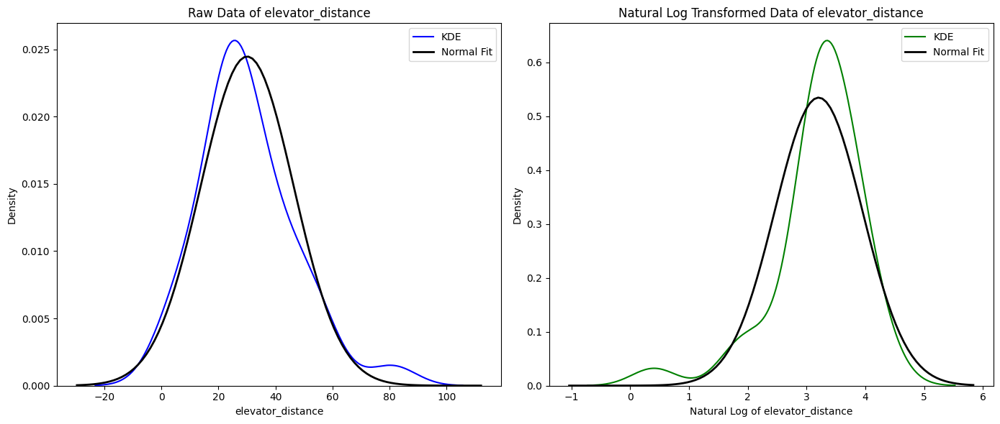


Summary Statistics for elevator_distance:
count    33.000000
mean     30.090909
std      16.552216
min       1.500000
25%      23.000000
50%      25.000000
75%      36.000000
max      81.000000
Name: elevator_distance, dtype: float64

Summary Statistics for Natural Log of elevator_distance:
count    33.000000
mean      3.205156
std       0.757412
min       0.405465
25%       3.135494
50%       3.218876
75%       3.583519
max       4.394449
Name: elevator_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.94361, p-value=0.08658

Shapiro-Wilk Test for log-transformed data:
Statistic=0.84923, p-value=0.00033

Raw data looks normally distributed (fail to reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [17]:
# Call the function
plot_kde_with_log_transform(df_omsk, column=column_of_interest, log_base=np.e)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


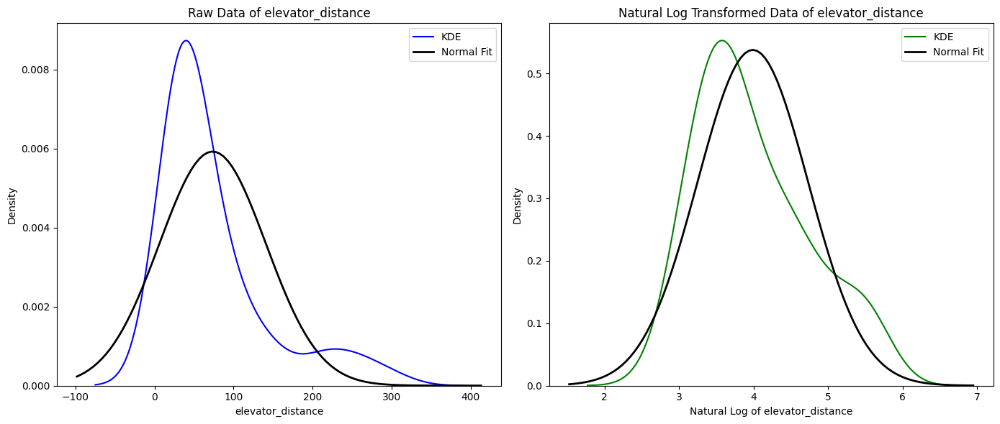


Summary Statistics for elevator_distance:
count     57.000000
mean      73.614035
std       67.924263
min       16.000000
25%       32.000000
50%       44.000000
75%       85.000000
max      299.000000
Name: elevator_distance, dtype: float64

Summary Statistics for Natural Log of elevator_distance:
count    57.000000
mean      3.989276
std       0.748543
min       2.772589
25%       3.465736
50%       3.784190
75%       4.442651
max       5.700444
Name: elevator_distance, dtype: float64

Normality Tests:

Shapiro-Wilk Test for raw data:
Statistic=0.73677, p-value=0.00000

Shapiro-Wilk Test for log-transformed data:
Statistic=0.93317, p-value=0.00364

Raw data does not look normally distributed (reject H0 at alpha=0.05).
Log-transformed data does not look normally distributed (reject H0 at alpha=0.05).


In [18]:
# Call the function
plot_kde_with_log_transform(df_not_omsk, column=column_of_interest, log_base=np.e)

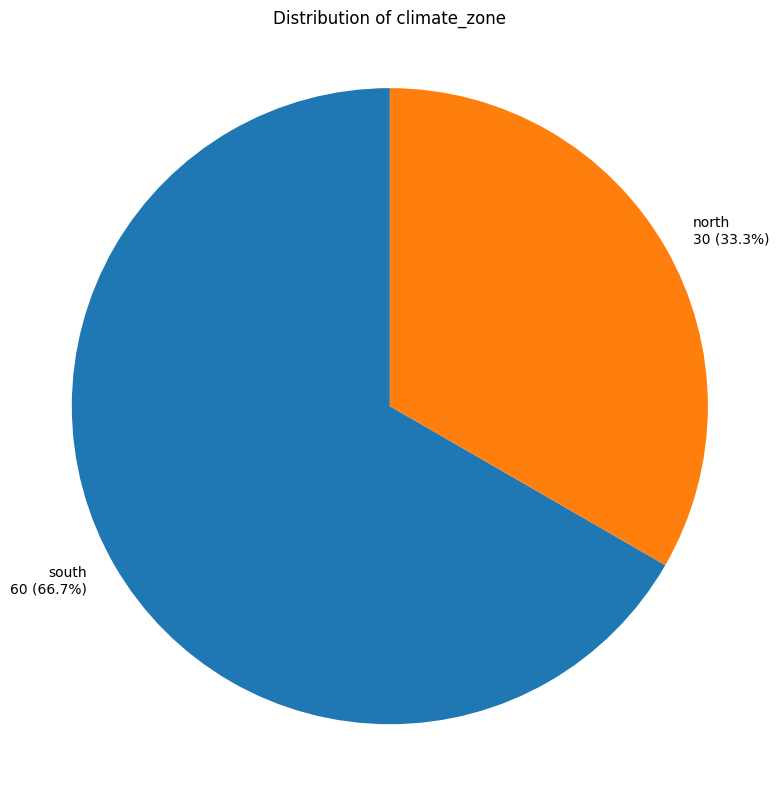

In [20]:
# Specify the column you want to visualize
column_to_visualize = 'climate_zone'

# Call the function
plot_pie_chart(df, column=column_to_visualize)


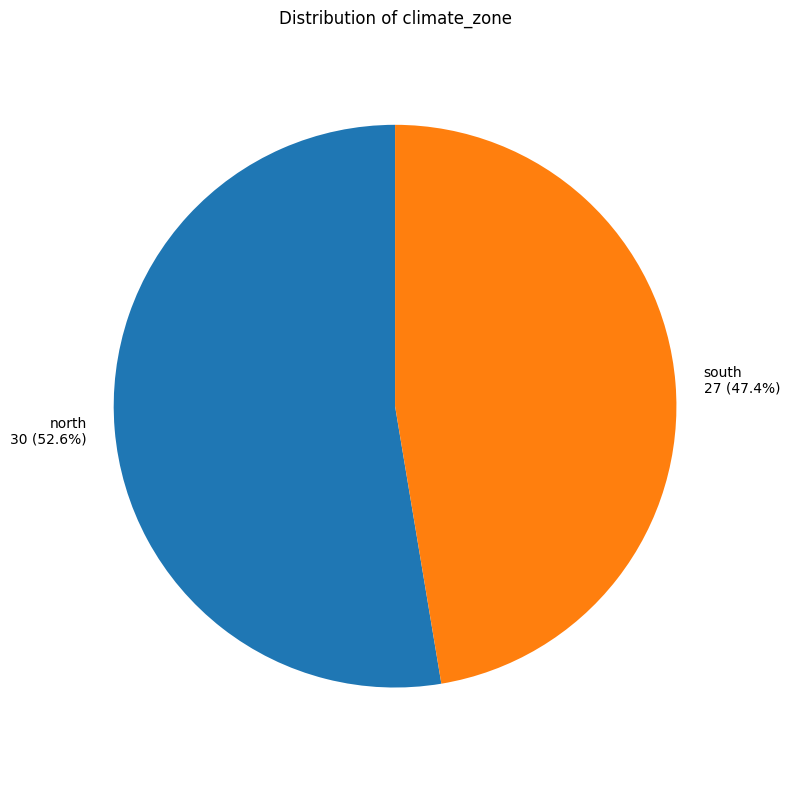

In [21]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)


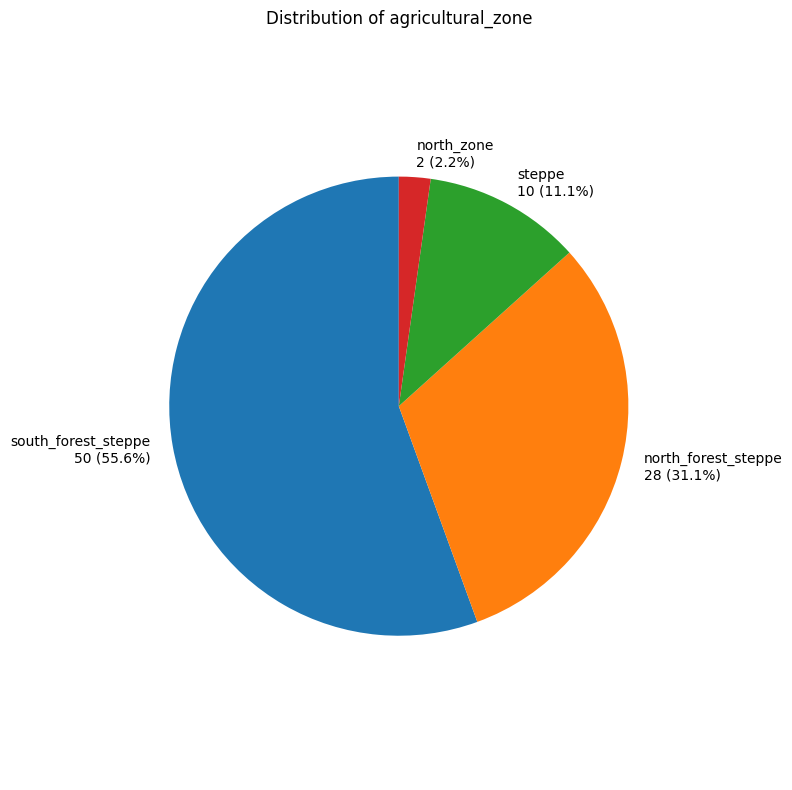

In [22]:
# Specify the column you want to visualize
column_to_visualize = 'agricultural_zone'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

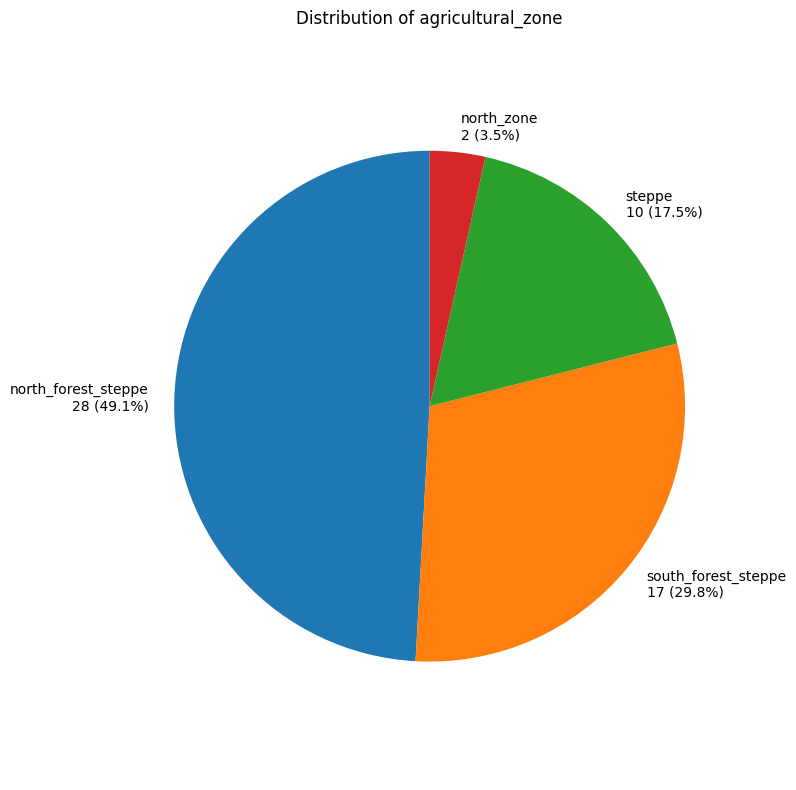

In [23]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)


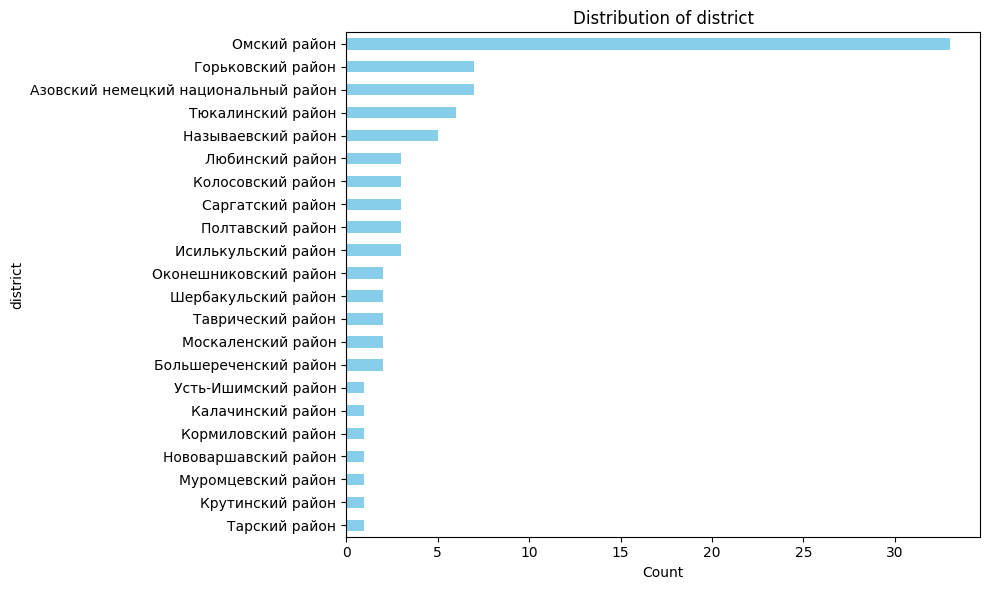

In [5]:
# Specify the column you want to visualize
column_to_visualize = 'district'

# Call the function
plot_bar_chart(df, column=column_to_visualize)

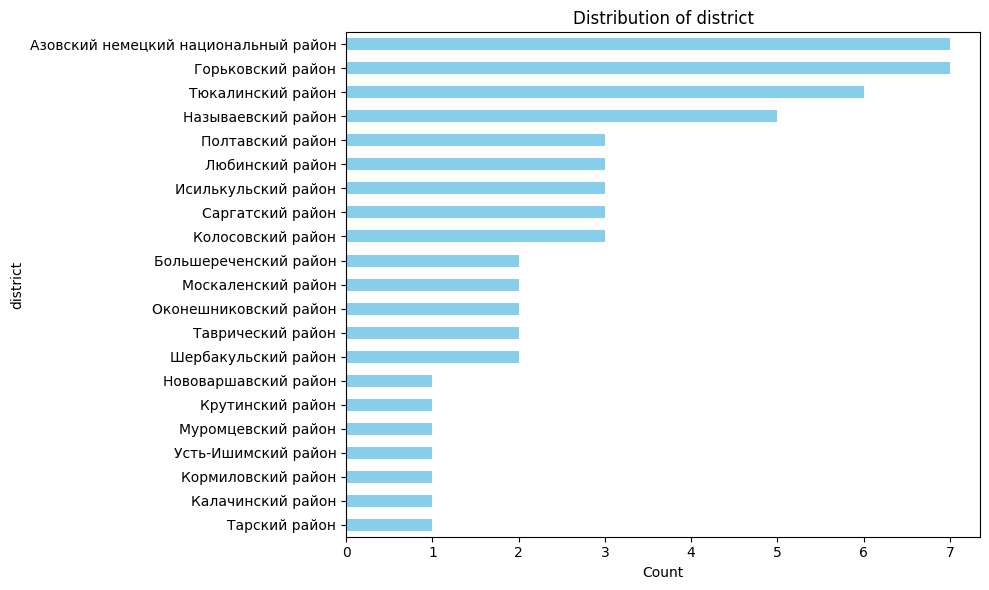

In [6]:
# Call the function
plot_bar_chart(df_not_omsk, column=column_to_visualize)

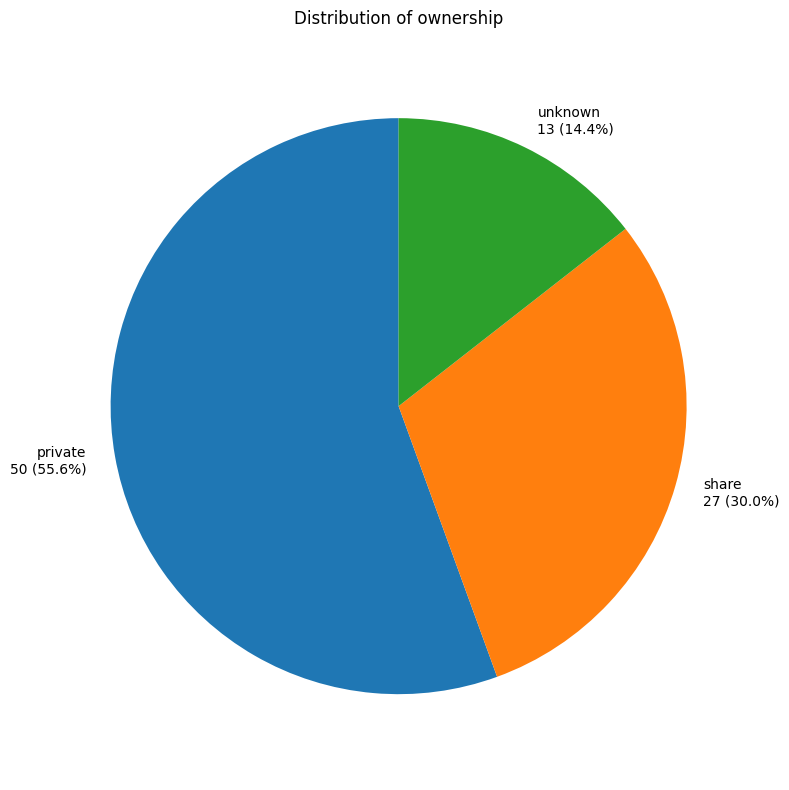

In [26]:
# Specify the column you want to visualize
column_to_visualize = 'ownership'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

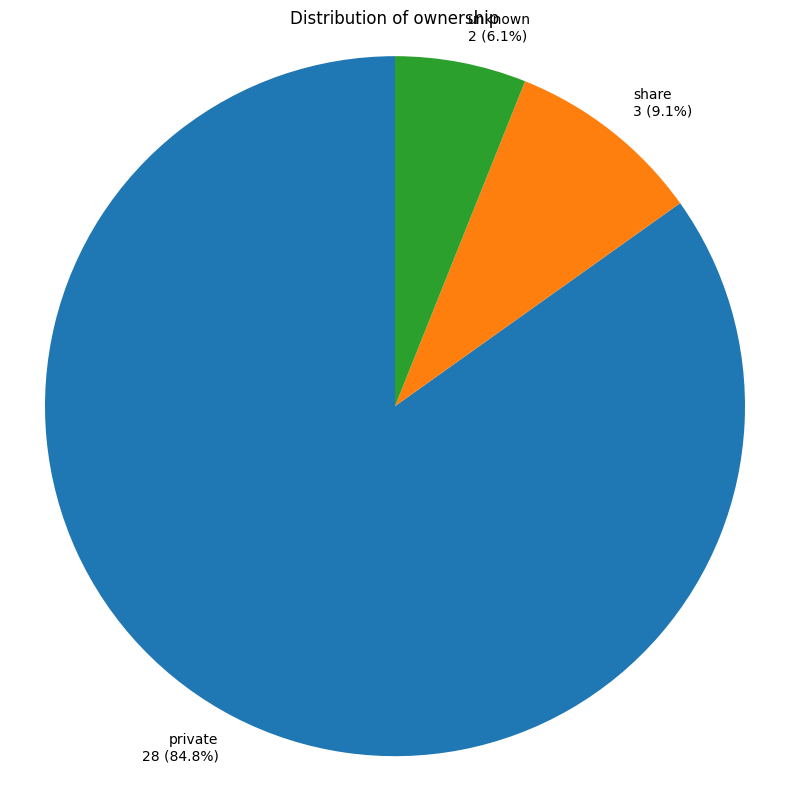

In [27]:
# Call the function
plot_pie_chart(df_omsk, column=column_to_visualize)

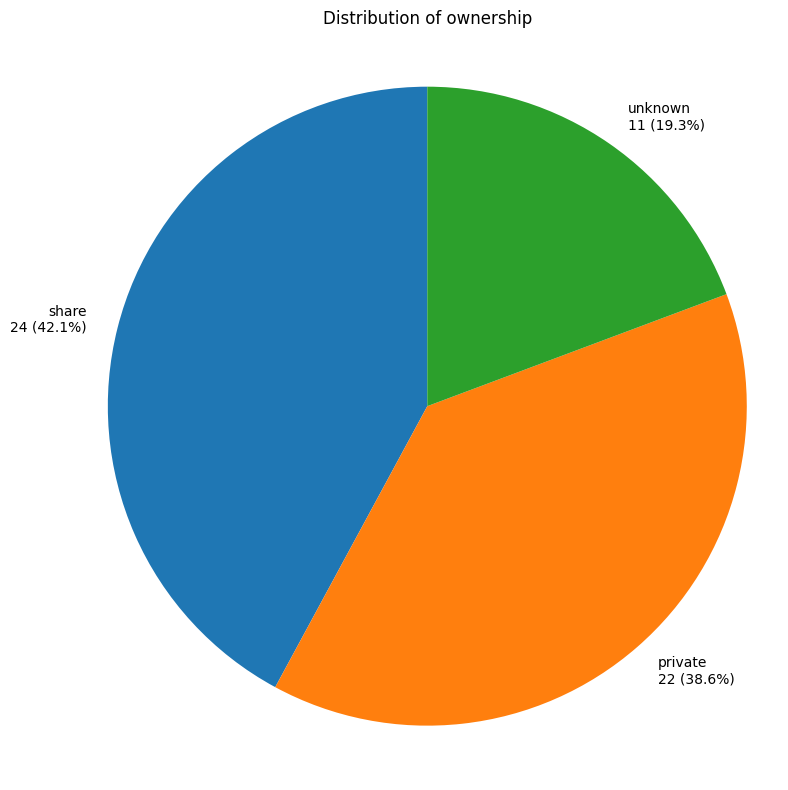

In [28]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)

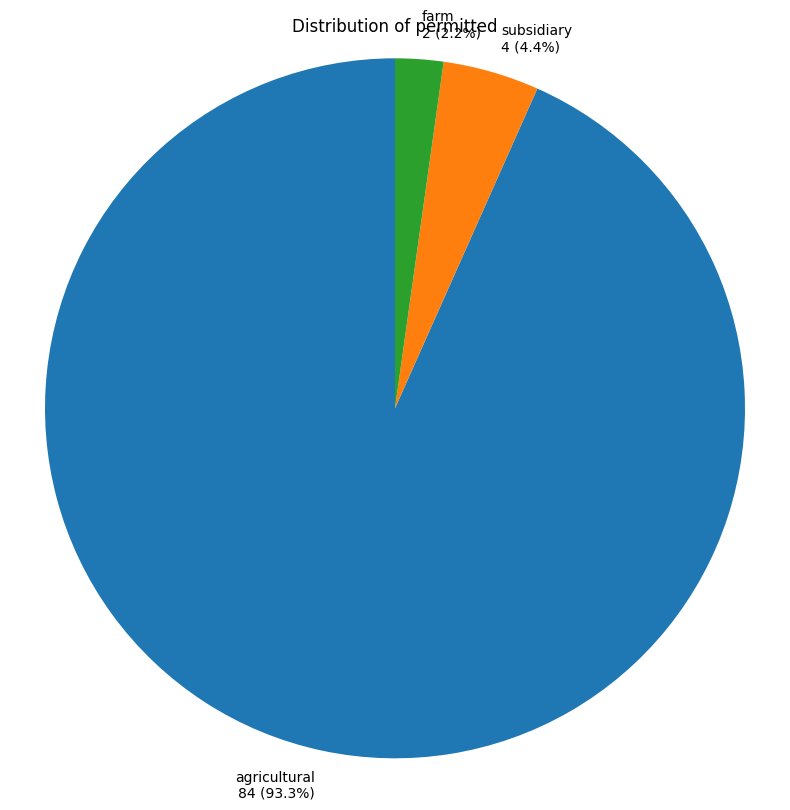

In [29]:
# Specify the column you want to visualize
column_to_visualize = 'permitted'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

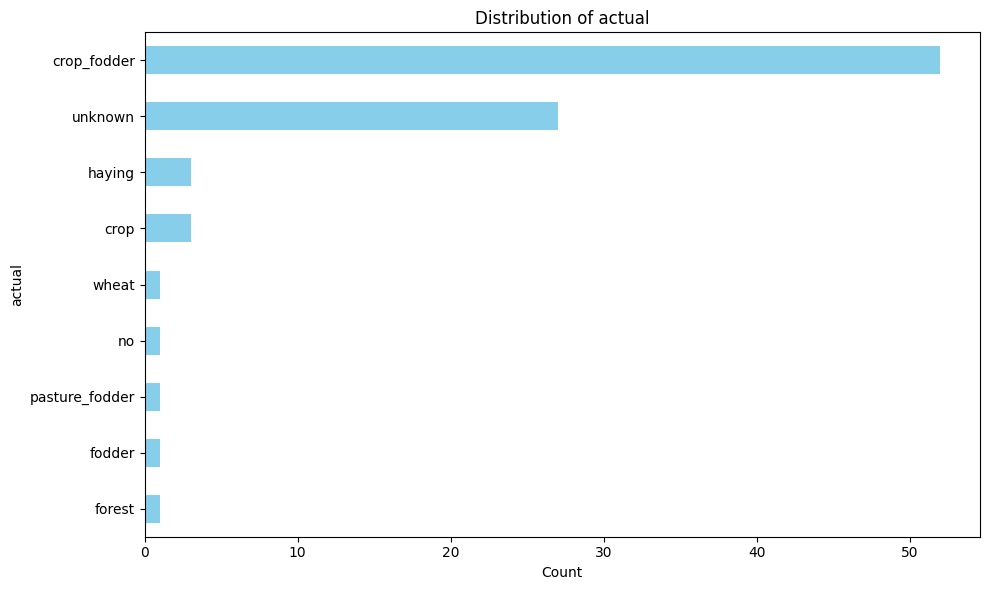

In [30]:
# Specify the column you want to visualize
column_to_visualize = 'actual'

# Call the function
plot_bar_chart(df, column=column_to_visualize)

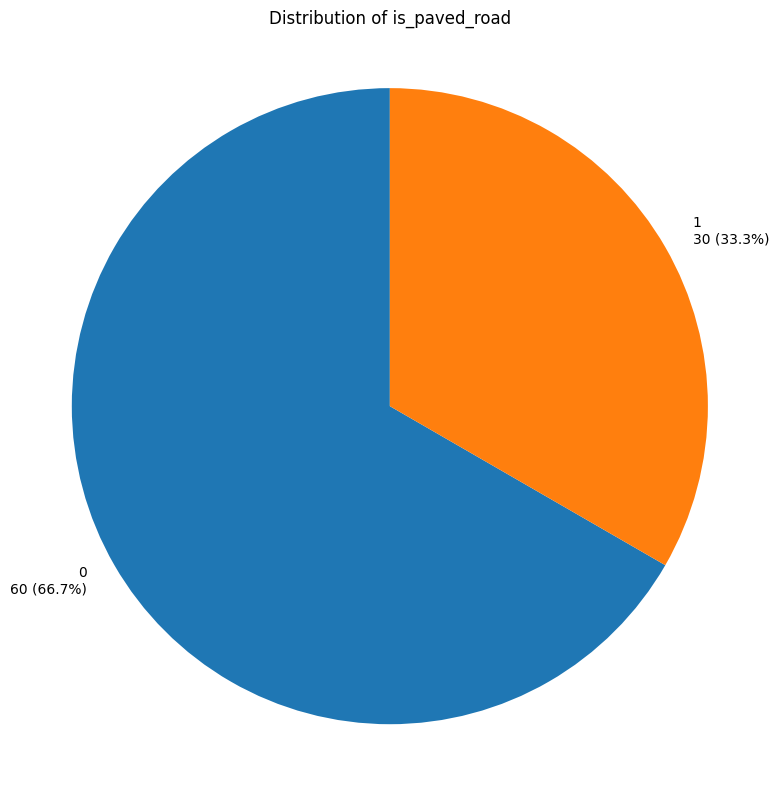

In [31]:
# Specify the column you want to visualize
column_to_visualize = 'is_paved_road'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

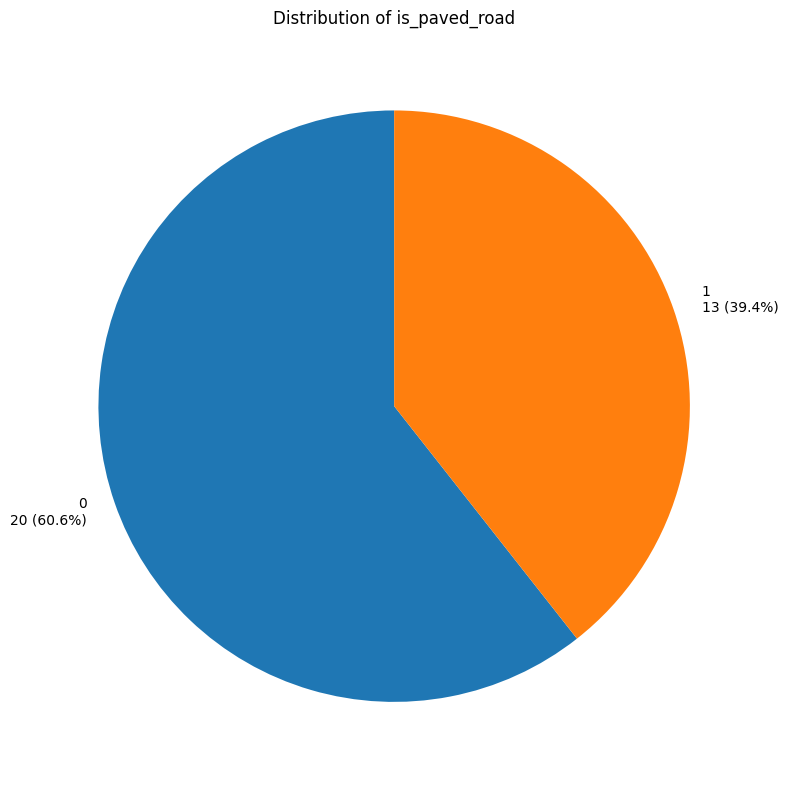

In [32]:
# Call the function
plot_pie_chart(df_omsk, column=column_to_visualize)

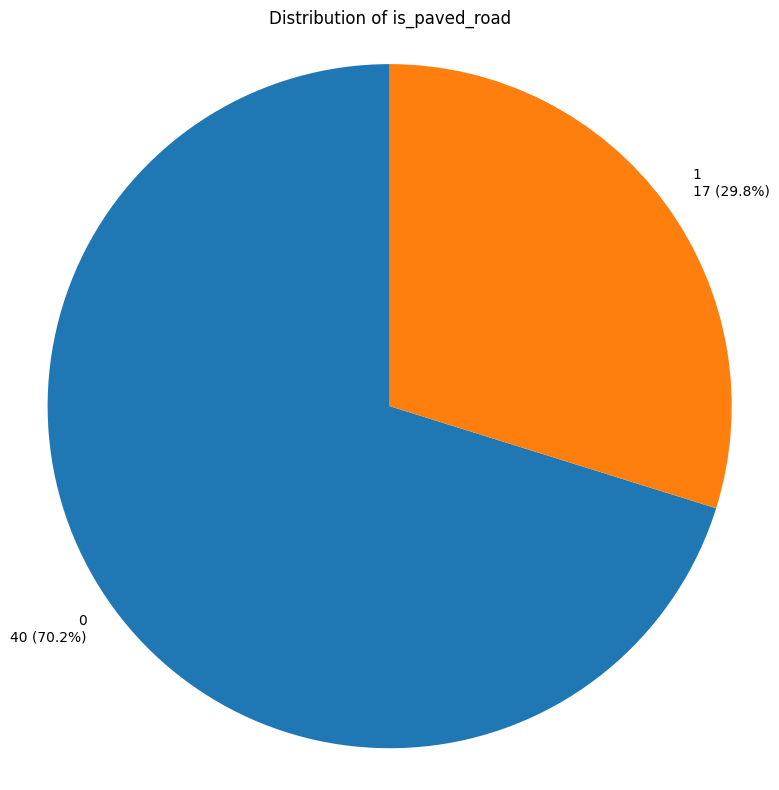

In [33]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)

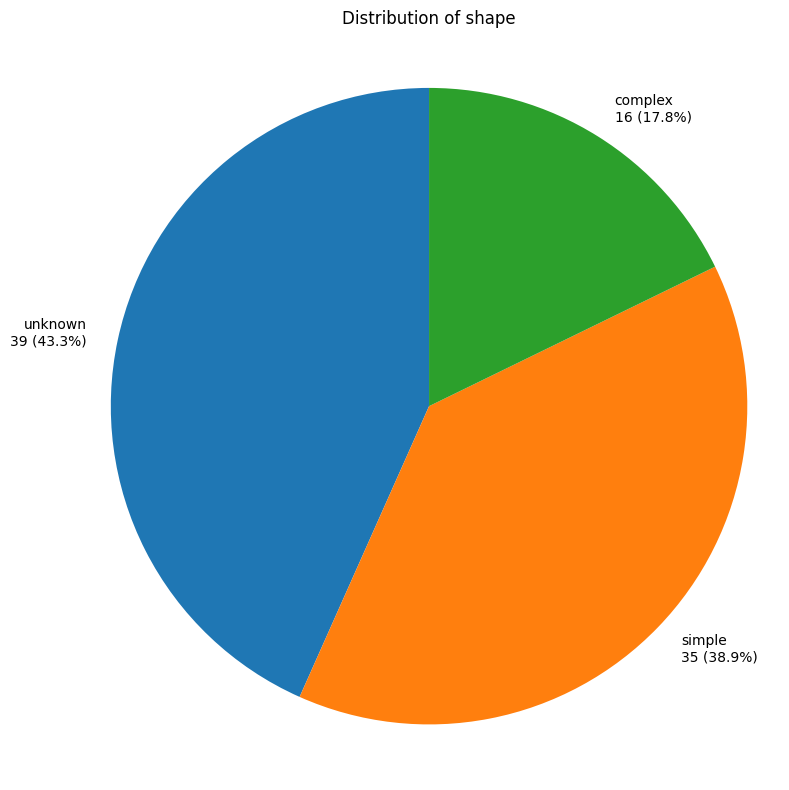

In [34]:
# Specify the column you want to visualize
column_to_visualize = 'shape'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

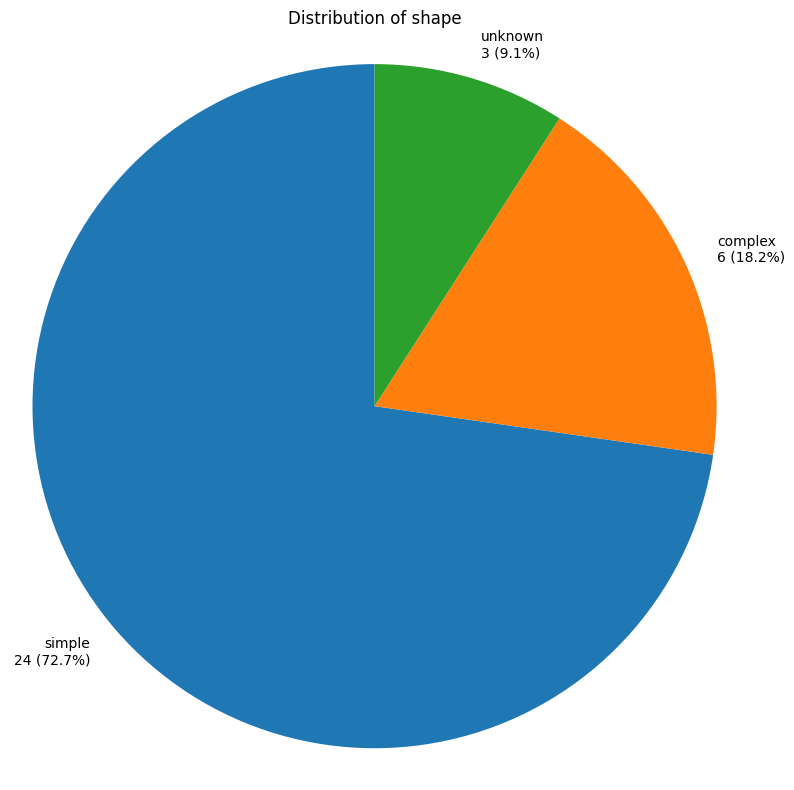

In [35]:
# Call the function
plot_pie_chart(df_omsk, column=column_to_visualize)

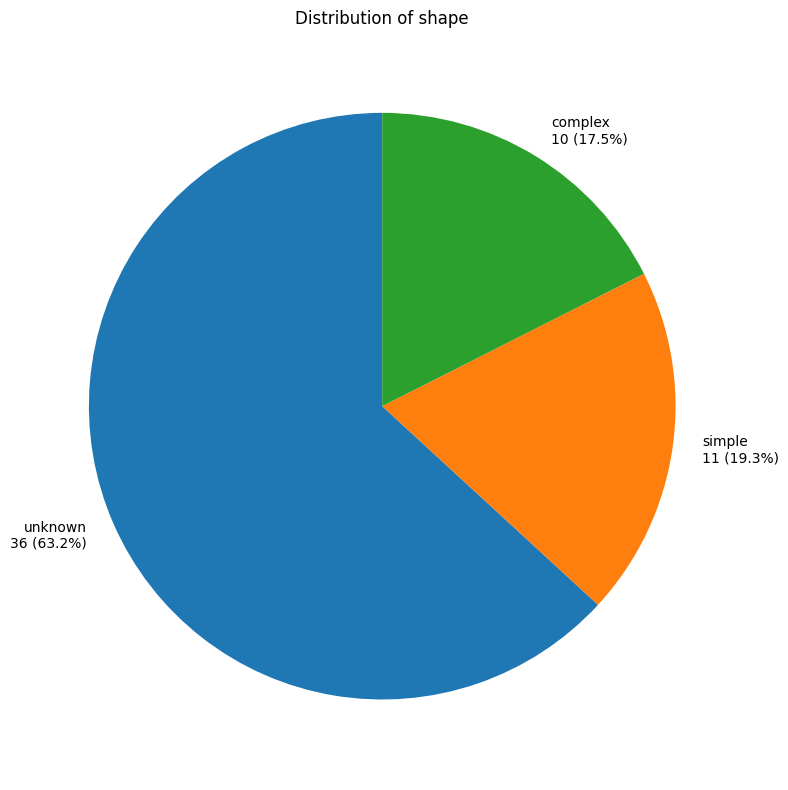

In [36]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)

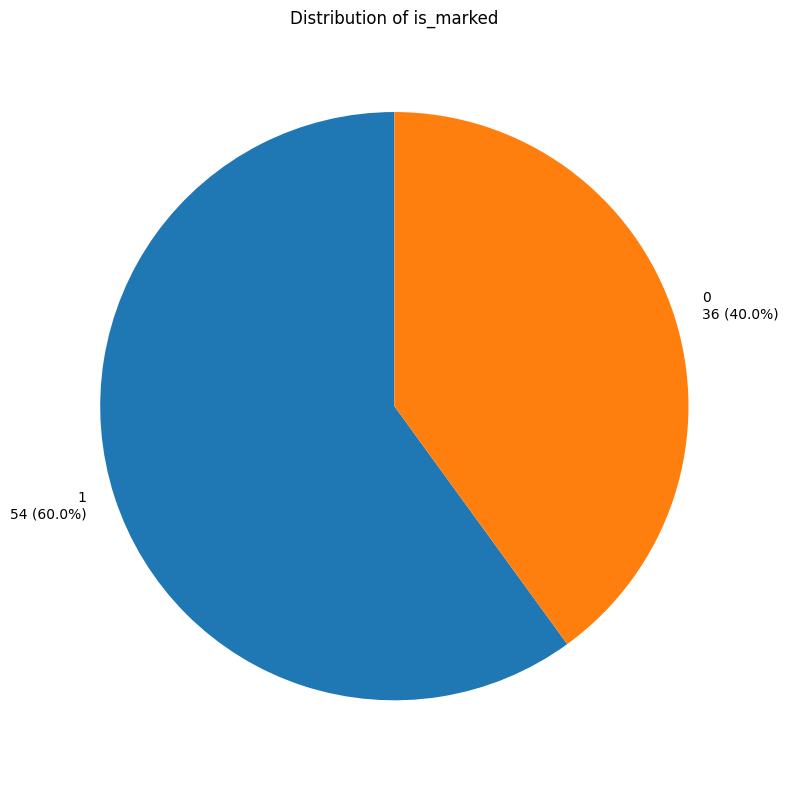

In [8]:
# Specify the column you want to visualize
column_to_visualize = 'is_marked'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

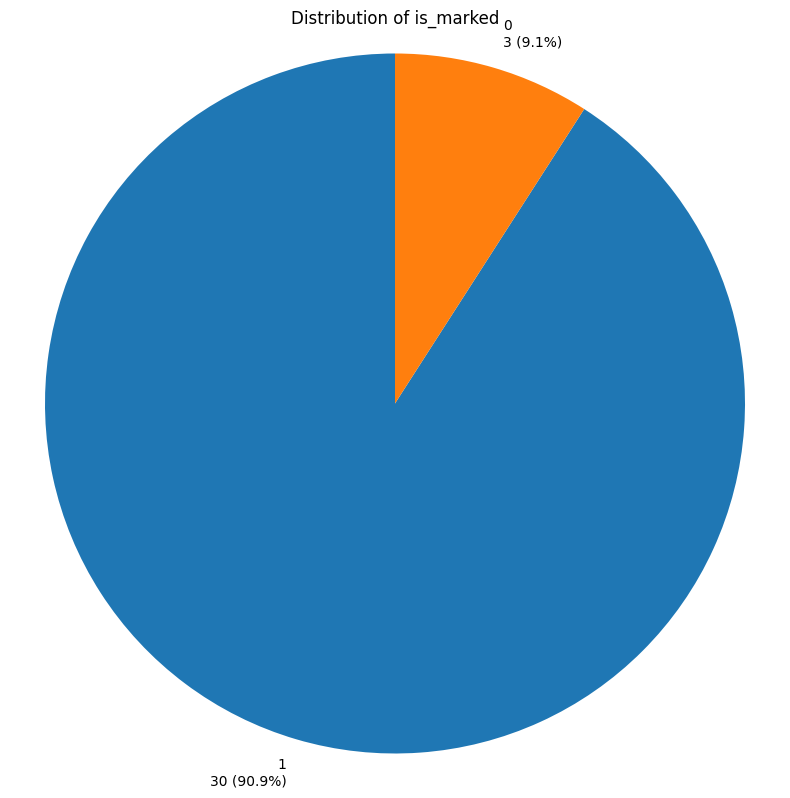

In [9]:
# Call the function
plot_pie_chart(df_omsk, column=column_to_visualize)

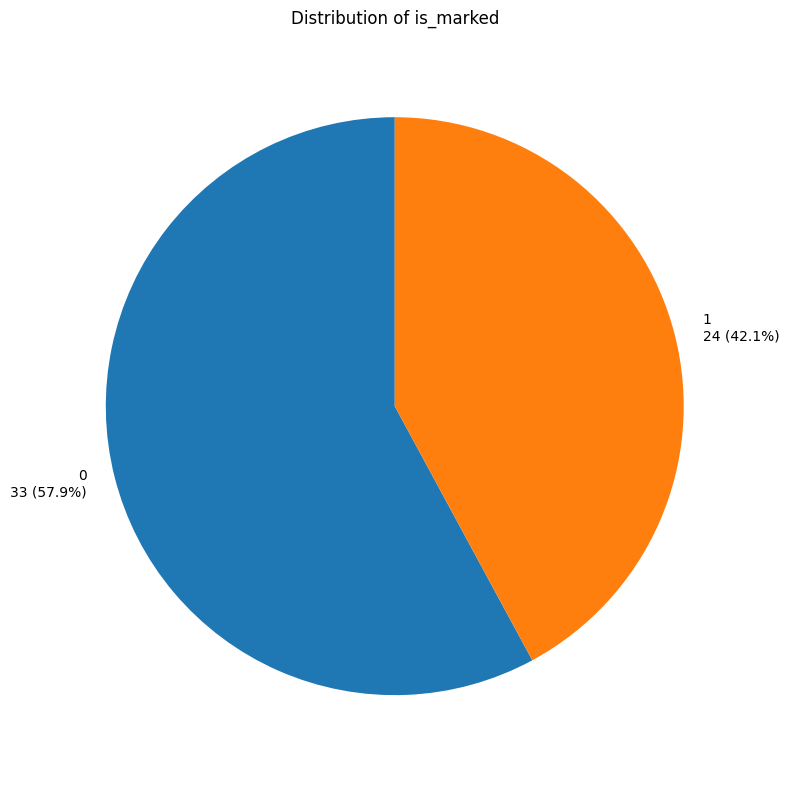

In [10]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)

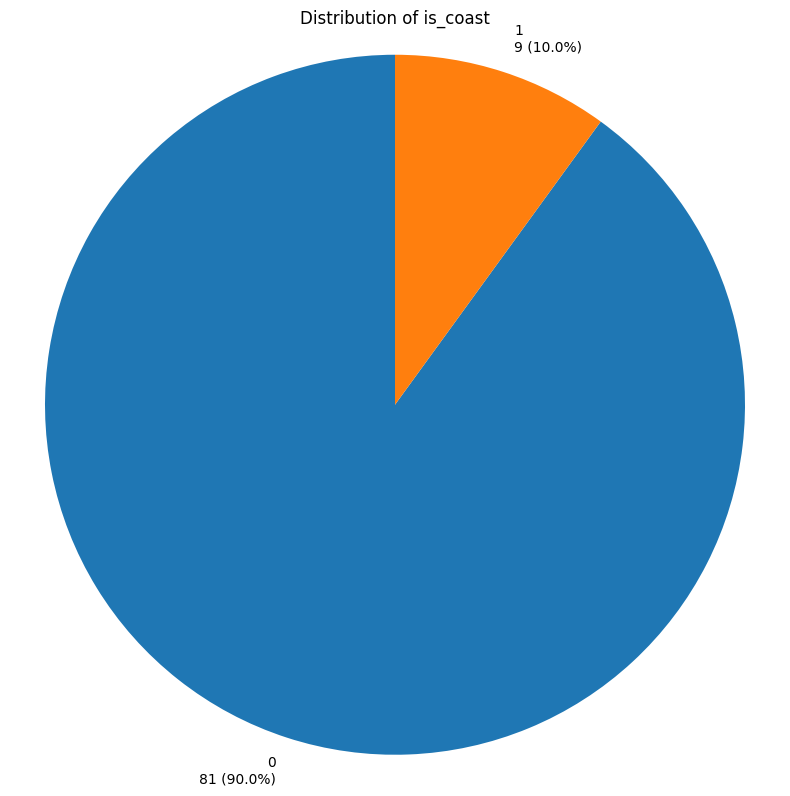

In [11]:
# Specify the column you want to visualize
column_to_visualize = 'is_coast'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

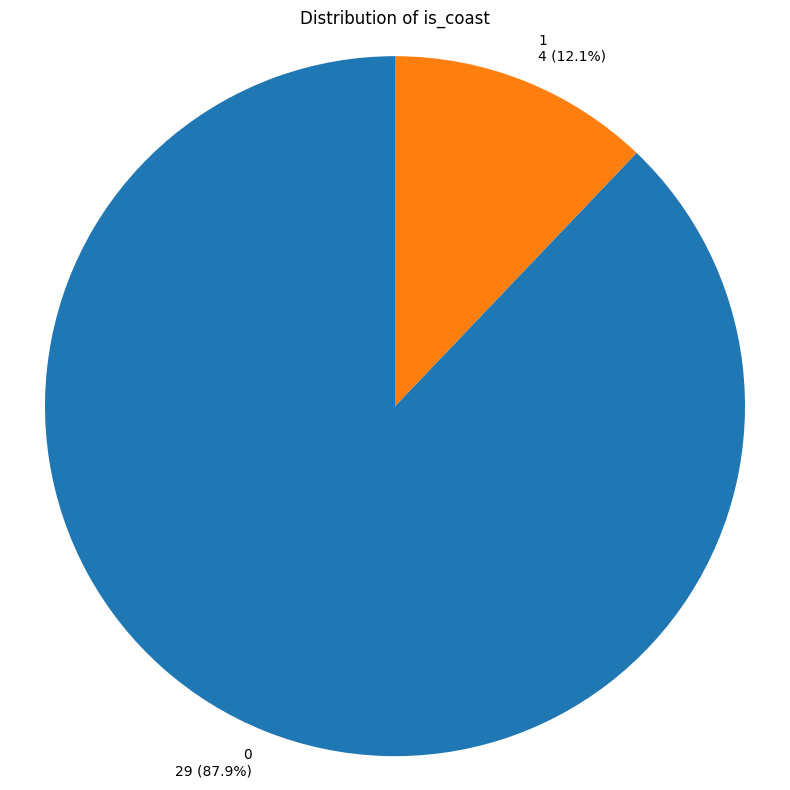

In [12]:
# Call the function
plot_pie_chart(df_omsk, column=column_to_visualize)

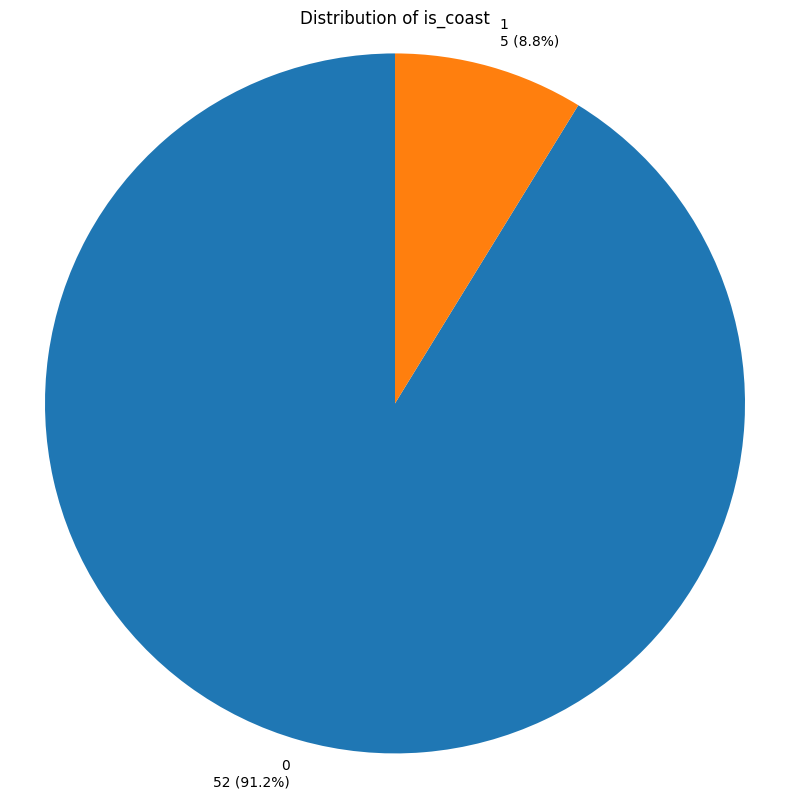

In [13]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)

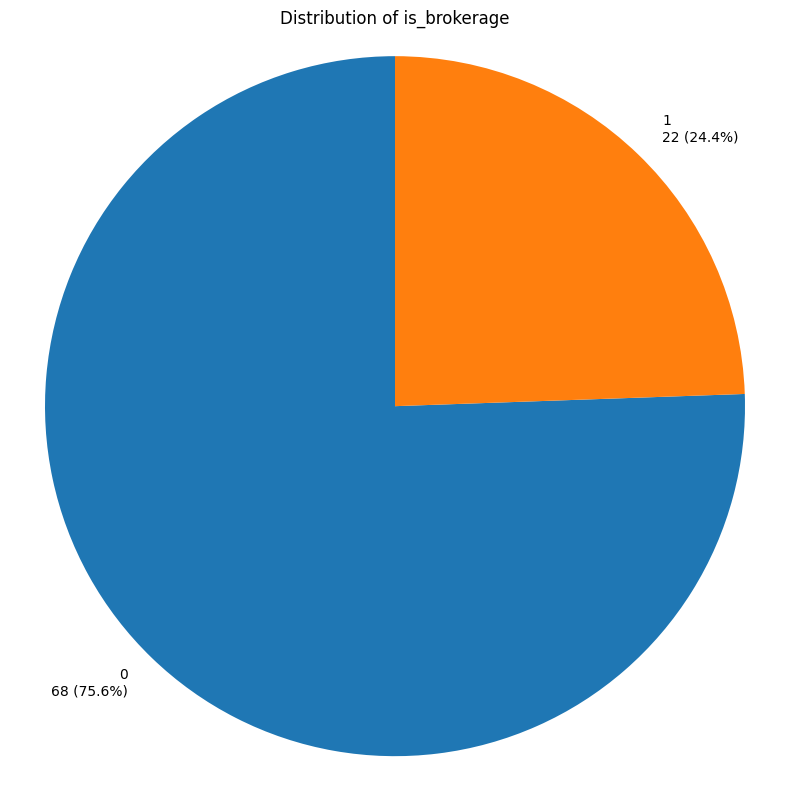

In [14]:
# Specify the column you want to visualize
column_to_visualize = 'is_brokerage'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

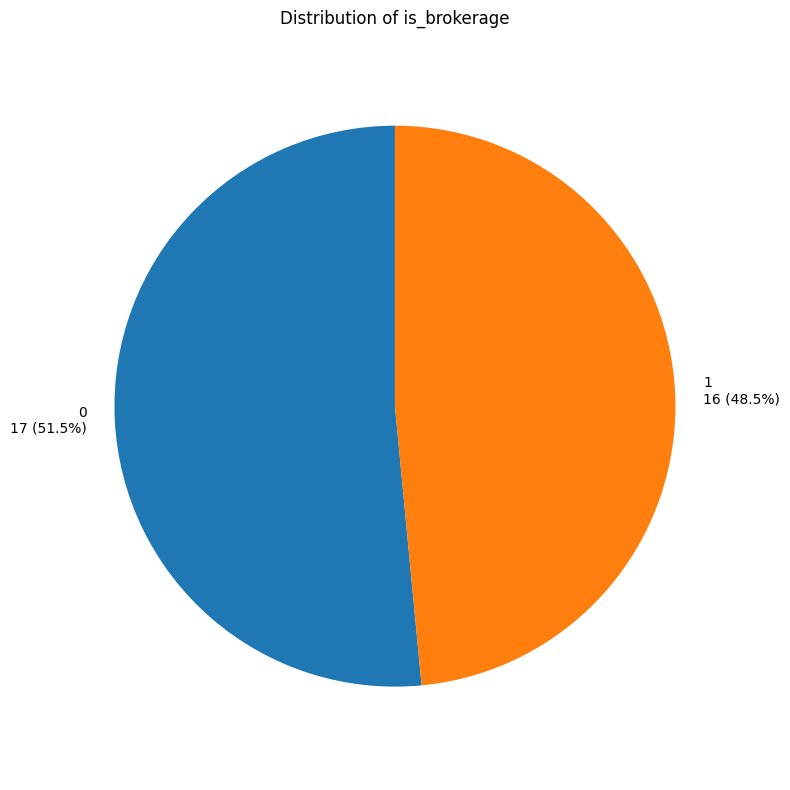

In [15]:
# Call the function
plot_pie_chart(df_omsk, column=column_to_visualize)

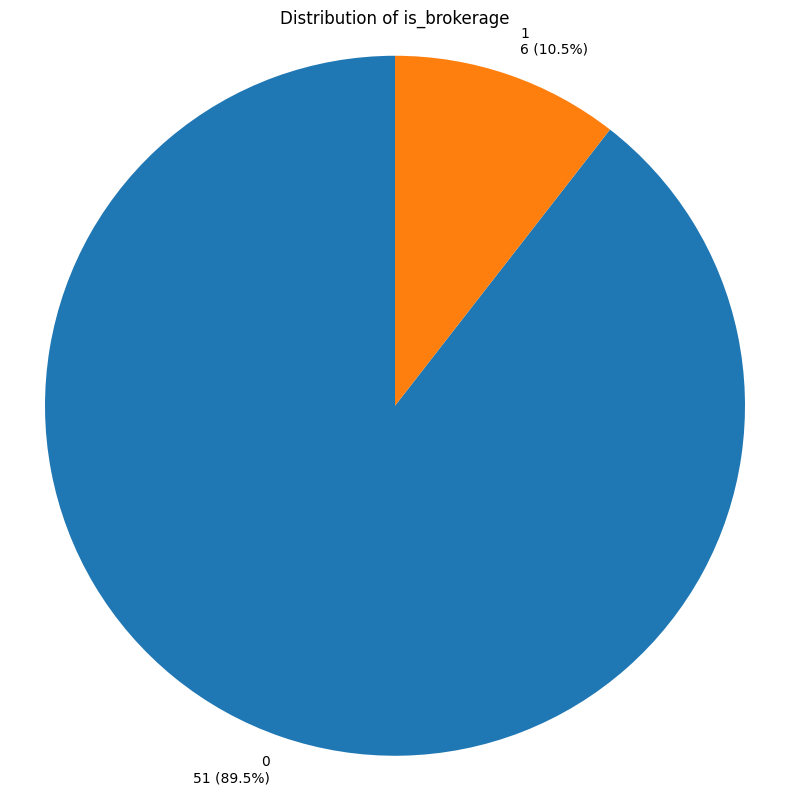

In [16]:
# Call the function
plot_pie_chart(df_not_omsk, column=column_to_visualize)

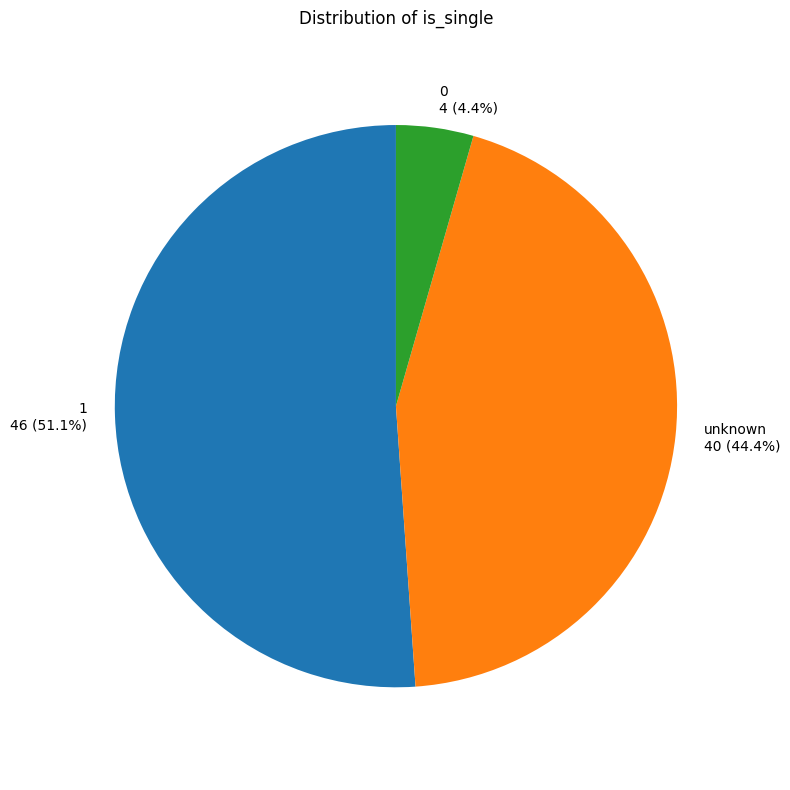

In [17]:
# Specify the column you want to visualize
column_to_visualize = 'is_single'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

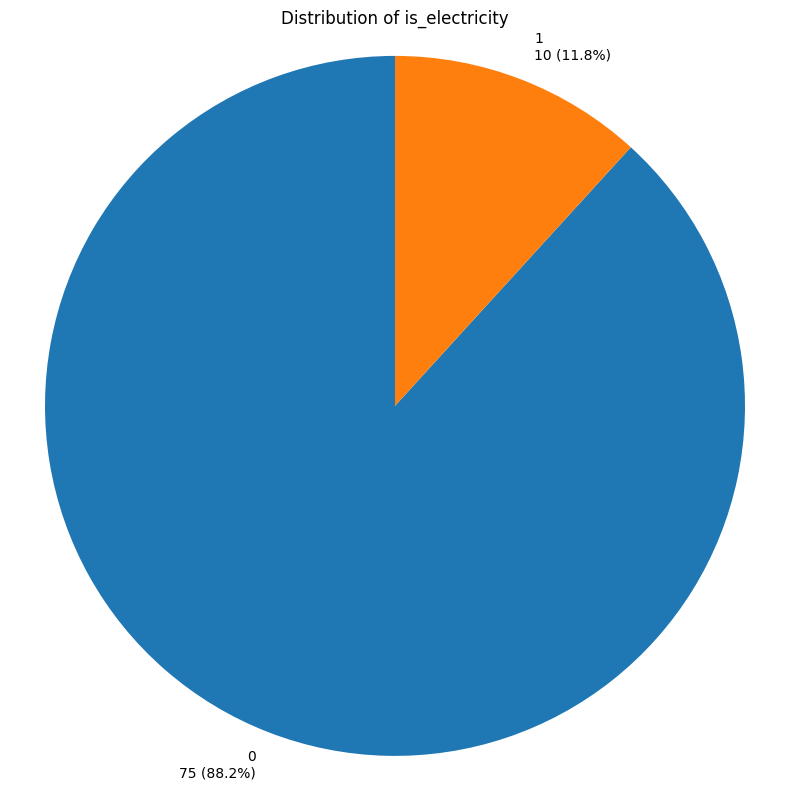

In [19]:
# Specify the column you want to visualize
column_to_visualize = 'is_electricity'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

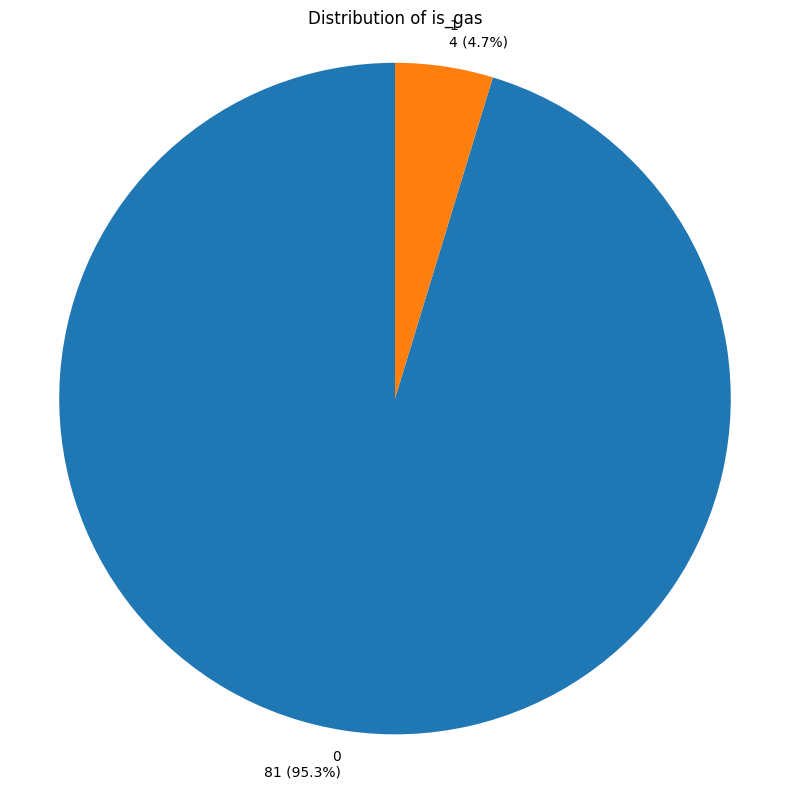

In [20]:
# Specify the column you want to visualize
column_to_visualize = 'is_gas'

# Call the function
plot_pie_chart(df, column=column_to_visualize)

## Изолированный анализ

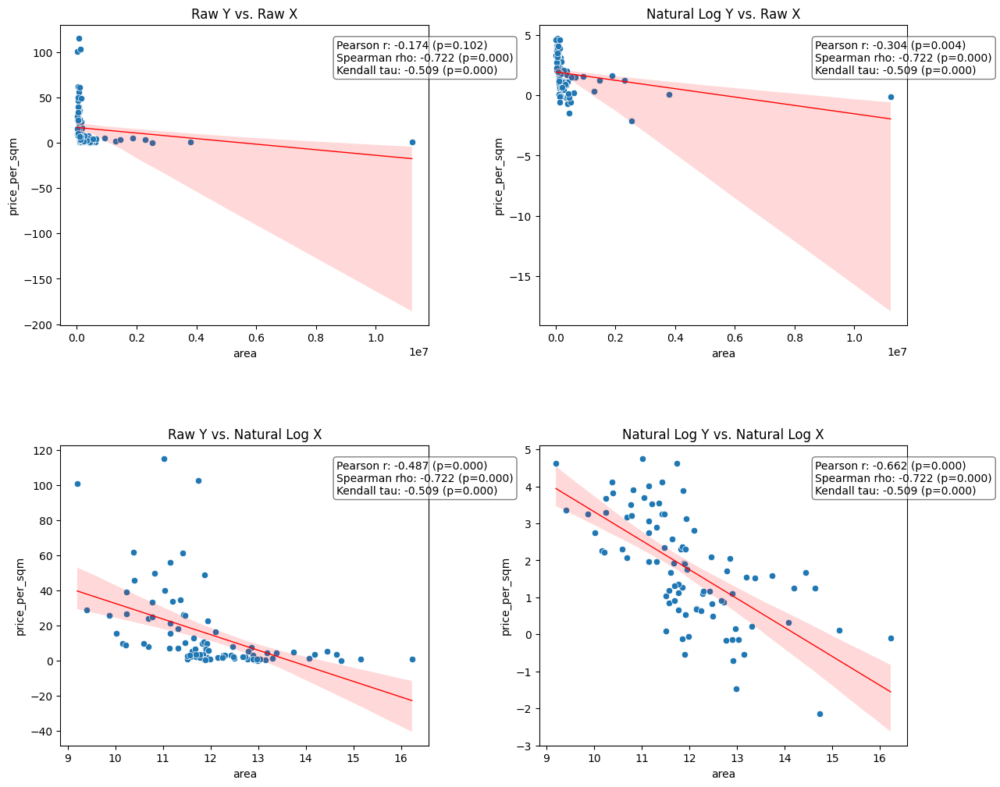

In [18]:
# Specify the columns
price_column = 'price_per_sqm'  # Your price per sqm column
variable_column = 'area'        # The variable you want to analyze (e.g., 'area')

# Call the function
plot_isolated_analysis(df, price_column=price_column, variable_column=variable_column, log_base=np.e)


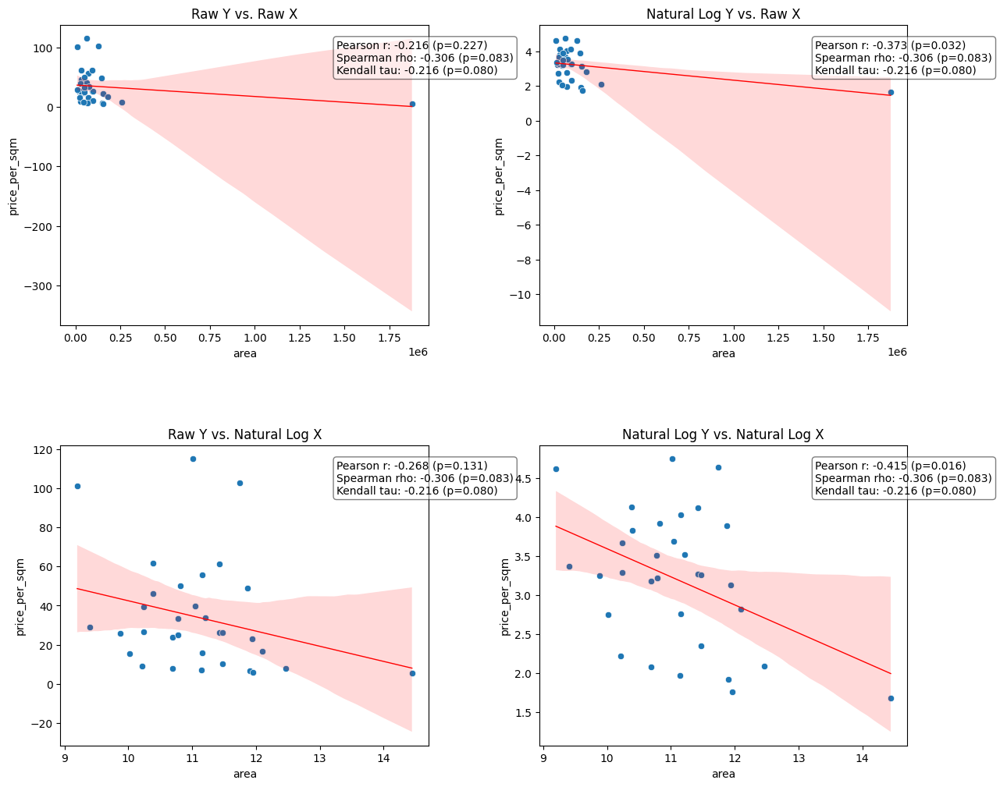

In [19]:
# Call the function
plot_isolated_analysis(df_omsk, price_column=price_column, variable_column=variable_column, log_base=np.e)

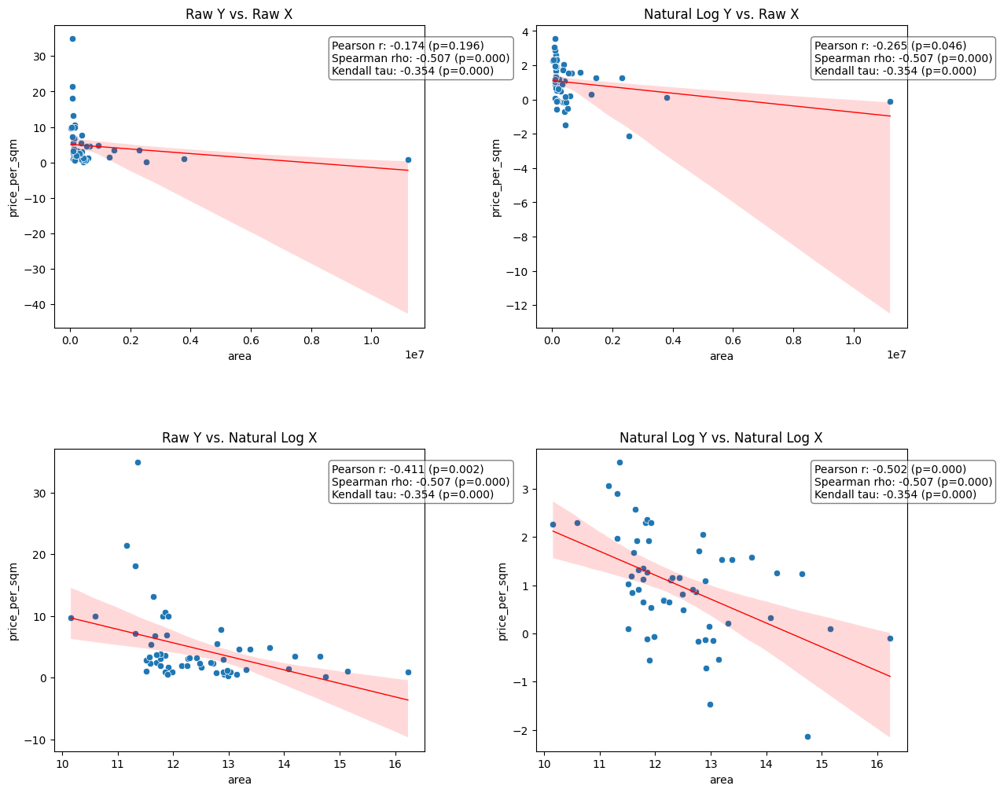

In [20]:
# Call the function
plot_isolated_analysis(df_not_omsk, price_column=price_column, variable_column=variable_column, log_base=np.e)

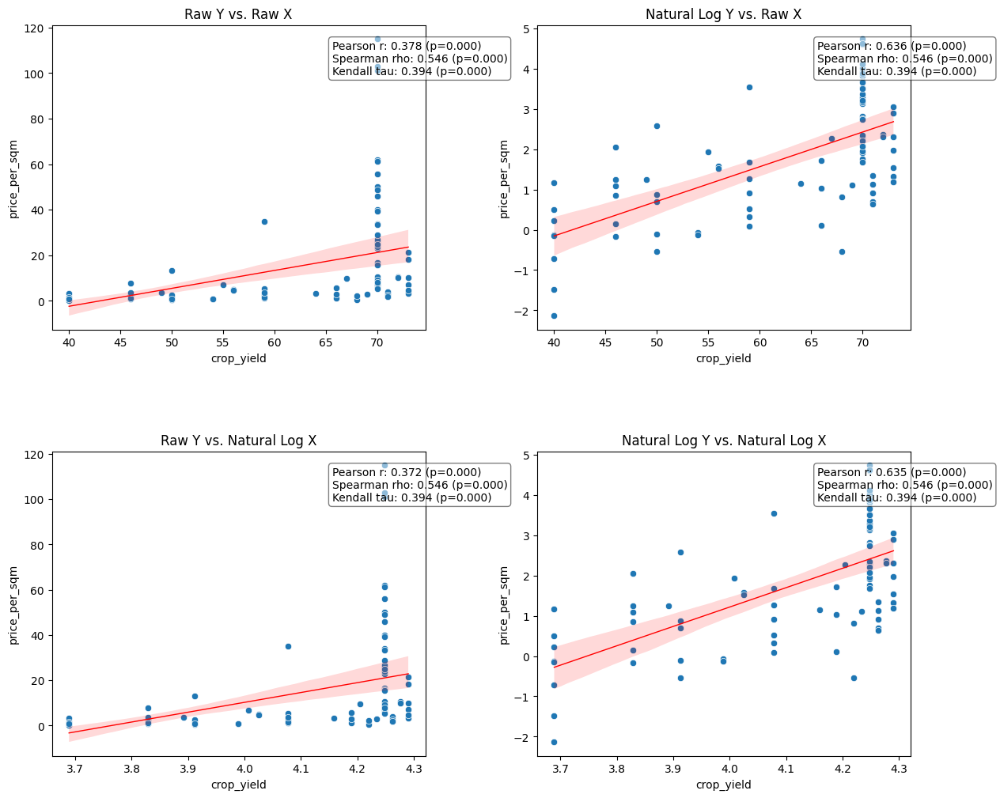

In [21]:
# Specify the columns
price_column = 'price_per_sqm'  # Your price per sqm column
variable_column = 'crop_yield'        # The variable you want to analyze (e.g., 'area')

# Call the function
plot_isolated_analysis(df, price_column=price_column, variable_column=variable_column, log_base=np.e)

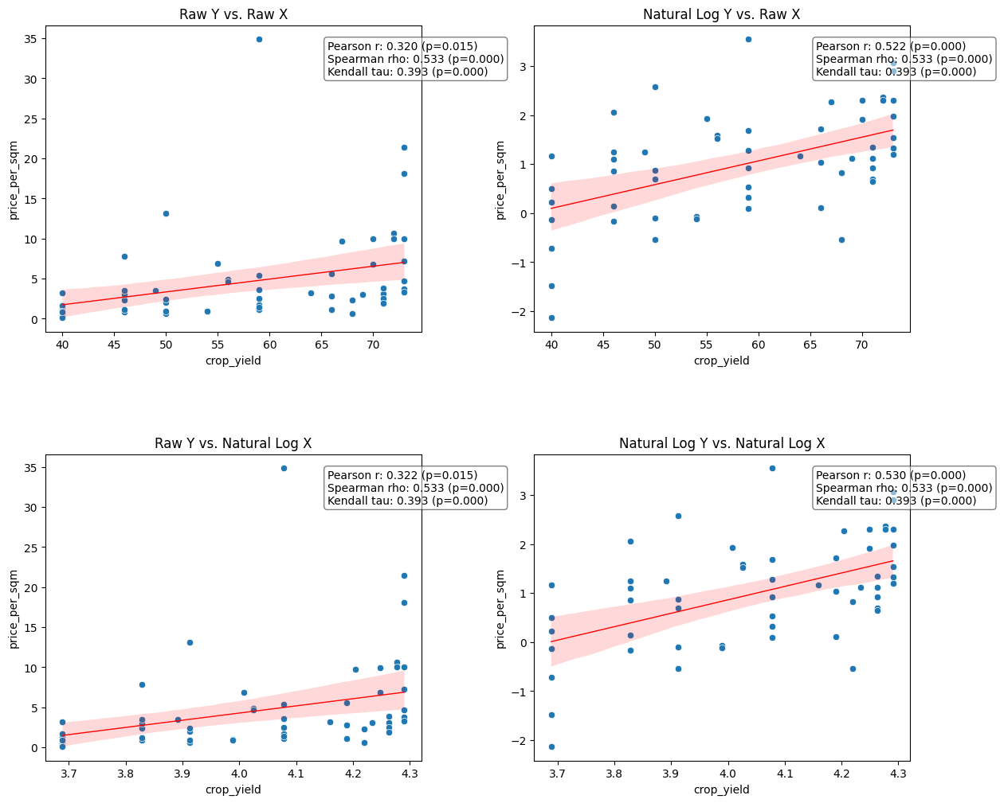

In [23]:
# Call the function
plot_isolated_analysis(df_not_omsk, price_column=price_column, variable_column=variable_column, log_base=np.e)

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.


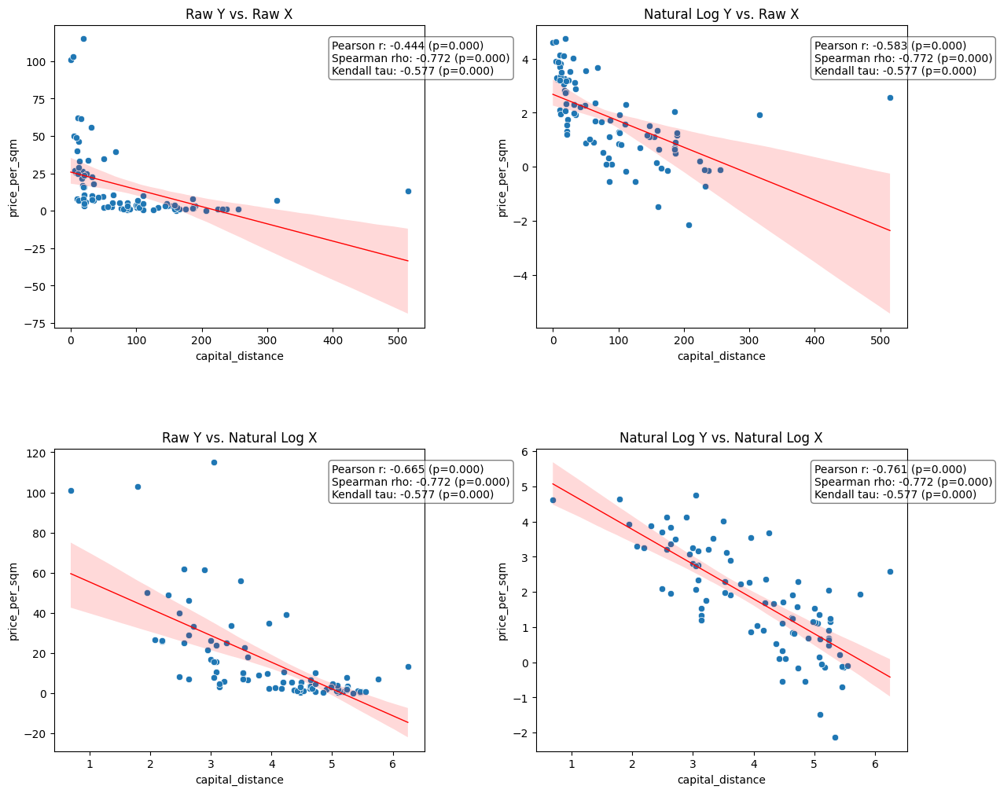

In [25]:
# Specify the columns
price_column = 'price_per_sqm'  # Your price per sqm column
variable_column = 'capital_distance'        # The variable you want to analyze (e.g., 'area')

# Call the function
plot_isolated_analysis(df, price_column=price_column, variable_column=variable_column, log_base=np.e)

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.


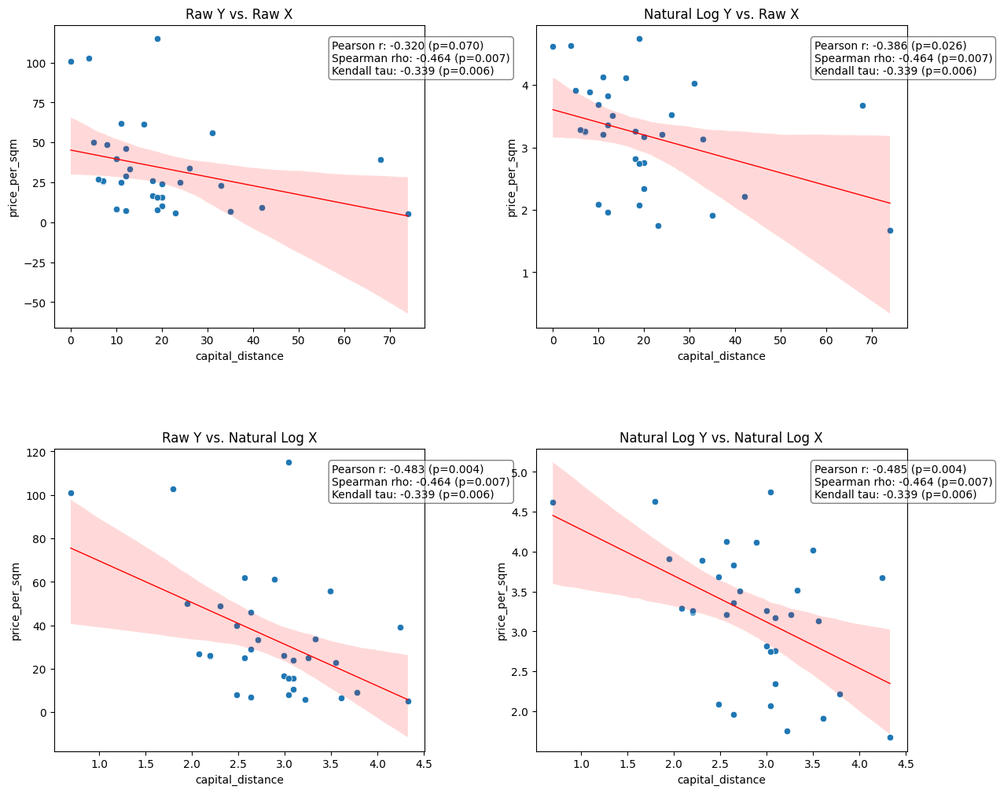

In [26]:
# Call the function
plot_isolated_analysis(df_omsk, price_column=price_column, variable_column=variable_column, log_base=np.e)

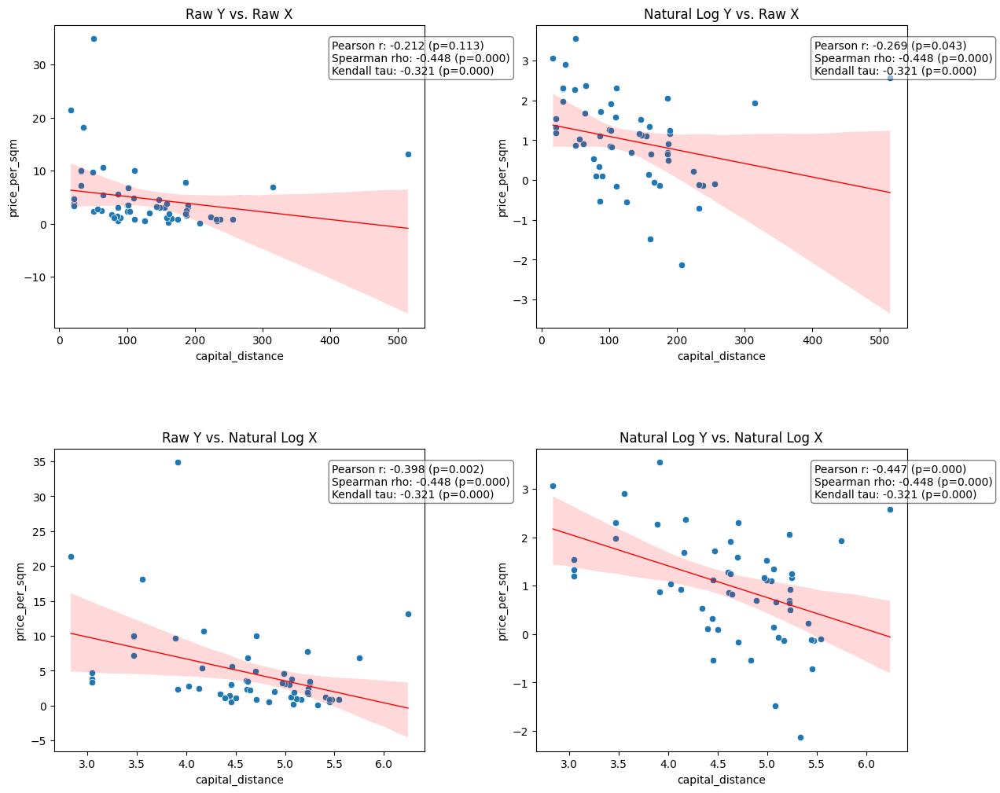

In [27]:
# Call the function
plot_isolated_analysis(df_not_omsk, price_column=price_column, variable_column=variable_column, log_base=np.e)

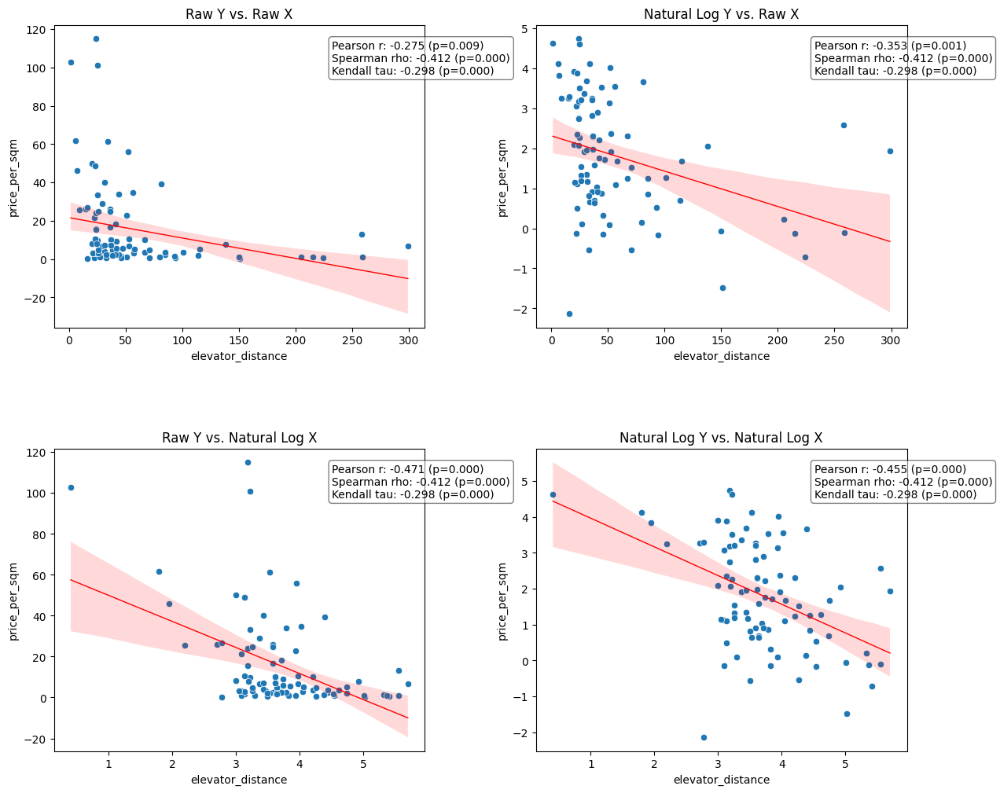

In [28]:
# Specify the columns
price_column = 'price_per_sqm'  # Your price per sqm column
variable_column = 'elevator_distance'        # The variable you want to analyze (e.g., 'area')

# Call the function
plot_isolated_analysis(df, price_column=price_column, variable_column=variable_column, log_base=np.e)

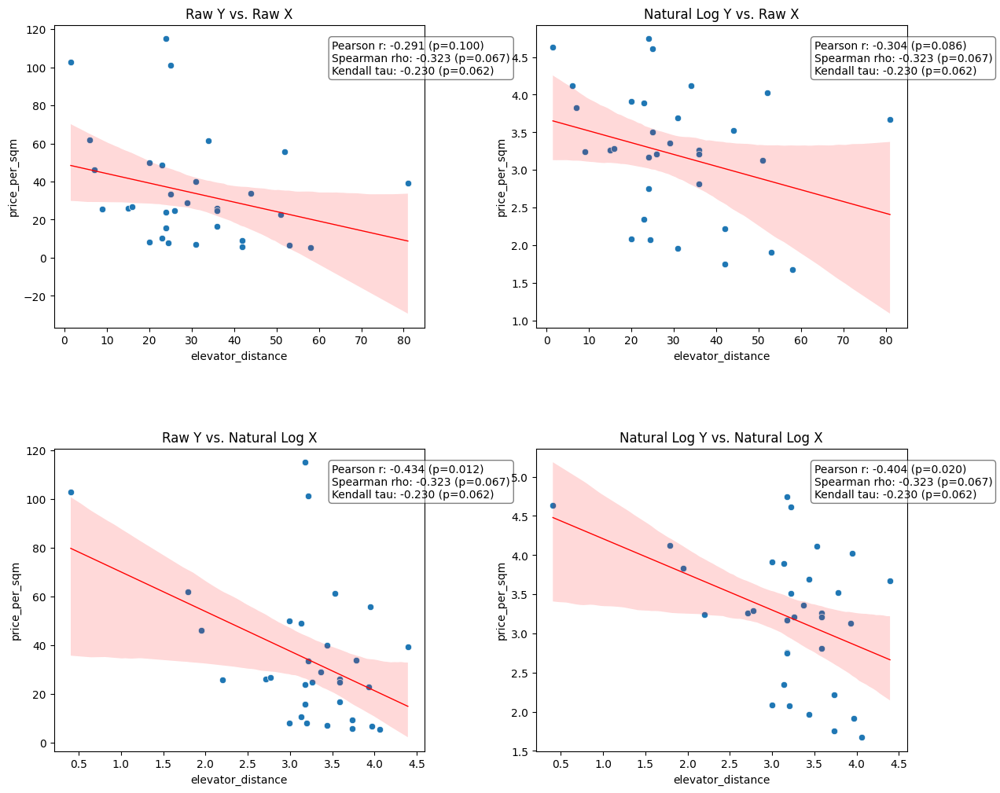

In [29]:
# Call the function
plot_isolated_analysis(df_omsk, price_column=price_column, variable_column=variable_column, log_base=np.e)

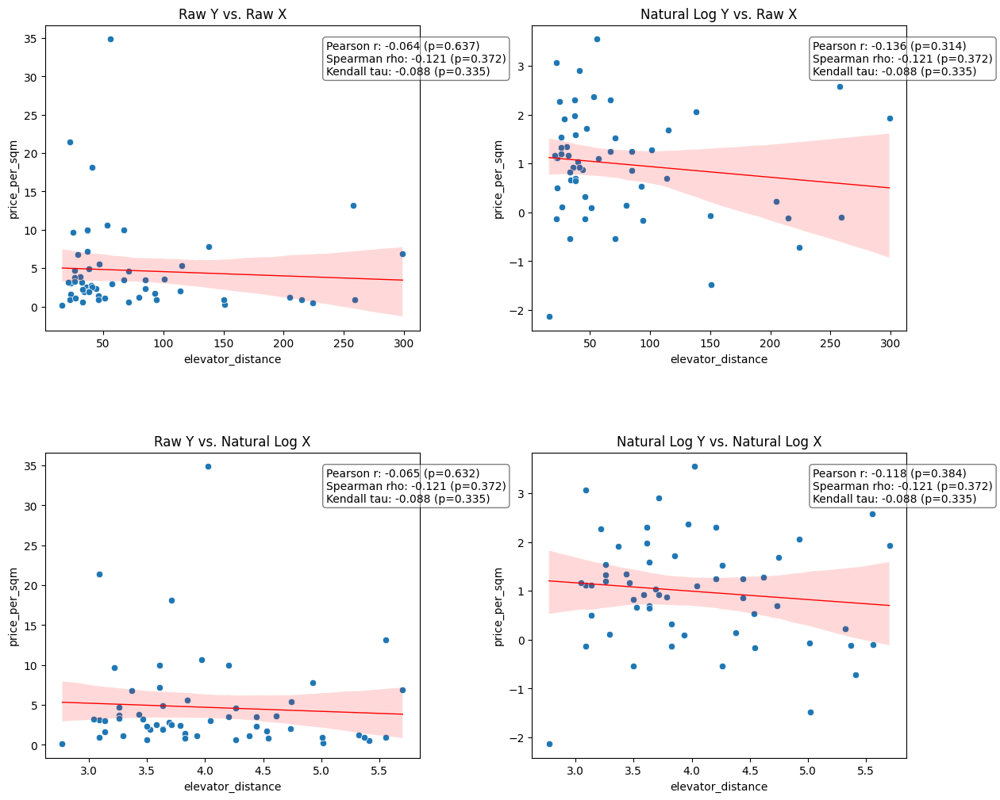

In [30]:
# Call the function
plot_isolated_analysis(df_not_omsk, price_column=price_column, variable_column=variable_column, log_base=np.e)

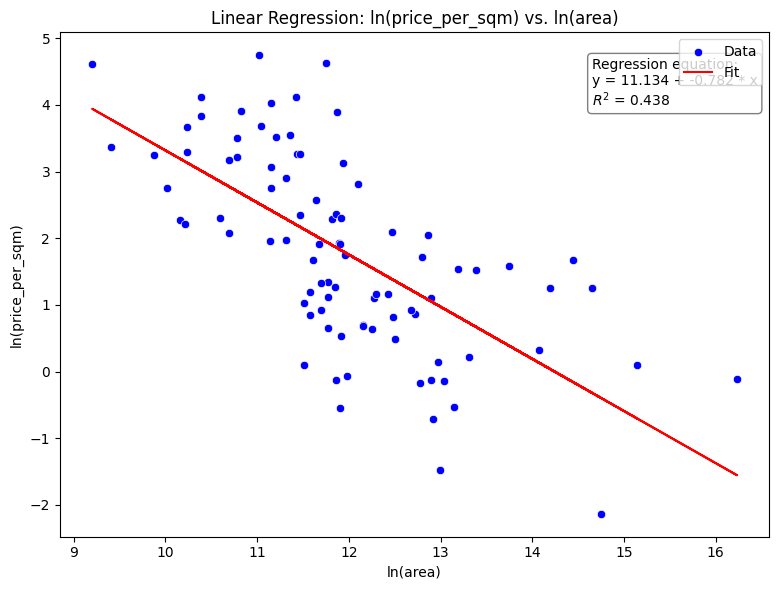

In [31]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df, y_column='price_per_sqm', x_column='area', use_log_y=True, use_log_x=True)

In [32]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df, y_column, x_column, use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.438
Model:                            OLS   Adj. R-squared:                  0.432
Method:                 Least Squares   F-statistic:                     68.60
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           1.22e-12
Time:                        17:06:47   Log-Likelihood:                -136.00
No. Observations:                  90   AIC:                             276.0
Df Residuals:                      88   BIC:                             281.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.1339      1.132      9.832      0.0

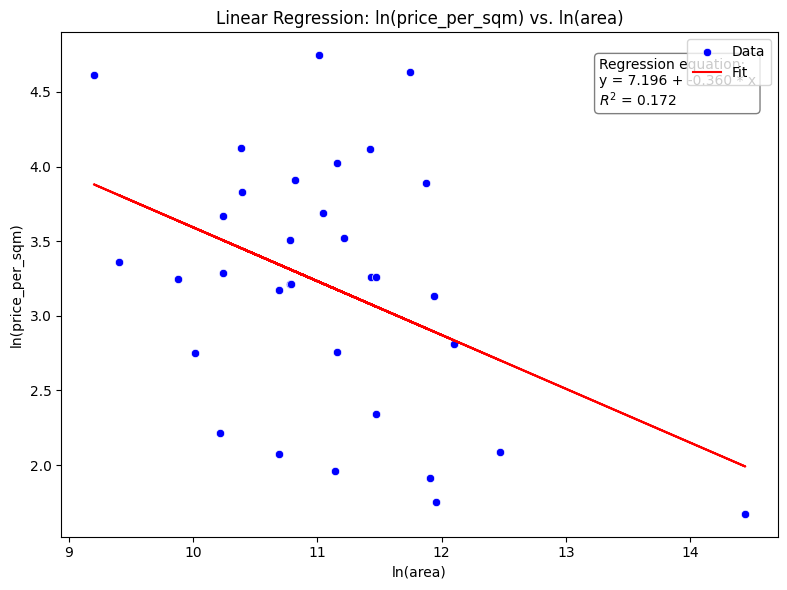

In [33]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df_omsk, y_column='price_per_sqm', x_column='area', use_log_y=True, use_log_x=True)

In [34]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_omsk, y_column, x_column, use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.172
Model:                            OLS   Adj. R-squared:                  0.145
Method:                 Least Squares   F-statistic:                     6.434
Date:                Sat, 09 Nov 2024   Prob (F-statistic):             0.0164
Time:                        17:40:29   Log-Likelihood:                -37.957
No. Observations:                  33   AIC:                             79.91
Df Residuals:                      31   BIC:                             82.91
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.1961      1.580      4.556      0.0

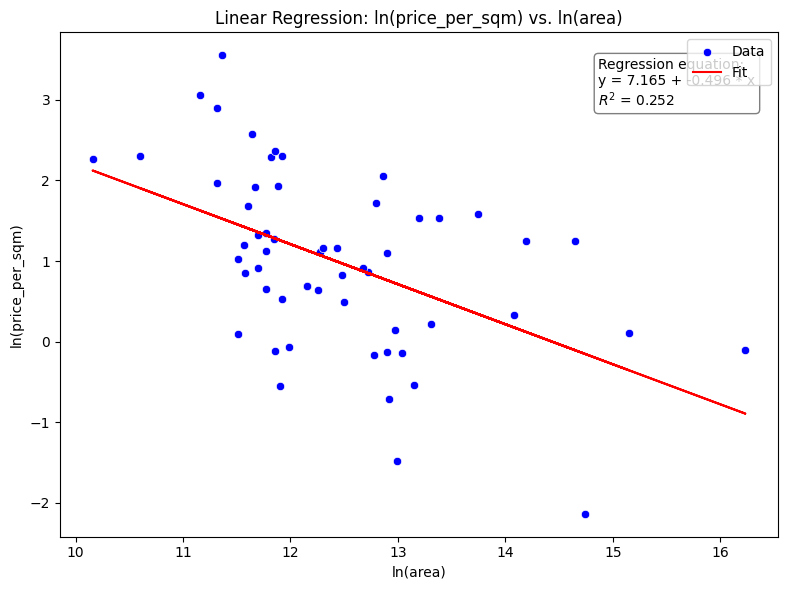

In [35]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df_not_omsk, y_column='price_per_sqm', x_column='area', use_log_y=True, use_log_x=True)

In [36]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'area'            # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_not_omsk, y_column, x_column, use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.252
Model:                            OLS   Adj. R-squared:                  0.238
Method:                 Least Squares   F-statistic:                     18.52
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           6.95e-05
Time:                        17:43:25   Log-Likelihood:                -77.310
No. Observations:                  57   AIC:                             158.6
Df Residuals:                      55   BIC:                             162.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.1651      1.439      4.978      0.0

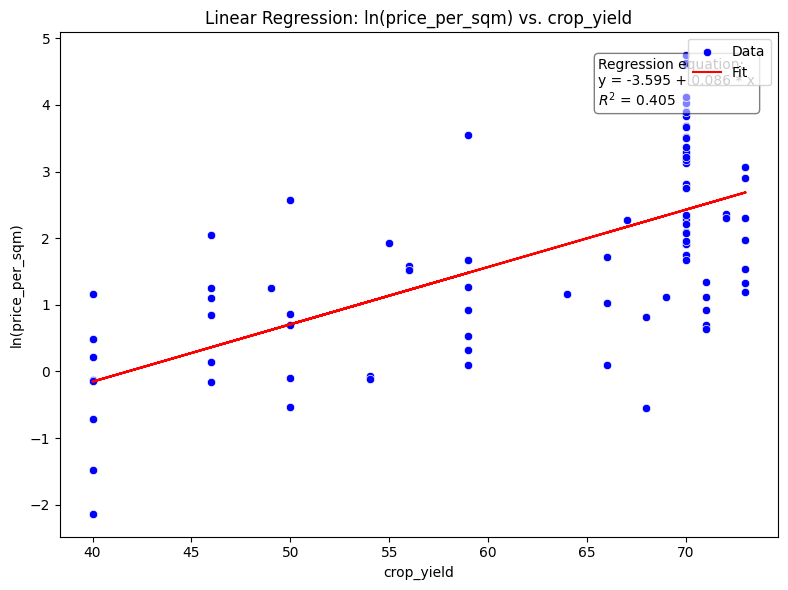

In [6]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'crop_yield'      # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df, y_column='price_per_sqm', x_column='crop_yield', use_log_y=True, use_log_x=False)

In [7]:
# Specify the columns
y_column = 'price_per_sqm'   # Dependent variable
x_column = 'crop_yield'      # Independent variable

# Transformed values for Y Raw values X
results = perform_linear_regression(df, y_column, x_column, use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.405
Model:                            OLS   Adj. R-squared:                  0.398
Method:                 Least Squares   F-statistic:                     59.85
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           1.60e-11
Time:                        17:58:52   Log-Likelihood:                -138.59
No. Observations:                  90   AIC:                             281.2
Df Residuals:                      88   BIC:                             286.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.5950      0.708     -5.075      0.0

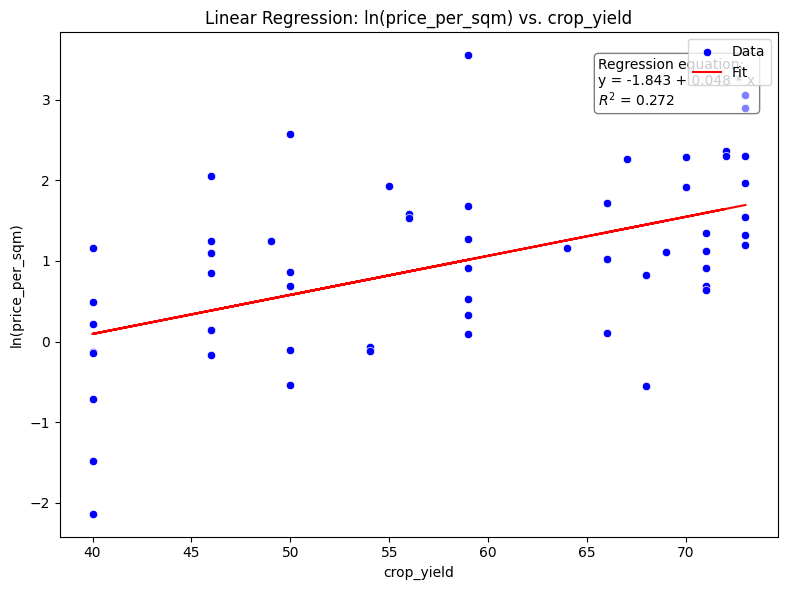

In [9]:
# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df_not_omsk, y_column='price_per_sqm', x_column='crop_yield', use_log_y=True, use_log_x=False)

In [10]:
# Transformed values for Y Raw values X
results = perform_linear_regression(df_not_omsk, y_column, x_column, use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.272
Model:                            OLS   Adj. R-squared:                  0.259
Method:                 Least Squares   F-statistic:                     20.57
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           3.16e-05
Time:                        17:59:31   Log-Likelihood:                -76.528
No. Observations:                  57   AIC:                             157.1
Df Residuals:                      55   BIC:                             161.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.8428      0.638     -2.888      0.0

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.


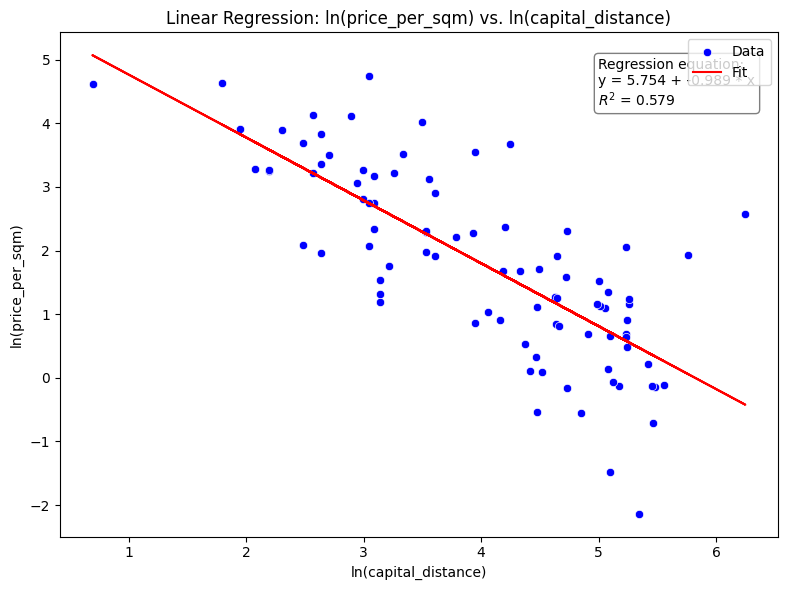

In [11]:
# Specify the columns
y_column = 'price_per_sqm'       # Dependent variable
x_column = 'capital_distance'    # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df, y_column=y_column, x_column=x_column, use_log_y=True, use_log_x=True)

In [12]:
# Specify the columns
y_column = 'price_per_sqm'       # Dependent variable
x_column = 'capital_distance'    # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df, y_column, x_column,
                                    use_log_y=True, use_log_x=True)

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.
                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.579
Model:                            OLS   Adj. R-squared:                  0.574
Method:                 Least Squares   F-statistic:                     120.9
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           3.32e-18
Time:                        18:02:27   Log-Likelihood:                -123.03
No. Observations:                  90   AIC:                             250.1
Df Residuals:                      88   BIC:                             255.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.


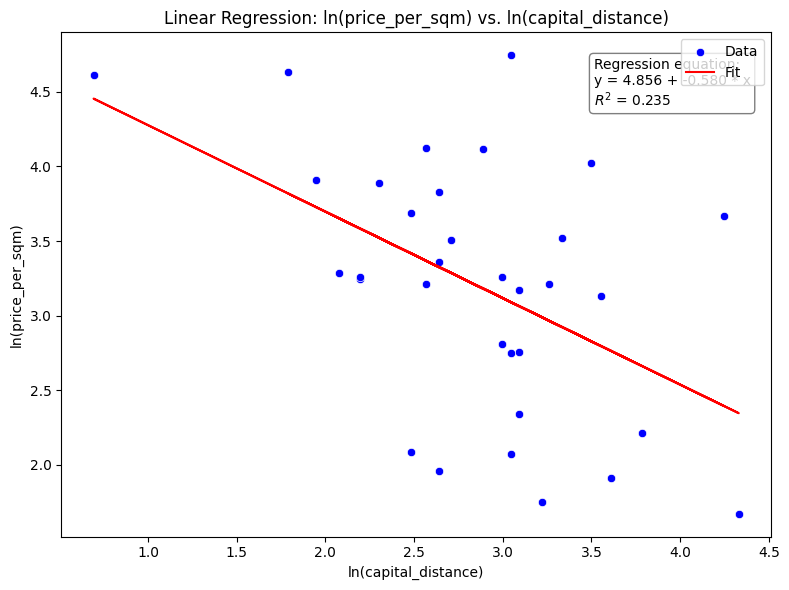

In [13]:
# Specify the columns
y_column = 'price_per_sqm'       # Dependent variable
x_column = 'capital_distance'    # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df_omsk, y_column=y_column, x_column=x_column, use_log_y=True, use_log_x=True)

In [14]:
# Specify the columns
y_column = 'price_per_sqm'       # Dependent variable
x_column = 'capital_distance'    # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=True)

Data in 'capital_distance' contains zero or negative values. Shifting data by 2.00000.
                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.235
Model:                            OLS   Adj. R-squared:                  0.210
Method:                 Least Squares   F-statistic:                     9.531
Date:                Sat, 09 Nov 2024   Prob (F-statistic):            0.00423
Time:                        18:03:52   Log-Likelihood:                -36.646
No. Observations:                  33   AIC:                             77.29
Df Residuals:                      31   BIC:                             80.28
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

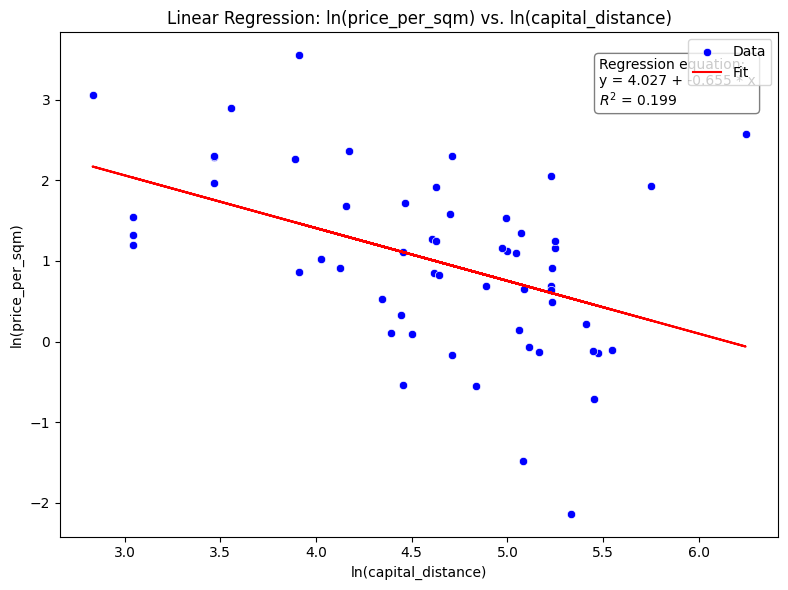

In [15]:
# Specify the columns
y_column = 'price_per_sqm'       # Dependent variable
x_column = 'capital_distance'    # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df_not_omsk, y_column=y_column, x_column=x_column, use_log_y=True, use_log_x=True)

In [16]:
# Specify the columns
y_column = 'price_per_sqm'       # Dependent variable
x_column = 'capital_distance'    # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_not_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.199
Model:                            OLS   Adj. R-squared:                  0.185
Method:                 Least Squares   F-statistic:                     13.71
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           0.000497
Time:                        18:04:05   Log-Likelihood:                -79.241
No. Observations:                  57   AIC:                             162.5
Df Residuals:                      55   BIC:                             166.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                4.0267      0.829  

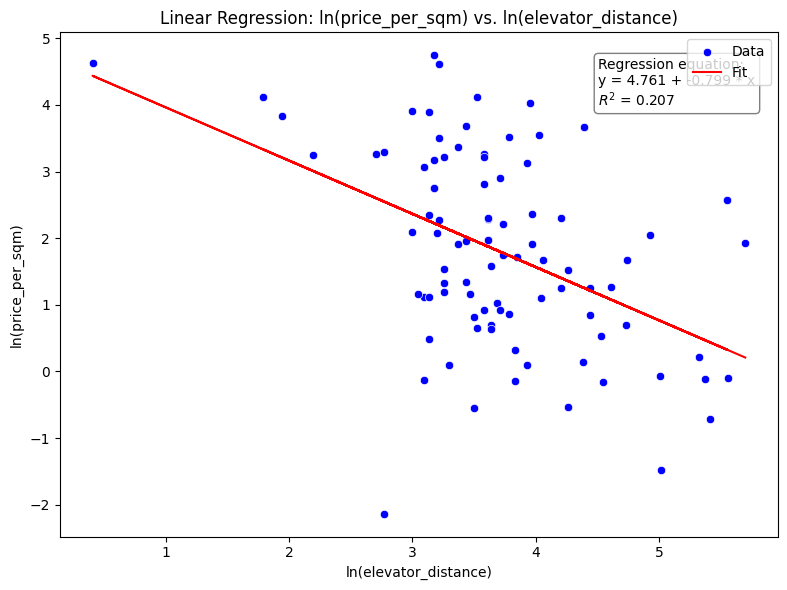

In [17]:
# Specify the columns
y_column = 'price_per_sqm'     # Dependent variable
x_column = 'elevator_distance' # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df, y_column=y_column, x_column=x_column, use_log_y=True, use_log_x=True)

In [18]:
# Specify the columns
y_column = 'price_per_sqm'        # Dependent variable
x_column = 'elevator_distance'    # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df, y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.207
Model:                            OLS   Adj. R-squared:                  0.198
Method:                 Least Squares   F-statistic:                     23.00
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           6.55e-06
Time:                        18:12:33   Log-Likelihood:                -151.49
No. Observations:                  90   AIC:                             307.0
Df Residuals:                      88   BIC:                             312.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 4.7609      0.63

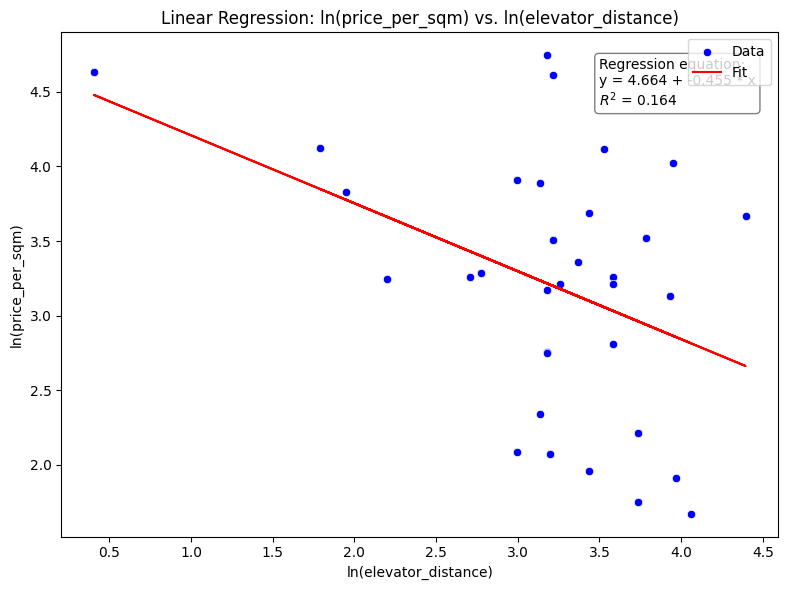

In [19]:
# Specify the columns
y_column = 'price_per_sqm'     # Dependent variable
x_column = 'elevator_distance' # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df_omsk, y_column=y_column, x_column=x_column, use_log_y=True, use_log_x=True)

In [20]:
# Specify the columns
y_column = 'price_per_sqm'        # Dependent variable
x_column = 'elevator_distance'    # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.164
Model:                            OLS   Adj. R-squared:                  0.137
Method:                 Least Squares   F-statistic:                     6.061
Date:                Sat, 09 Nov 2024   Prob (F-statistic):             0.0196
Time:                        18:13:50   Log-Likelihood:                -38.123
No. Observations:                  33   AIC:                             80.25
Df Residuals:                      31   BIC:                             83.24
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 4.6643      0.60

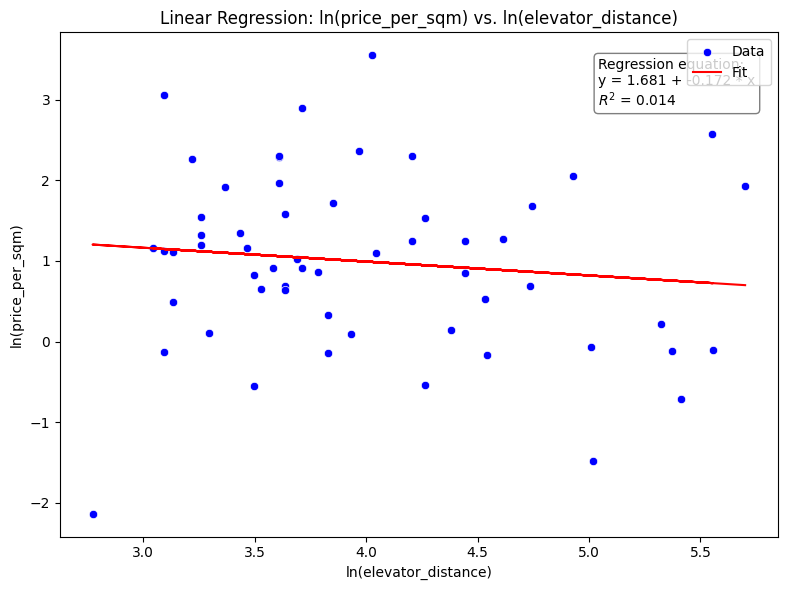

In [21]:
# Specify the columns
y_column = 'price_per_sqm'     # Dependent variable
x_column = 'elevator_distance' # Independent variable

# Analyze the relationship with log-transformed Y and X
linear_regression_plot(df_not_omsk, y_column=y_column, x_column=x_column, use_log_y=True, use_log_x=True)

In [22]:
# Specify the columns
y_column = 'price_per_sqm'        # Dependent variable
x_column = 'elevator_distance'    # Independent variable

# Example 1: Raw values for both Y and X
results = perform_linear_regression(df_not_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=True)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.7703
Date:                Sat, 09 Nov 2024   Prob (F-statistic):              0.384
Time:                        18:14:00   Log-Likelihood:                -85.186
No. Observations:                  57   AIC:                             174.4
Df Residuals:                      55   BIC:                             178.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 1.6809      0.79

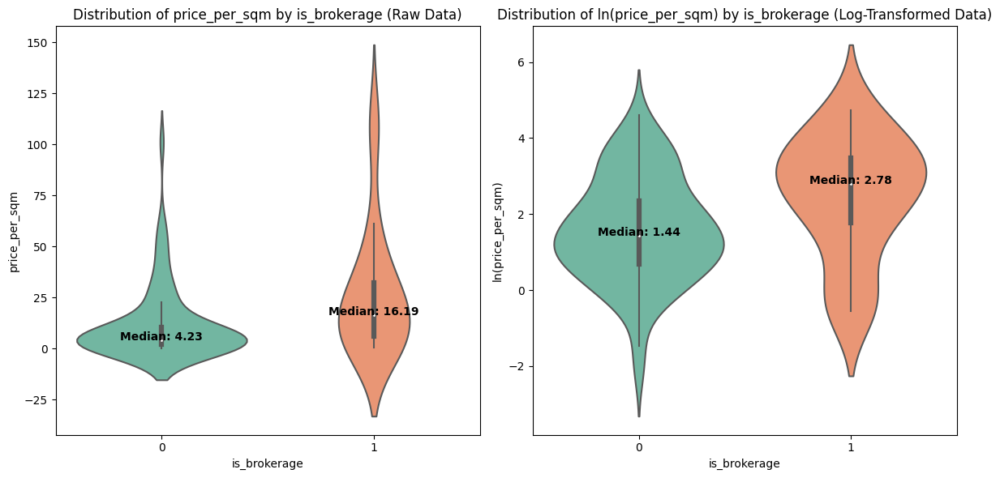

In [24]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df, y_column, x_column)

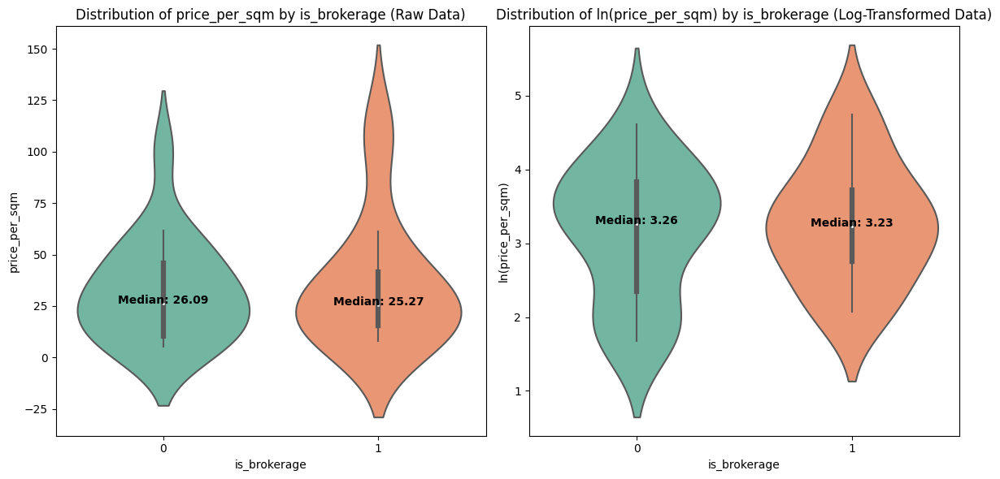

In [25]:
# Call the function
plot_violin_comparison(df_omsk, y_column, x_column)

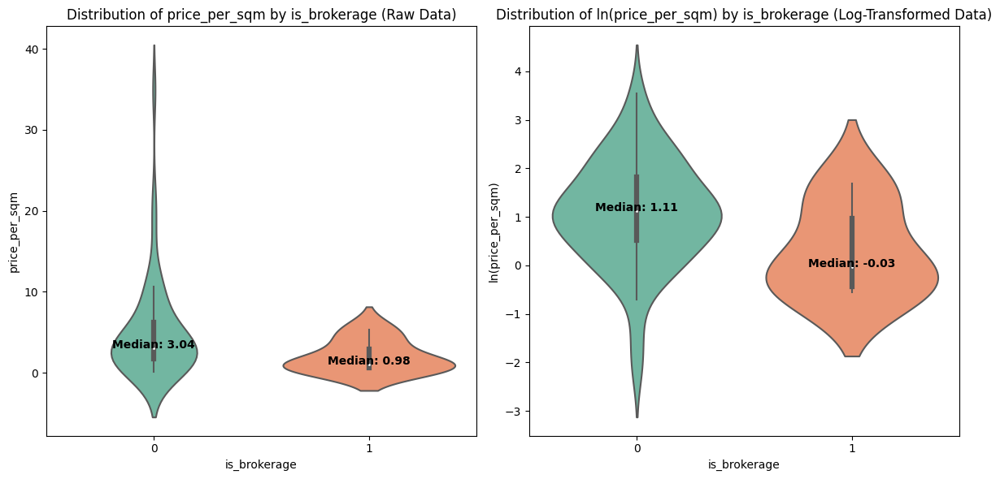

In [26]:
# Call the function
plot_violin_comparison(df_not_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

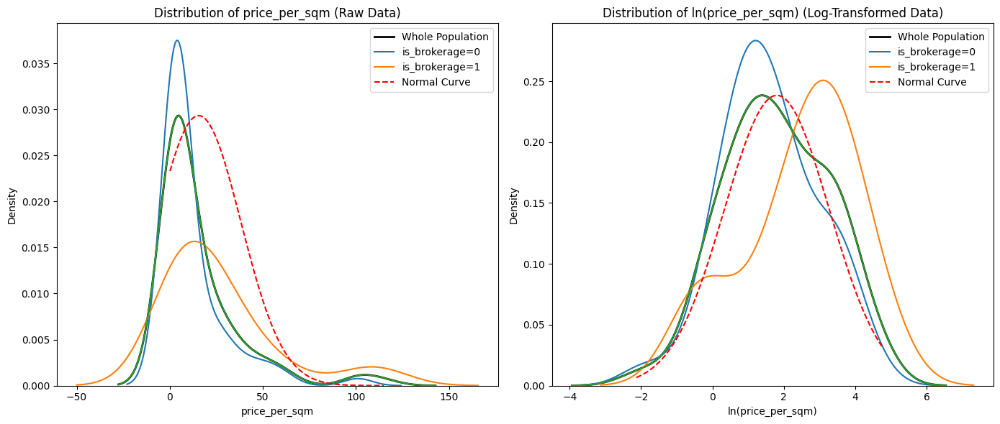

In [27]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function
plot_kde_comparison(df, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

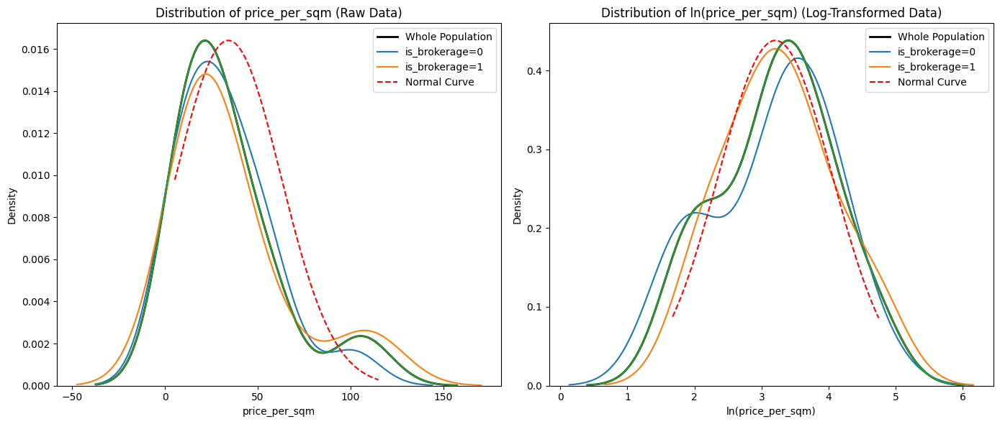

In [28]:
# Call the function
plot_kde_comparison(df_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

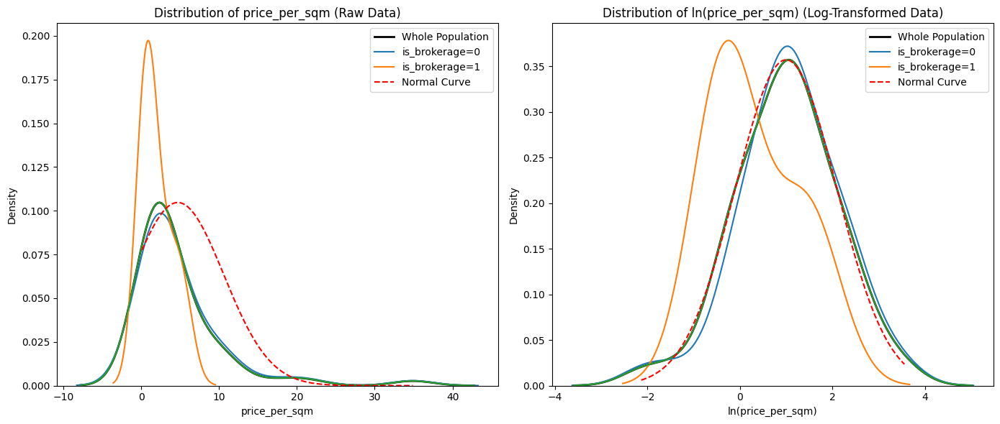

In [29]:
# Call the function
plot_kde_comparison(df_not_omsk, y_column, x_column)

In [30]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function
results = perform_mann_whitney_tests(df, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 4.2308
Group 1 Median: 16.1907
U Statistic: 495.0000
P-value: 0.0178
Effect Size (Rank-Biserial Correlation): 0.3382
Sample Sizes: n0 = 68, n1 = 22

Log-Transformed Data:
Group 0 Median: 1.4382
Group 1 Median: 2.7840
U Statistic: 495.0000
P-value: 0.0178
Effect Size (Rank-Biserial Correlation): 0.3382
Sample Sizes: n0 = 68, n1 = 22
Log Base Used: 2.718281828459045


In [32]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function
results = perform_mann_whitney_tests(df_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 26.0870
Group 1 Median: 25.2686
U Statistic: 133.0000
P-value: 0.9282
Effect Size (Rank-Biserial Correlation): 0.0221
Sample Sizes: n0 = 17, n1 = 16

Log-Transformed Data:
Group 0 Median: 3.2614
Group 1 Median: 3.2295
U Statistic: 133.0000
P-value: 0.9282
Effect Size (Rank-Biserial Correlation): 0.0221
Sample Sizes: n0 = 17, n1 = 16
Log Base Used: 2.718281828459045


In [33]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function
results = perform_mann_whitney_tests(df_not_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 3.0370
Group 1 Median: 0.9774
U Statistic: 220.0000
P-value: 0.0838
Effect Size (Rank-Biserial Correlation): -0.4379
Sample Sizes: n0 = 51, n1 = 6

Log-Transformed Data:
Group 0 Median: 1.1109
Group 1 Median: -0.0318
U Statistic: 220.0000
P-value: 0.0838
Effect Size (Rank-Biserial Correlation): -0.4379
Sample Sizes: n0 = 51, n1 = 6
Log Base Used: 2.718281828459045


In [34]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function with logarithmic transformation using natural log (default)
results = mann_whitney_effect_sizes(df, y_column, x_column, log_transform=True, alternative='less')

Mann-Whitney U-test Results:
Group 0 (n=68) Median ln(price_per_sqm): 1.4382
Group 1 (n=22) Median ln(price_per_sqm): 2.7840
U Statistic: 495.0000
P-value: 0.0089
Z Statistic: -2.3800
Effect Size r: -0.2509
Cliff's Delta: 0.3382
Cliff's Delta CI (95.0%): (0.0591, 0.6173)
Logarithmic transformation applied using base 2.718281828459045.


In [35]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function with logarithmic transformation using natural log (default)
results = mann_whitney_effect_sizes(df_omsk, y_column, x_column, log_transform=True, alternative='less')

Mann-Whitney U-test Results:
Group 0 (n=17) Median ln(price_per_sqm): 3.2614
Group 1 (n=16) Median ln(price_per_sqm): 3.2295
U Statistic: 133.0000
P-value: 0.4641
Z Statistic: -0.1261
Effect Size r: -0.0219
Cliff's Delta: 0.0221
Cliff's Delta CI (95.0%): (-0.3780, 0.4221)
Logarithmic transformation applied using base 2.718281828459045.


In [36]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_brokerage'   # Binary variable with values 0 and 1

# Call the function with logarithmic transformation using natural log (default)
results = mann_whitney_effect_sizes(df_not_omsk, y_column, x_column, log_transform=True, alternative='less')

Mann-Whitney U-test Results:
Group 0 (n=51) Median ln(price_per_sqm): 1.1109
Group 1 (n=6) Median ln(price_per_sqm): -0.0318
U Statistic: 220.0000
P-value: 0.9604
Z Statistic: 1.7292
Effect Size r: 0.2290
Cliff's Delta: -0.4379
Cliff's Delta CI (95.0%): (-0.9306, 0.0547)
Logarithmic transformation applied using base 2.718281828459045.


In [45]:
df['is_south'] = list(map(lambda x: 1 if x == 'south' else 0, df['climate_zone']))

In [47]:
# Create separate Data Frames for different groups of districts
specific_districts = ['Омский район']  # List of districts to include
df_omsk = df[df['district'].isin(specific_districts)]
df_not_omsk = df[~df['district'].isin(specific_districts)]

In [46]:
print(df[['is_south']].describe())

        is_south
count  90.000000
mean    0.666667
std     0.474045
min     0.000000
25%     0.000000
50%     1.000000
75%     1.000000
max     1.000000


In [50]:
print(df_not_omsk[['is_south']].describe())

        is_south
count  57.000000
mean    0.473684
std     0.503745
min     0.000000
25%     0.000000
50%     0.000000
75%     1.000000
max     1.000000


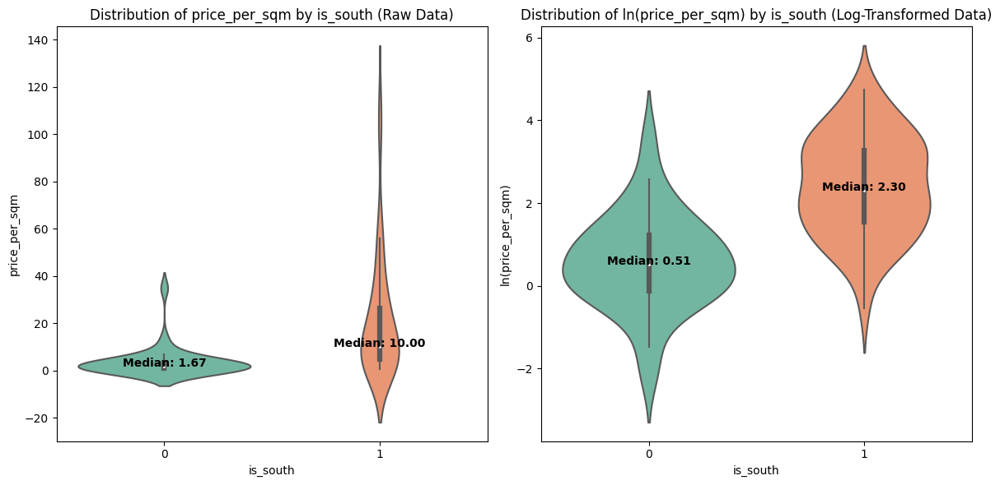

In [51]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_south'   # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df, y_column, x_column)

In [52]:
# Call the function
plot_violin_comparison(df_omsk, y_column, x_column)

Column 'is_south' must be binary with values 0 and 1.


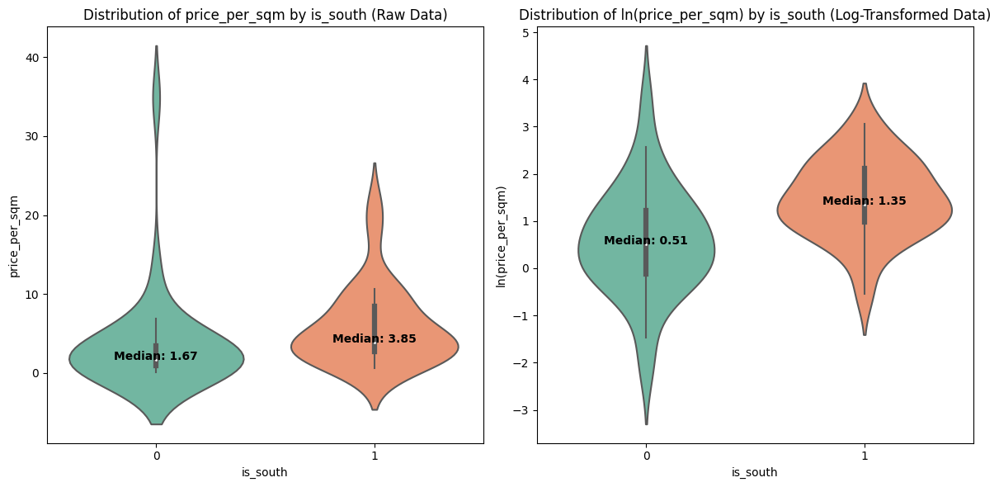

In [53]:
# Call the function
plot_violin_comparison(df_not_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

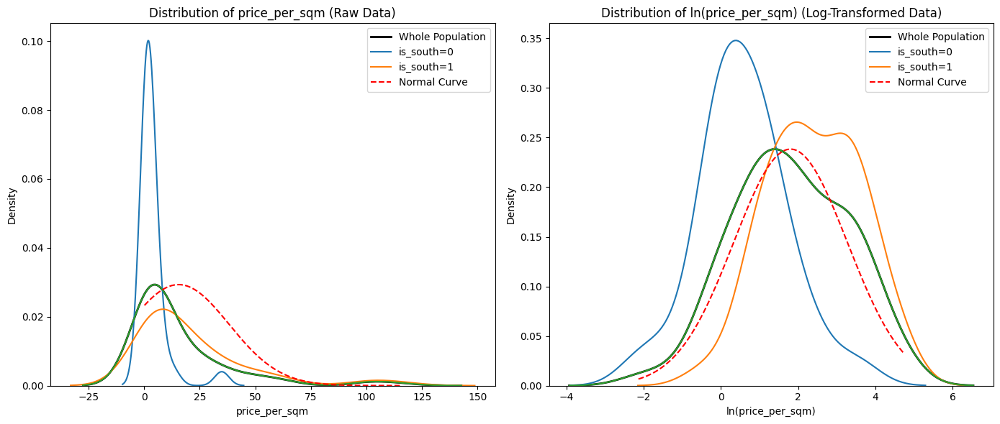

In [54]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_south'       # Binary variable with values 0 and 1

# Call the function
plot_kde_comparison(df, y_column, x_column)

In [55]:
# Call the function
plot_kde_comparison(df_omsk, y_column, x_column)

Column 'is_south' must be binary with values 0 and 1.


/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

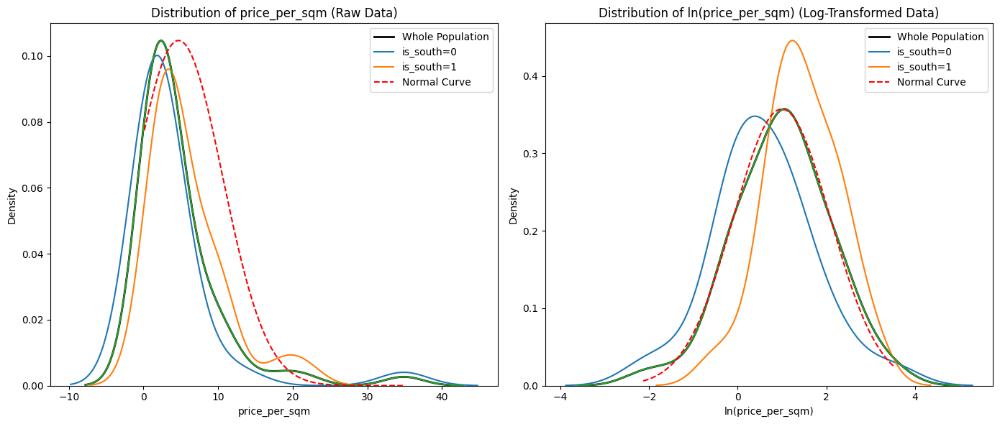

In [56]:
# Call the function
plot_kde_comparison(df_not_omsk, y_column, x_column)

In [58]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_south'   # Binary variable with values 0 and 1

# Call the function
results = perform_mann_whitney_tests(df, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 1.6678
Group 1 Median: 10.0000
U Statistic: 242.0000
P-value: 0.0000
Effect Size (Rank-Biserial Correlation): 0.7311
Sample Sizes: n0 = 30, n1 = 60

Log-Transformed Data:
Group 0 Median: 0.5113
Group 1 Median: 2.3026
U Statistic: 242.0000
P-value: 0.0000
Effect Size (Rank-Biserial Correlation): 0.7311
Sample Sizes: n0 = 30, n1 = 60
Log Base Used: 2.718281828459045


In [59]:
# Call the function
results = perform_mann_whitney_tests(df_not_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 1.6678
Group 1 Median: 3.8462
U Statistic: 204.0000
P-value: 0.0014
Effect Size (Rank-Biserial Correlation): 0.4963
Sample Sizes: n0 = 30, n1 = 27

Log-Transformed Data:
Group 0 Median: 0.5113
Group 1 Median: 1.3471
U Statistic: 204.0000
P-value: 0.0014
Effect Size (Rank-Biserial Correlation): 0.4963
Sample Sizes: n0 = 30, n1 = 27
Log Base Used: 2.718281828459045


In [61]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous variable
x_column = 'is_south'   # Binary variable with values 0 and 1

# Call the function with logarithmic transformation using natural log (default)
results = mann_whitney_effect_sizes(df, y_column, x_column, log_transform=True)

Mann-Whitney U-test Results:
Group 0 (n=30) Median ln(price_per_sqm): 0.5113
Group 1 (n=60) Median ln(price_per_sqm): 2.3026
U Statistic: 242.0000
P-value: 0.0000
Z Statistic: -5.6320
Effect Size r: -0.5937
Cliff's Delta: 0.7311
Cliff's Delta CI (95.0%): (0.4767, 0.9855)
Logarithmic transformation applied using base 2.718281828459045.


In [62]:
# Call the function with logarithmic transformation using natural log (default)
results = mann_whitney_effect_sizes(df_not_omsk, y_column, x_column, log_transform=True)

Mann-Whitney U-test Results:
Group 0 (n=30) Median ln(price_per_sqm): 0.5113
Group 1 (n=27) Median ln(price_per_sqm): 1.3471
U Statistic: 204.0000
P-value: 0.0014
Z Statistic: -3.2124
Effect Size r: -0.4255
Cliff's Delta: 0.4963
Cliff's Delta CI (95.0%): (0.1935, 0.7991)
Logarithmic transformation applied using base 2.718281828459045.


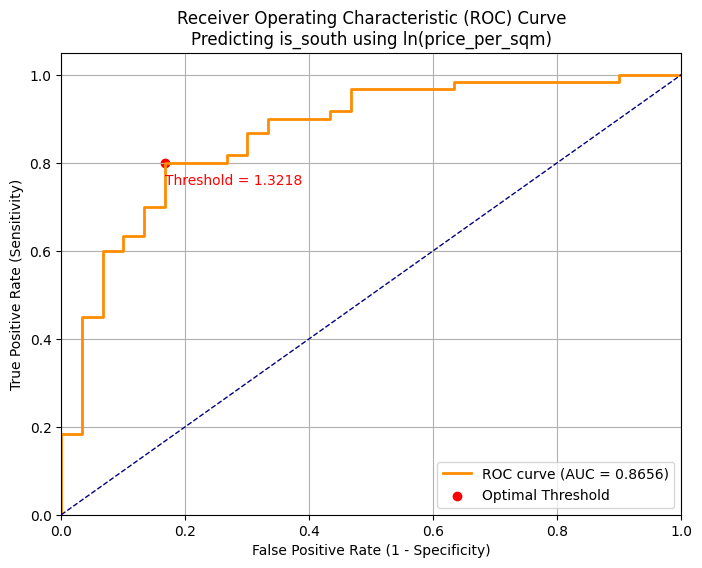

ROC Analysis Results:
AUC: 0.8656
Optimal Threshold: 1.3218
True Positive Rate at Optimal Threshold (Sensitivity): 0.8000
False Positive Rate at Optimal Threshold: 0.1667
Specificity at Optimal Threshold: 0.8333
Accuracy at Optimal Threshold: 0.8111
Precision at Optimal Threshold: 0.9057
Recall (Sensitivity) at Optimal Threshold: 0.8000
F1 Score at Optimal Threshold: 0.8496

Confusion Matrix at Optimal Threshold:
TN: 25, FP: 5, FN: 12, TP: 48

Logarithmic transformation applied using base 2.718281828459045.


In [63]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous predictor variable
x_column = 'is_south'   # Binary outcome variable

# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df, y_column, x_column, log_transform=True)

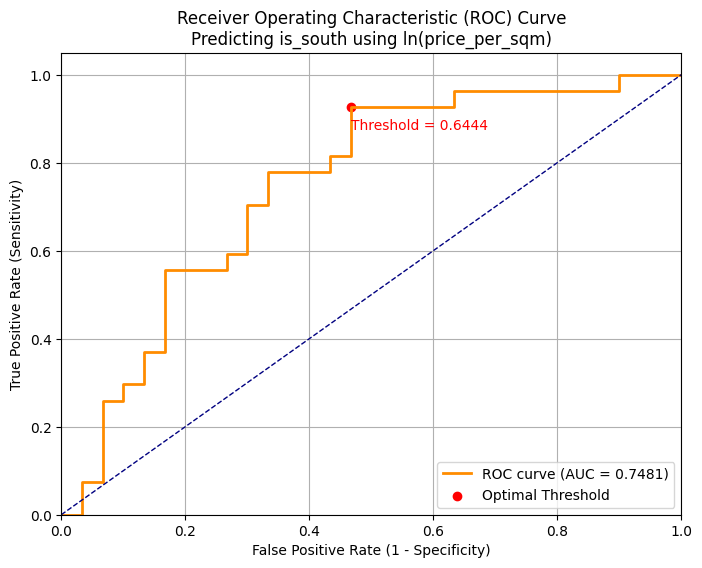

ROC Analysis Results:
AUC: 0.7481
Optimal Threshold: 0.6444
True Positive Rate at Optimal Threshold (Sensitivity): 0.9259
False Positive Rate at Optimal Threshold: 0.4667
Specificity at Optimal Threshold: 0.5333
Accuracy at Optimal Threshold: 0.7193
Precision at Optimal Threshold: 0.6410
Recall (Sensitivity) at Optimal Threshold: 0.9259
F1 Score at Optimal Threshold: 0.7576

Confusion Matrix at Optimal Threshold:
TN: 16, FP: 14, FN: 2, TP: 25

Logarithmic transformation applied using base 2.718281828459045.


In [64]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous predictor variable
x_column = 'is_south'       # Binary outcome variable

# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_not_omsk, y_column, x_column, log_transform=True)

In [65]:
# Specify the columns
y_column = 'price_per_sqm'  # Continuous predictor variable
x_column = 'is_south'       # Binary outcome variable

# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df, y_column, x_column, log_transform=True)


Logistic Regression Results:
Coefficients:
const           -1.277655
price_per_sqm    1.354927
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.278690  0.111162  0.698692
price_per_sqm  3.876479  2.145132  7.005207

Model Fit Statistics:
Log-Likelihood: -37.9834
AIC: 79.9667
BIC: 84.9664
Pseudo R-squared: 0.3370

Classification Performance at Threshold 0.6256:
Accuracy: 0.8111
Precision: 0.9057
Recall (Sensitivity): 0.8000
Specificity: 0.8333
F1 Score: 0.8496

ROC AUC: 0.8656

Optimal threshold (Youden's Index): 0.6256

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           25            5
Actual 1           12           48


In [66]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_not_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -1.045952
price_per_sqm    0.915030
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.351357  0.145138  0.850584
price_per_sqm  2.496851  1.314306  4.743389

Model Fit Statistics:
Log-Likelihood: -34.2919
AIC: 72.5837
BIC: 76.6698
Pseudo R-squared: 0.1303

Classification Performance at Threshold 0.3879:
Accuracy: 0.7193
Precision: 0.6410
Recall (Sensitivity): 0.9259
Specificity: 0.5333
F1 Score: 0.7576

ROC AUC: 0.7481

Optimal threshold (Youden's Index): 0.3879

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           16           14
Actual 1            2           25


In [67]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_south'         # Independent variable

# Transformed values for both Y and X
results = perform_linear_regression(df,
                                    y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.351
Model:                            OLS   Adj. R-squared:                  0.344
Method:                 Least Squares   F-statistic:                     47.64
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           7.57e-10
Time:                        19:08:09   Log-Likelihood:                -142.47
No. Observations:                  90   AIC:                             288.9
Df Residuals:                      88   BIC:                             293.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5789      0.218      2.661      0.0

In [68]:
# Transformed values for both Y and X
results = perform_linear_regression(df_not_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.163
Model:                            OLS   Adj. R-squared:                  0.148
Method:                 Least Squares   F-statistic:                     10.70
Date:                Sat, 09 Nov 2024   Prob (F-statistic):            0.00186
Time:                        19:08:35   Log-Likelihood:                -80.518
No. Observations:                  57   AIC:                             165.0
Df Residuals:                      55   BIC:                             169.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5789      0.185      3.135      0.0

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


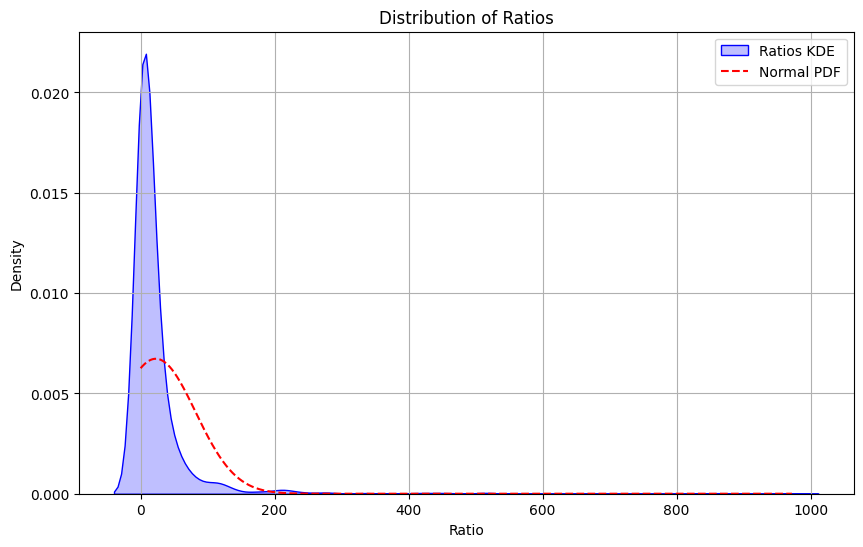

Mean of Ratios: 22.6323
Median of Ratios: 6.4974
95% Confidence Interval of Mean: (19.8907, 25.3740)
Shapiro-Wilk Test Statistic: 0.3428
Shapiro-Wilk Test p-value: 0.0000e+00
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [69]:
# Specify the columns
y_column = 'price_per_sqm'    # Dependent variable
x_column = 'is_south'     # Independent variable

# Transformed values for both Y and X
results = compare_groups_with_ratios(df, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


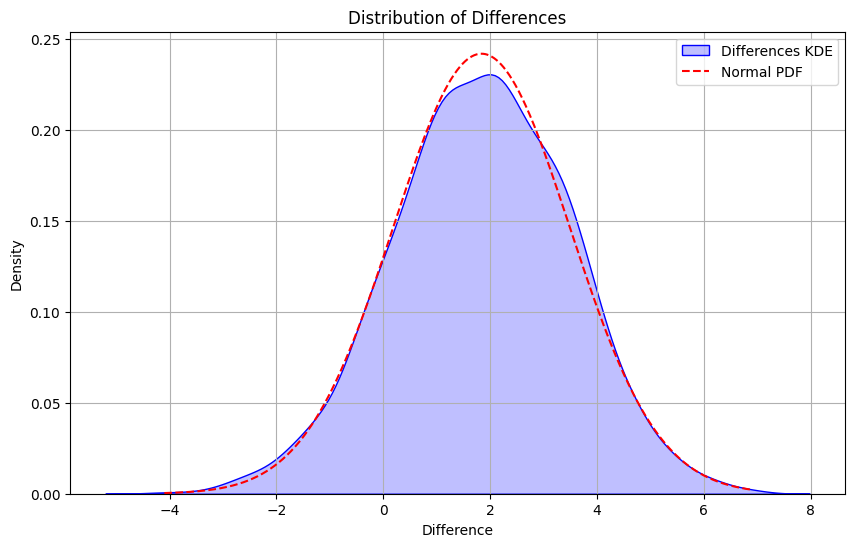

Mean of Differences: 1.8391
Median of Differences: 1.8714
95% Confidence Interval of Mean: (1.7628, 1.9154)
Shapiro-Wilk Test Statistic: 0.9990
Shapiro-Wilk Test p-value: 4.3012e-01
The distribution of differences is not significantly different from normal (fail to reject null hypothesis at alpha=0.05).


In [70]:
# Transformed values for both Y and X
results = compare_groups_with_differences(df, y_column, x_column, log_transform=True)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


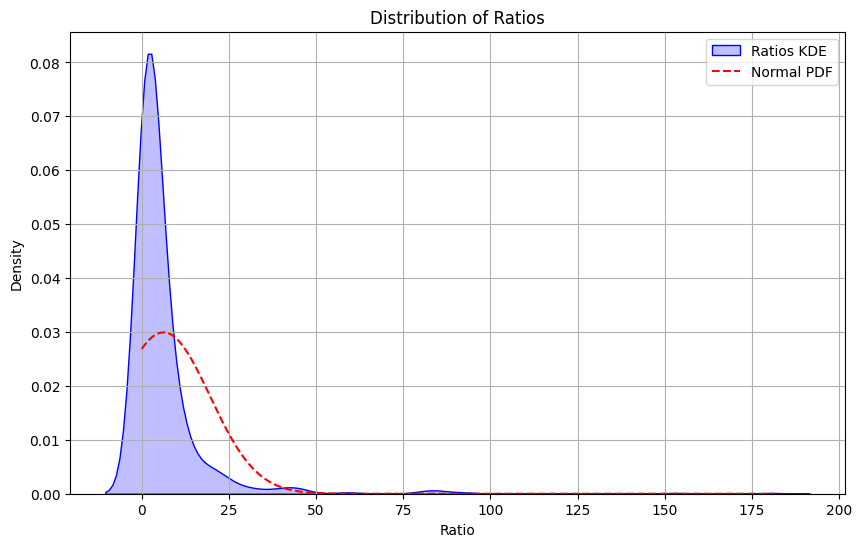

Mean of Ratios: 6.2088
Median of Ratios: 2.5609
95% Confidence Interval of Mean: (5.2892, 7.1283)
Shapiro-Wilk Test Statistic: 0.4046
Shapiro-Wilk Test p-value: 2.8026e-45
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [71]:
# Transformed values for both Y and X
results = compare_groups_with_ratios(df_not_omsk, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


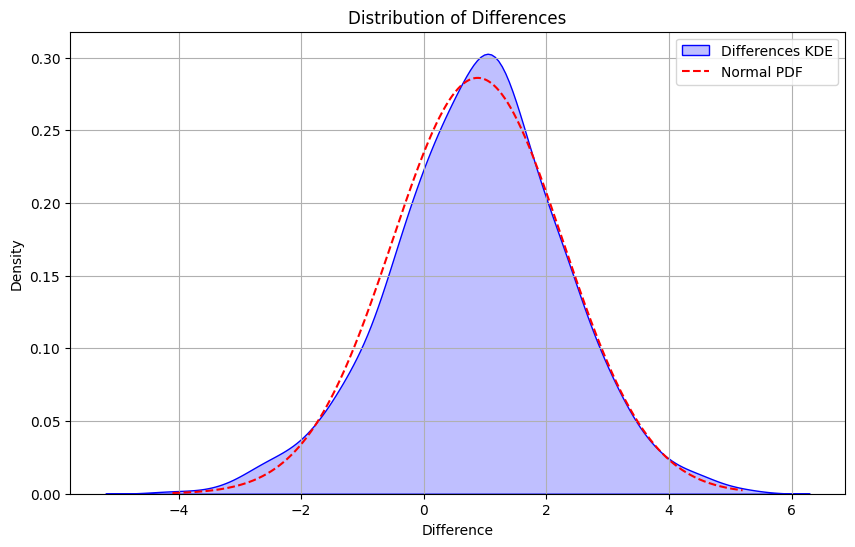

Mean of Differences: 0.8776
Median of Differences: 0.9404
95% Confidence Interval of Mean: (0.7814, 0.9738)
Shapiro-Wilk Test Statistic: 0.9970
Shapiro-Wilk Test p-value: 1.3825e-01
The distribution of differences is not significantly different from normal (fail to reject null hypothesis at alpha=0.05).


In [73]:
# Transformed values for both Y and X
results = compare_groups_with_differences(df_not_omsk, y_column, x_column, log_transform=True)

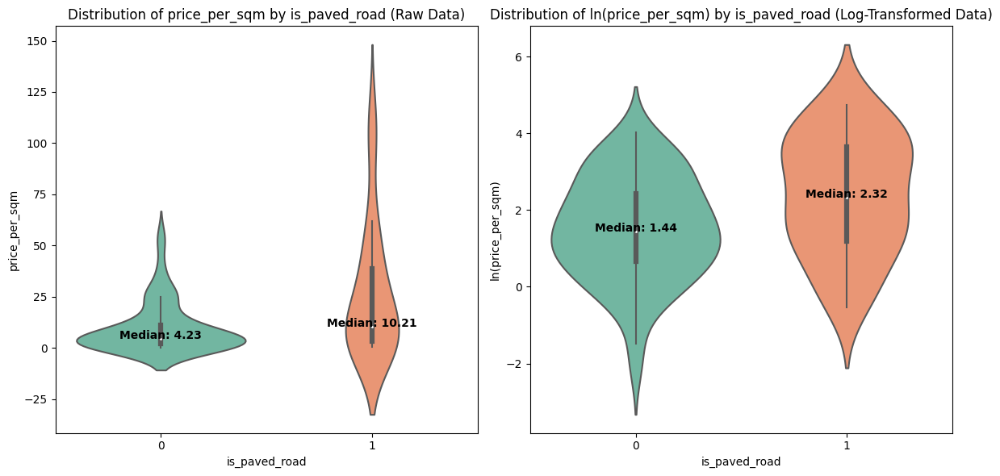

In [74]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_paved_road'    # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df, y_column, x_column)

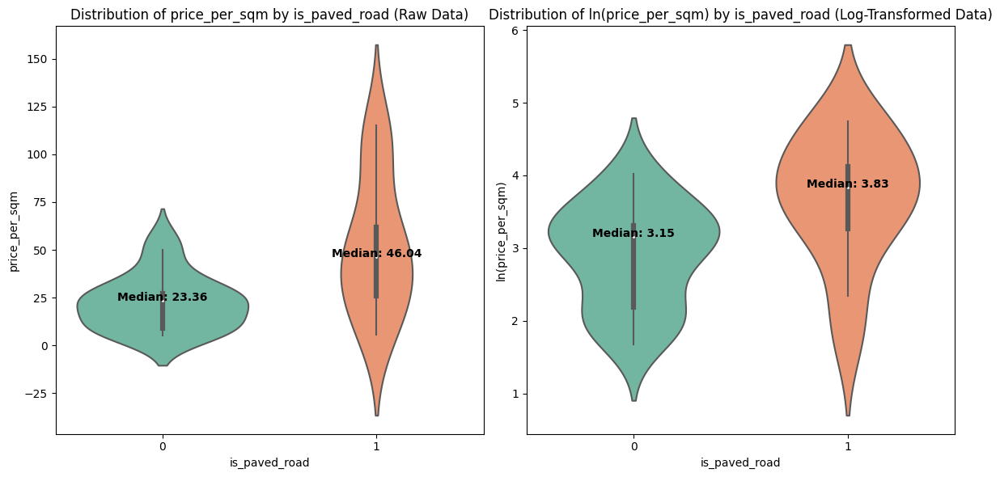

In [75]:
# Call the function
plot_violin_comparison(df_omsk, y_column, x_column)

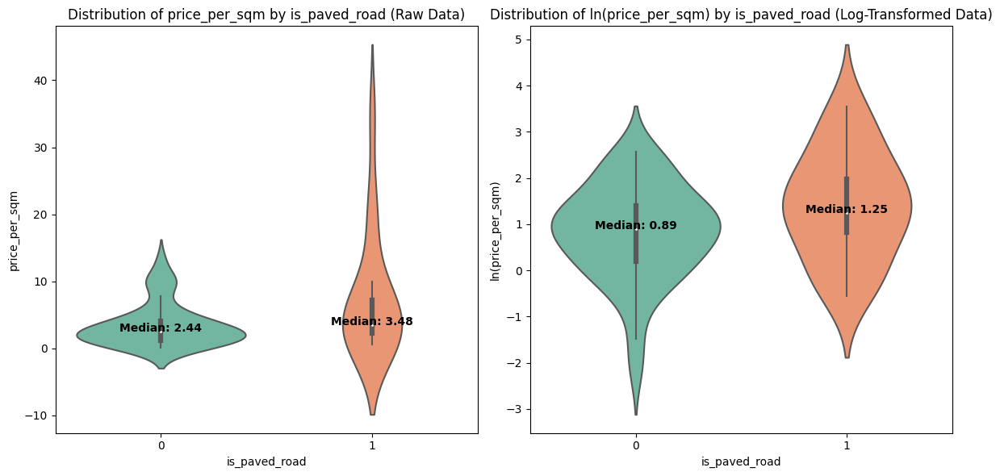

In [76]:
# Call the function
plot_violin_comparison(df_not_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

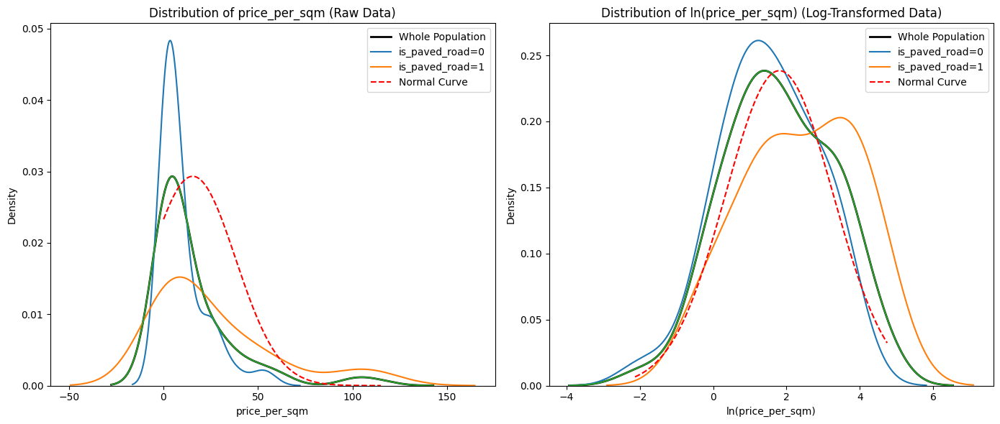

In [77]:
# Call the function
plot_kde_comparison(df, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

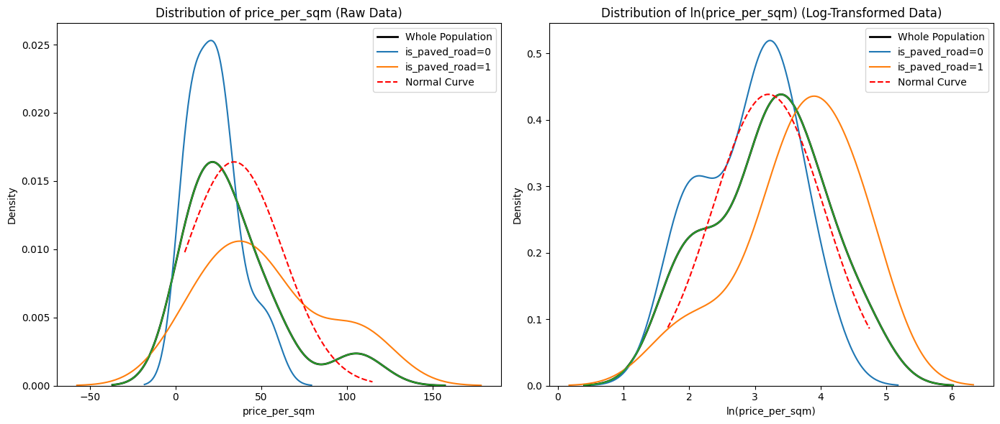

In [78]:
# Call the function
plot_kde_comparison(df_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

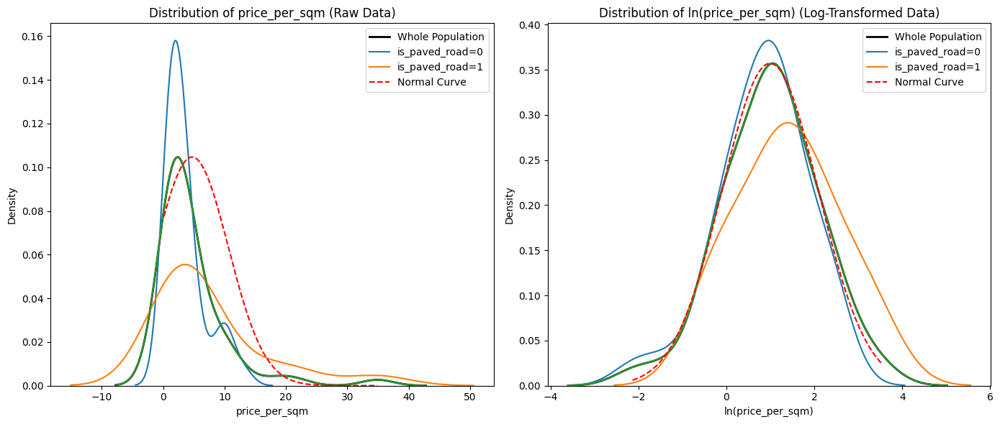

In [79]:
# Call the function
plot_kde_comparison(df_not_omsk, y_column, x_column)

In [80]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_paved_road'    # Binary variable with values 0 and 1

# Call the function
results = perform_mann_whitney_tests(df, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 4.2308
Group 1 Median: 10.2086
U Statistic: 609.5000
P-value: 0.0131
Effect Size (Rank-Biserial Correlation): 0.3228
Sample Sizes: n0 = 60, n1 = 30

Log-Transformed Data:
Group 0 Median: 1.4382
Group 1 Median: 2.3230
U Statistic: 609.5000
P-value: 0.0131
Effect Size (Rank-Biserial Correlation): 0.3228
Sample Sizes: n0 = 60, n1 = 30
Log Base Used: 2.718281828459045


In [81]:
# Call the function
results = perform_mann_whitney_tests(df_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 23.3629
Group 1 Median: 46.0377
U Statistic: 58.0000
P-value: 0.0084
Effect Size (Rank-Biserial Correlation): 0.5538
Sample Sizes: n0 = 20, n1 = 13

Log-Transformed Data:
Group 0 Median: 3.1509
Group 1 Median: 3.8295
U Statistic: 58.0000
P-value: 0.0084
Effect Size (Rank-Biserial Correlation): 0.5538
Sample Sizes: n0 = 20, n1 = 13
Log Base Used: 2.718281828459045


In [82]:
# Call the function
results = perform_mann_whitney_tests(df_not_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 2.4405
Group 1 Median: 3.4783
U Statistic: 251.5000
P-value: 0.1248
Effect Size (Rank-Biserial Correlation): 0.2603
Sample Sizes: n0 = 40, n1 = 17

Log-Transformed Data:
Group 0 Median: 0.8919
Group 1 Median: 1.2465
U Statistic: 251.5000
P-value: 0.1248
Effect Size (Rank-Biserial Correlation): 0.2603
Sample Sizes: n0 = 40, n1 = 17
Log Base Used: 2.718281828459045


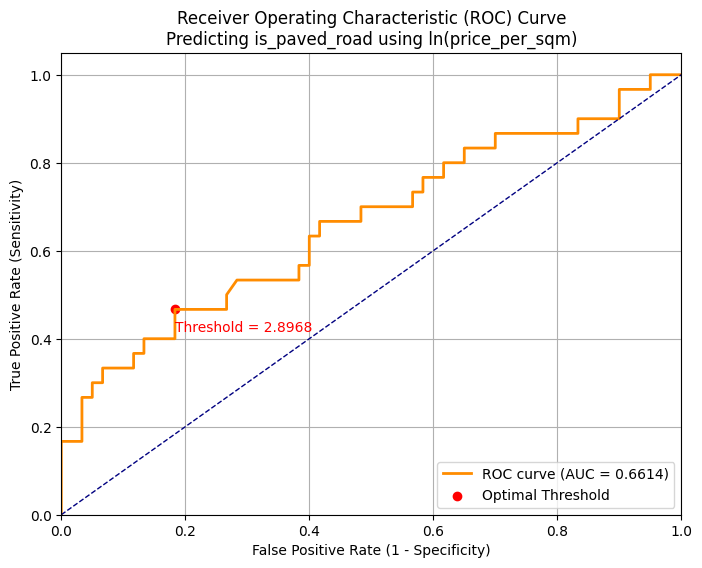

ROC Analysis Results:
AUC: 0.6614
Optimal Threshold: 2.8968
True Positive Rate at Optimal Threshold (Sensitivity): 0.4667
False Positive Rate at Optimal Threshold: 0.1833
Specificity at Optimal Threshold: 0.8167
Accuracy at Optimal Threshold: 0.7000
Precision at Optimal Threshold: 0.5600
Recall (Sensitivity) at Optimal Threshold: 0.4667
F1 Score at Optimal Threshold: 0.5091

Confusion Matrix at Optimal Threshold:
TN: 49, FP: 11, FN: 16, TP: 14

Logarithmic transformation applied using base 2.718281828459045.


In [83]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous predictor variable
x_column = 'is_paved_road'    # Binary outcome variable

# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df, y_column, x_column, log_transform=True)

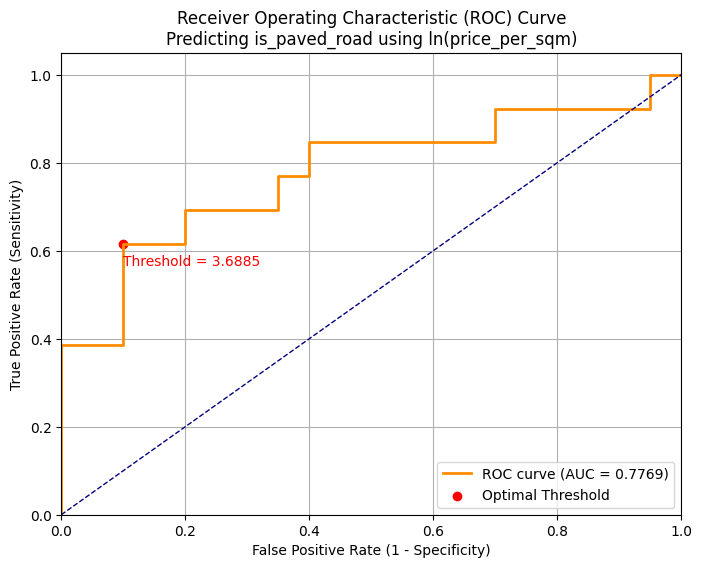

ROC Analysis Results:
AUC: 0.7769
Optimal Threshold: 3.6885
True Positive Rate at Optimal Threshold (Sensitivity): 0.6154
False Positive Rate at Optimal Threshold: 0.1000
Specificity at Optimal Threshold: 0.9000
Accuracy at Optimal Threshold: 0.7879
Precision at Optimal Threshold: 0.8000
Recall (Sensitivity) at Optimal Threshold: 0.6154
F1 Score at Optimal Threshold: 0.6957

Confusion Matrix at Optimal Threshold:
TN: 18, FP: 2, FN: 5, TP: 8

Logarithmic transformation applied using base 2.718281828459045.


In [84]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_omsk, y_column, x_column, log_transform=True)

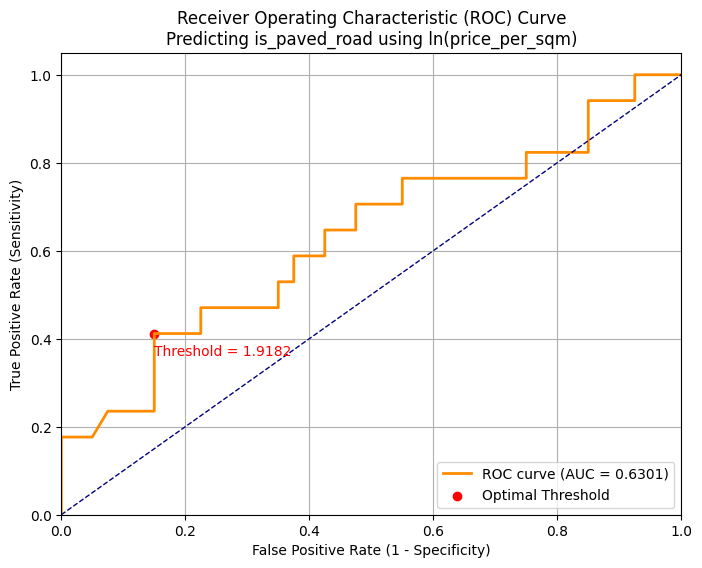

ROC Analysis Results:
AUC: 0.6301
Optimal Threshold: 1.9182
True Positive Rate at Optimal Threshold (Sensitivity): 0.4118
False Positive Rate at Optimal Threshold: 0.1500
Specificity at Optimal Threshold: 0.8500
Accuracy at Optimal Threshold: 0.7193
Precision at Optimal Threshold: 0.5385
Recall (Sensitivity) at Optimal Threshold: 0.4118
F1 Score at Optimal Threshold: 0.4667

Confusion Matrix at Optimal Threshold:
TN: 34, FP: 6, FN: 10, TP: 7

Logarithmic transformation applied using base 2.718281828459045.


In [85]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_not_omsk, y_column, x_column, log_transform=True)

In [86]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -1.549939
price_per_sqm    0.438224
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.212261  0.092027  0.489583
price_per_sqm  1.549952  1.109251  2.165744

Model Fit Statistics:
Log-Likelihood: -53.6266
AIC: 111.2532
BIC: 116.2528
Pseudo R-squared: 0.0639

Classification Performance at Threshold 0.4303:
Accuracy: 0.7000
Precision: 0.5600
Recall (Sensitivity): 0.4667
Specificity: 0.8167
F1 Score: 0.5091

ROC AUC: 0.6614

Optimal threshold (Youden's Index): 0.4303

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           49           11
Actual 1           16           14


In [87]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -4.878670
price_per_sqm    1.346619
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%      97.5%
const          0.007607  0.000148   0.391549
price_per_sqm  3.844404  1.229581  12.019896

Model Fit Statistics:
Log-Likelihood: -18.4724
AIC: 40.9448
BIC: 43.9378
Pseudo R-squared: 0.1651

Classification Performance at Threshold 0.5221:
Accuracy: 0.7879
Precision: 0.8000
Recall (Sensitivity): 0.6154
Specificity: 0.9000
F1 Score: 0.6957

ROC AUC: 0.7769

Optimal threshold (Youden's Index): 0.5221

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           18            2
Actual 1            5            8


In [88]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_not_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -1.451022
price_per_sqm    0.533631
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.234331  0.092681  0.592469
price_per_sqm  1.705113  0.947095  3.069818

Model Fit Statistics:
Log-Likelihood: -32.9742
AIC: 69.9483
BIC: 74.0344
Pseudo R-squared: 0.0507

Classification Performance at Threshold 0.3947:
Accuracy: 0.7193
Precision: 0.5385
Recall (Sensitivity): 0.4118
Specificity: 0.8500
F1 Score: 0.4667

ROC AUC: 0.6301

Optimal threshold (Youden's Index): 0.3947

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           34            6
Actual 1           10            7


In [89]:
# Transformed values for both Y and X
results = perform_linear_regression(df, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.078
Model:                            OLS   Adj. R-squared:                  0.068
Method:                 Least Squares   F-statistic:                     7.456
Date:                Sat, 09 Nov 2024   Prob (F-statistic):            0.00764
Time:                        19:53:07   Log-Likelihood:                -158.28
No. Observations:                  90   AIC:                             320.6
Df Residuals:                      88   BIC:                             325.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             1.5159      0.183      8.267

In [90]:
# Transformed values for both Y and X
results = perform_linear_regression(df_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.200
Model:                            OLS   Adj. R-squared:                  0.174
Method:                 Least Squares   F-statistic:                     7.748
Date:                Sat, 09 Nov 2024   Prob (F-statistic):            0.00908
Time:                        19:53:17   Log-Likelihood:                -37.388
No. Observations:                  33   AIC:                             78.78
Df Residuals:                      31   BIC:                             81.77
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             2.9018      0.173     16.742

In [91]:
# Transformed values for both Y and X
results = perform_linear_regression(df_not_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                  0.042
Method:                 Least Squares   F-statistic:                     3.438
Date:                Sat, 09 Nov 2024   Prob (F-statistic):             0.0691
Time:                        19:53:22   Log-Likelihood:                -83.854
No. Observations:                  57   AIC:                             171.7
Df Residuals:                      55   BIC:                             175.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.8229      0.170      4.852

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


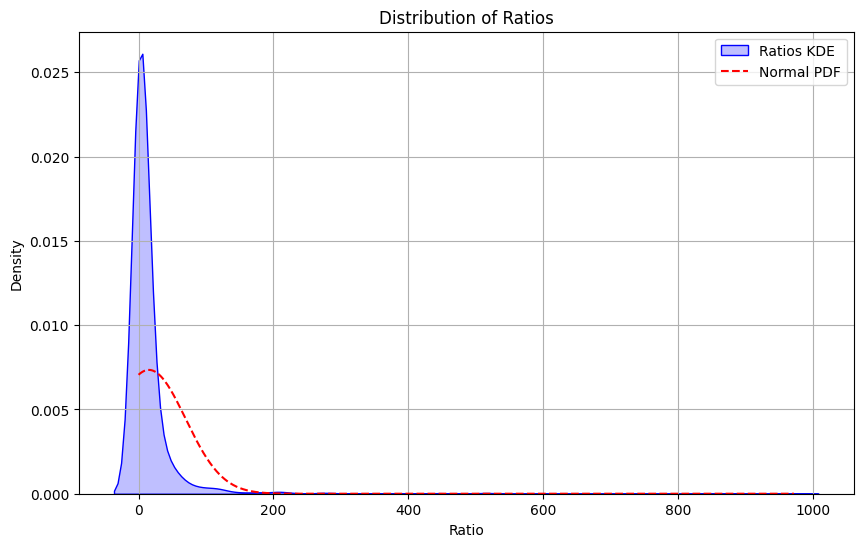

Mean of Ratios: 15.4000
Median of Ratios: 2.4248
95% Confidence Interval of Mean: (12.8896, 17.9104)
Shapiro-Wilk Test Statistic: 0.2546
Shapiro-Wilk Test p-value: 0.0000e+00
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [92]:
# Transformed values for Y and binary X
results = compare_groups_with_ratios(df, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


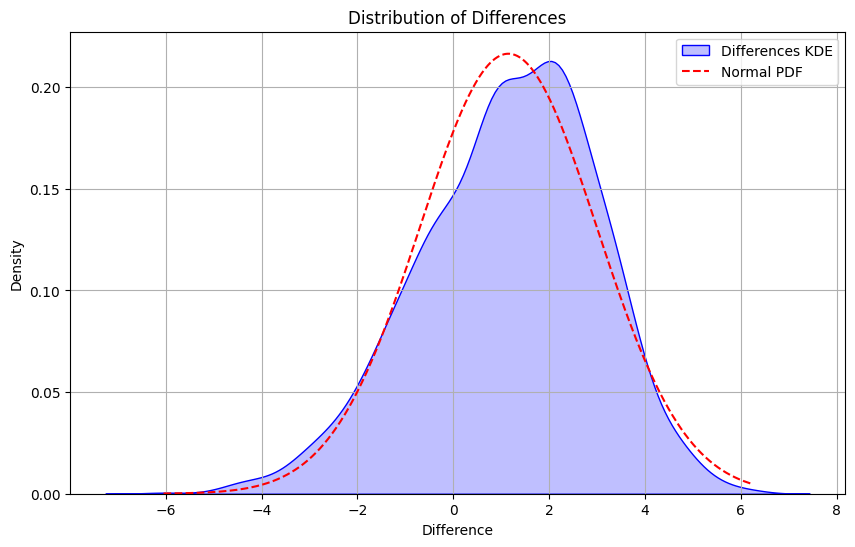

Mean of Differences: 1.1488
Median of Differences: 1.2671
95% Confidence Interval of Mean: (1.0668, 1.2307)
Shapiro-Wilk Test Statistic: 0.9908
Shapiro-Wilk Test p-value: 1.0121e-09
The distribution of differences is significantly different from normal (reject null hypothesis at alpha=0.05).


In [120]:
# Transformed values for Y and binary X
results = compare_groups_with_differences(df, y_column, x_column, log_transform=True)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


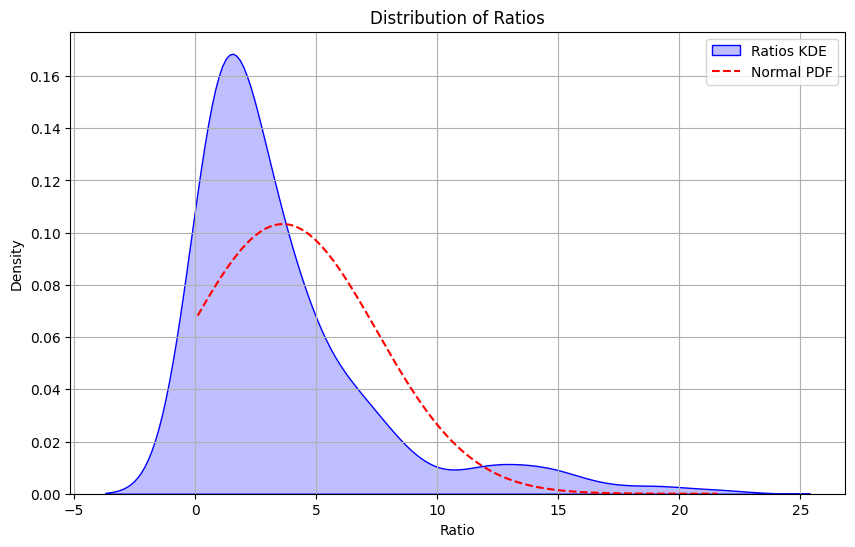

Mean of Ratios: 3.6233
Median of Ratios: 2.2142
95% Confidence Interval of Mean: (3.1515, 4.0950)
Shapiro-Wilk Test Statistic: 0.7663
Shapiro-Wilk Test p-value: 5.9979e-19
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [94]:
# Transformed values for Y and binary X
results = compare_groups_with_ratios(df_omsk, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


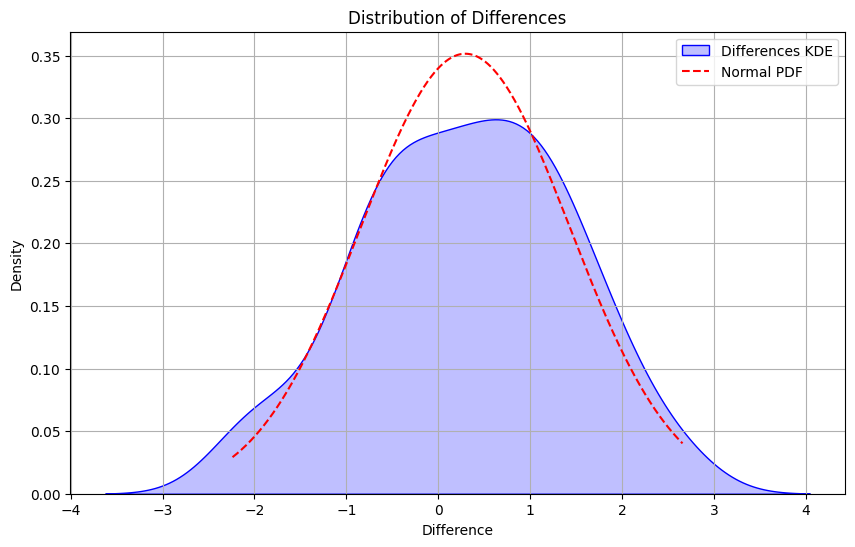

Mean of Differences: 0.2933
Median of Differences: 0.3801
95% Confidence Interval of Mean: (0.0556, 0.5310)
Shapiro-Wilk Test Statistic: 0.9863
Shapiro-Wilk Test p-value: 4.7043e-01
The distribution of differences is not significantly different from normal (fail to reject null hypothesis at alpha=0.05).


In [121]:
# Transformed values for Y and binary X
results = compare_groups_with_differences(df_omsk, y_column, x_column, log_transform=True)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


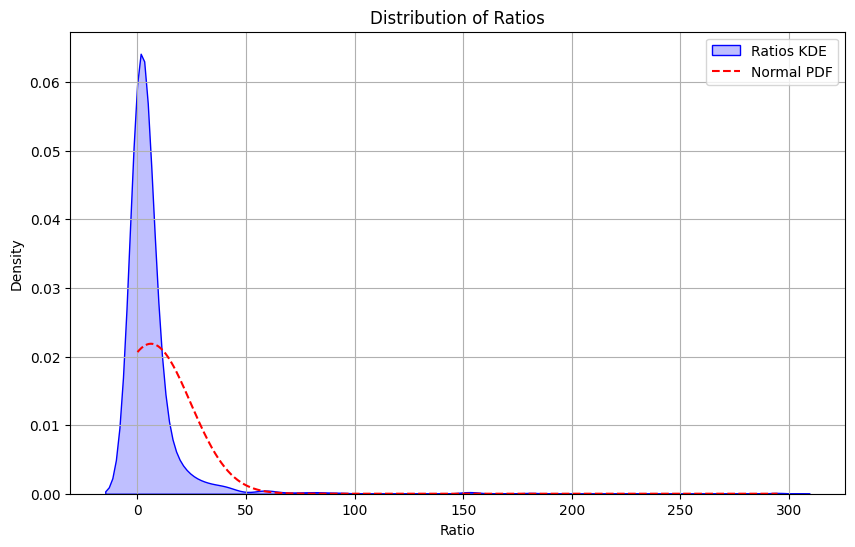

Mean of Ratios: 6.2159
Median of Ratios: 1.7776
95% Confidence Interval of Mean: (4.8417, 7.5900)
Shapiro-Wilk Test Statistic: 0.2948
Shapiro-Wilk Test p-value: 7.0065e-45
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [96]:
# Transformed values for Y and binary X
results = compare_groups_with_ratios(df_not_omsk, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


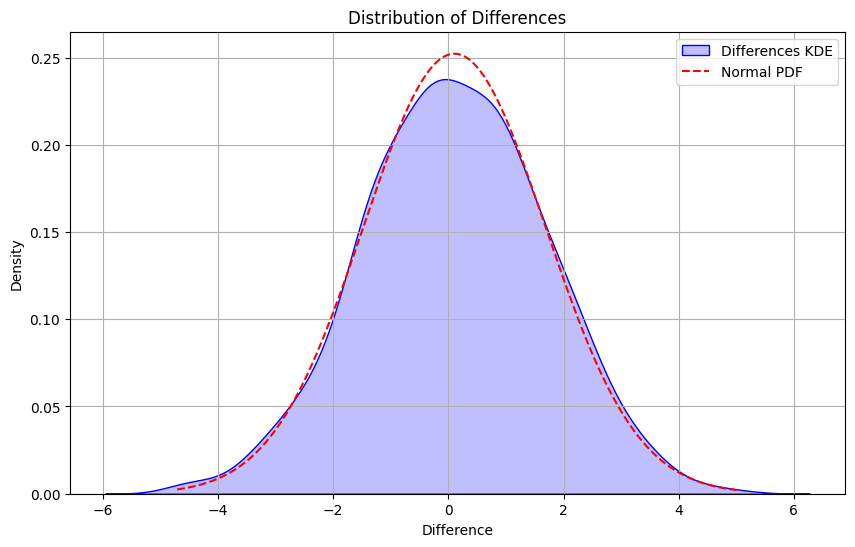

Mean of Differences: 0.1059
Median of Differences: 0.0698
95% Confidence Interval of Mean: (-0.0044, 0.2162)
Shapiro-Wilk Test Statistic: 0.9990
Shapiro-Wilk Test p-value: 9.5883e-01
The distribution of differences is not significantly different from normal (fail to reject null hypothesis at alpha=0.05).


In [122]:
# Transformed values for Y and binary X
results = compare_groups_with_differences(df_not_omsk, y_column, x_column, log_transform=True)

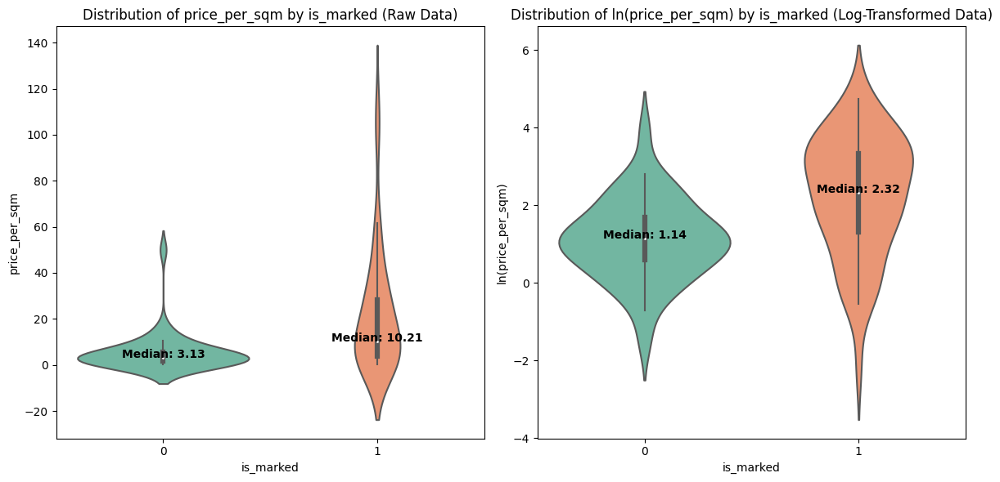

In [98]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_marked'        # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df, y_column, x_column)

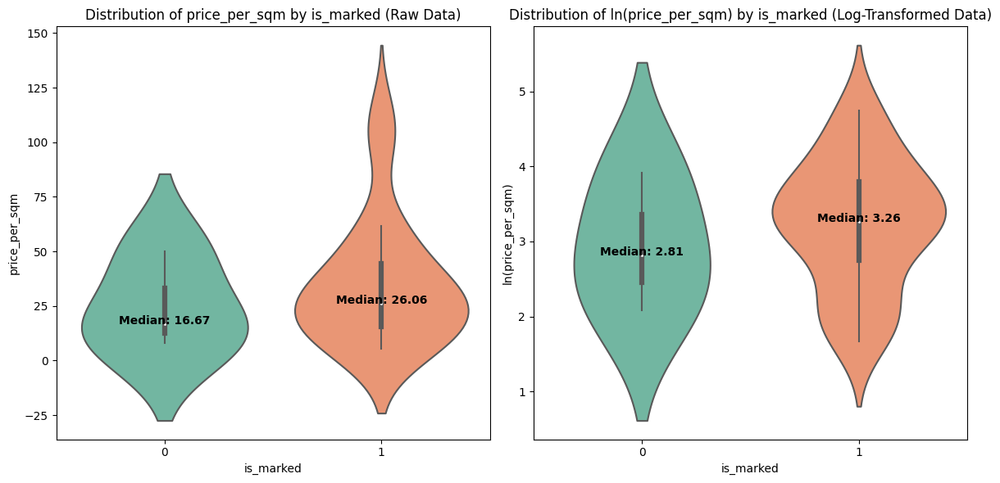

In [99]:
# Call the function
plot_violin_comparison(df_omsk, y_column, x_column)

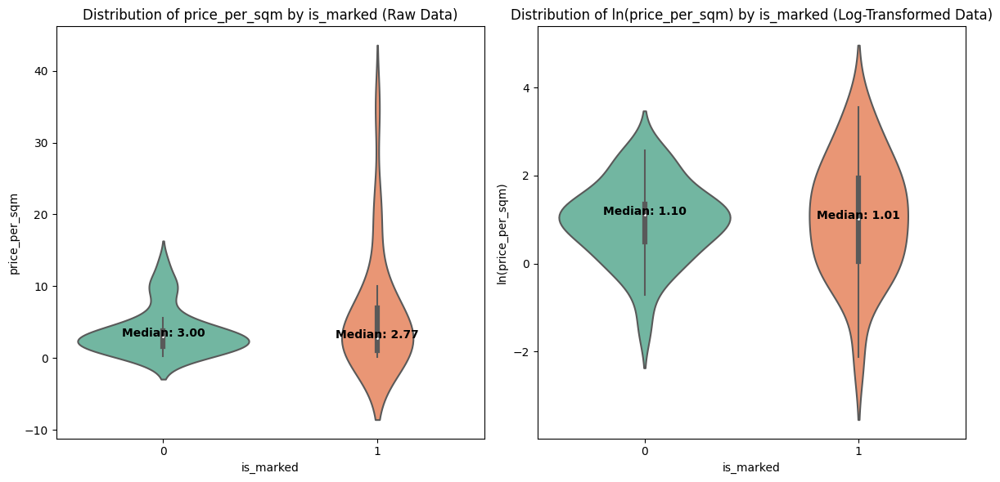

In [100]:
# Call the function
plot_violin_comparison(df_not_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

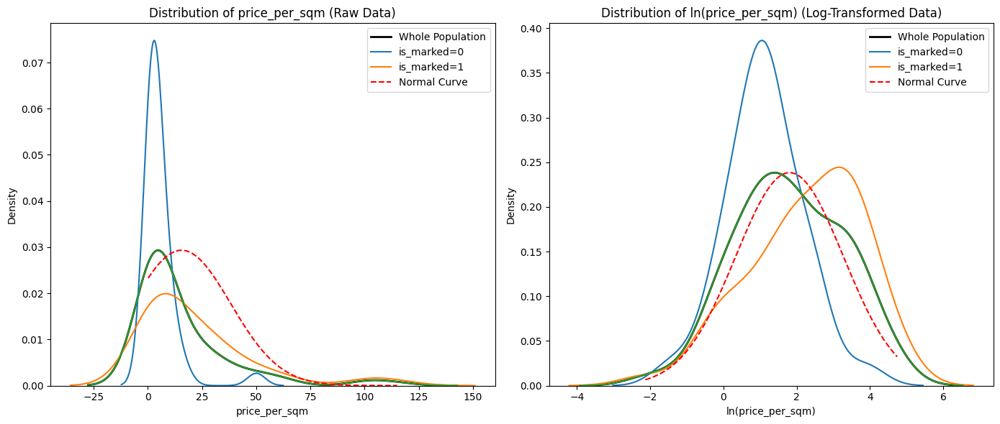

In [101]:
# Call the function
plot_kde_comparison(df, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

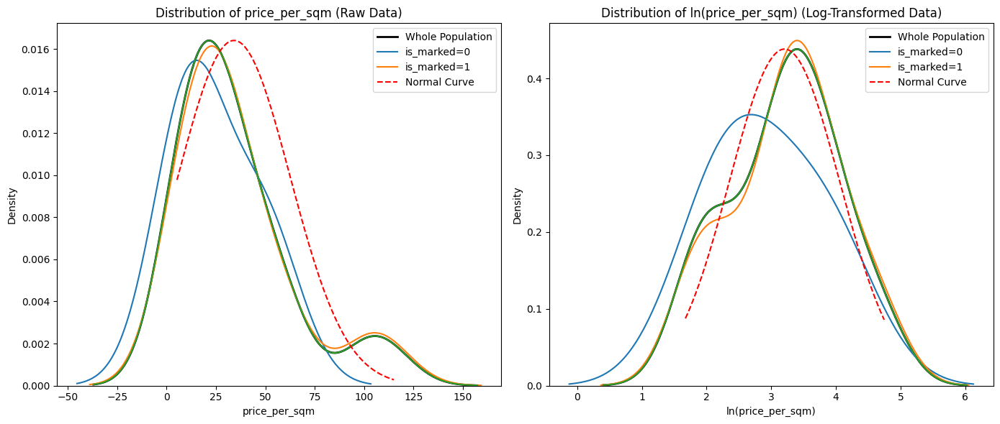

In [102]:
# Call the function
plot_kde_comparison(df_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

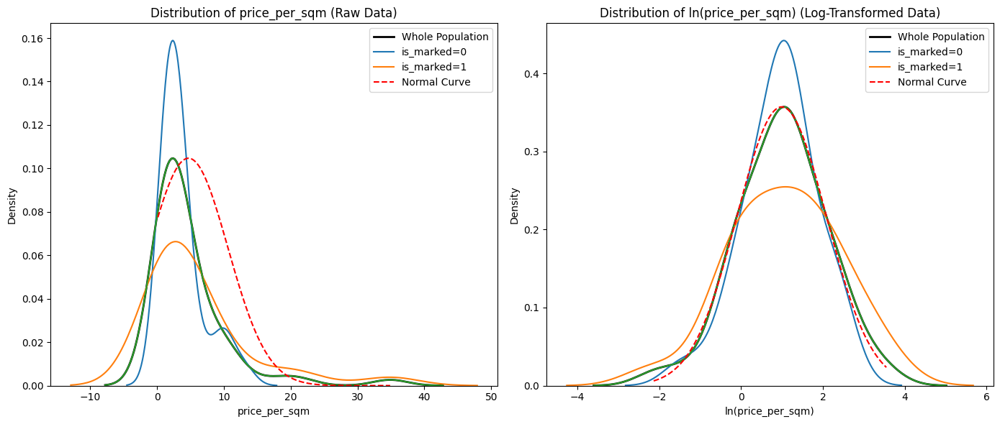

In [103]:
# Call the function
plot_kde_comparison(df_not_omsk, y_column, x_column)

In [104]:
# Call the function
results = perform_mann_whitney_tests(df, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 3.1294
Group 1 Median: 10.2086
U Statistic: 511.5000
P-value: 0.0002
Effect Size (Rank-Biserial Correlation): 0.4738
Sample Sizes: n0 = 36, n1 = 54

Log-Transformed Data:
Group 0 Median: 1.1407
Group 1 Median: 2.3230
U Statistic: 511.5000
P-value: 0.0002
Effect Size (Rank-Biserial Correlation): 0.4738
Sample Sizes: n0 = 36, n1 = 54
Log Base Used: 2.718281828459045


In [105]:
# Call the function
results = perform_mann_whitney_tests(df_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 16.6667
Group 1 Median: 26.0643
U Statistic: 38.0000
P-value: 0.7005
Effect Size (Rank-Biserial Correlation): 0.1556
Sample Sizes: n0 = 3, n1 = 30

Log-Transformed Data:
Group 0 Median: 2.8134
Group 1 Median: 3.2606
U Statistic: 38.0000
P-value: 0.7005
Effect Size (Rank-Biserial Correlation): 0.1556
Sample Sizes: n0 = 3, n1 = 30
Log Base Used: 2.718281828459045


In [106]:
# Call the function
results = perform_mann_whitney_tests(df_not_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 3.0000
Group 1 Median: 2.7685
U Statistic: 377.5000
P-value: 0.7711
Effect Size (Rank-Biserial Correlation): 0.0467
Sample Sizes: n0 = 33, n1 = 24

Log-Transformed Data:
Group 0 Median: 1.0986
Group 1 Median: 1.0136
U Statistic: 377.5000
P-value: 0.7711
Effect Size (Rank-Biserial Correlation): 0.0467
Sample Sizes: n0 = 33, n1 = 24
Log Base Used: 2.718281828459045


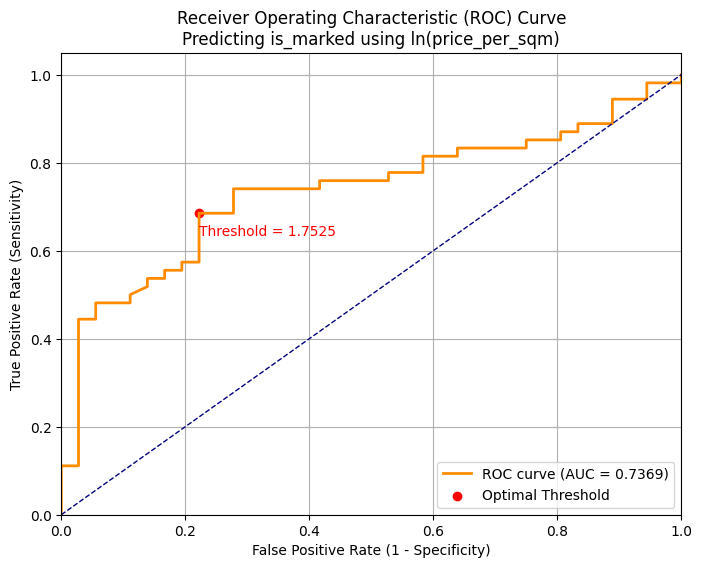

ROC Analysis Results:
AUC: 0.7369
Optimal Threshold: 1.7525
True Positive Rate at Optimal Threshold (Sensitivity): 0.6852
False Positive Rate at Optimal Threshold: 0.2222
Specificity at Optimal Threshold: 0.7778
Accuracy at Optimal Threshold: 0.7222
Precision at Optimal Threshold: 0.8222
Recall (Sensitivity) at Optimal Threshold: 0.6852
F1 Score at Optimal Threshold: 0.7475

Confusion Matrix at Optimal Threshold:
TN: 28, FP: 8, FN: 17, TP: 37

Logarithmic transformation applied using base 2.718281828459045.


In [107]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df, y_column, x_column, log_transform=True)

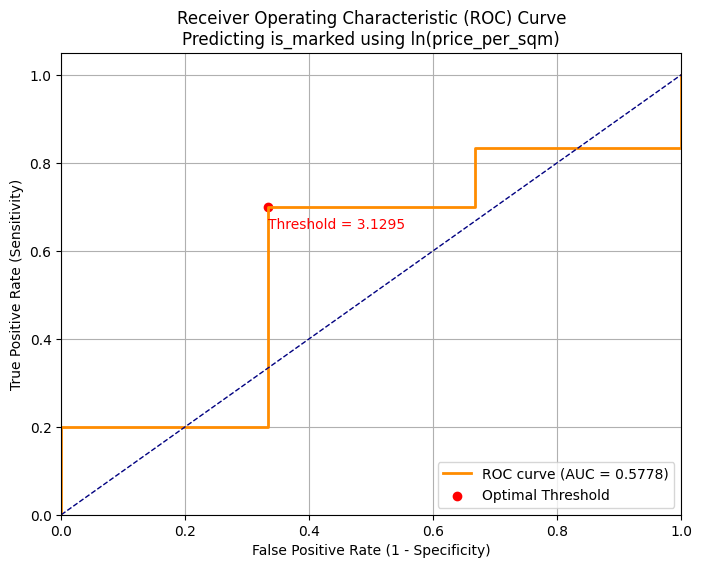

ROC Analysis Results:
AUC: 0.5778
Optimal Threshold: 3.1295
True Positive Rate at Optimal Threshold (Sensitivity): 0.7000
False Positive Rate at Optimal Threshold: 0.3333
Specificity at Optimal Threshold: 0.6667
Accuracy at Optimal Threshold: 0.6970
Precision at Optimal Threshold: 0.9545
Recall (Sensitivity) at Optimal Threshold: 0.7000
F1 Score at Optimal Threshold: 0.8077

Confusion Matrix at Optimal Threshold:
TN: 2, FP: 1, FN: 9, TP: 21

Logarithmic transformation applied using base 2.718281828459045.


In [108]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_omsk, y_column, x_column, log_transform=True)

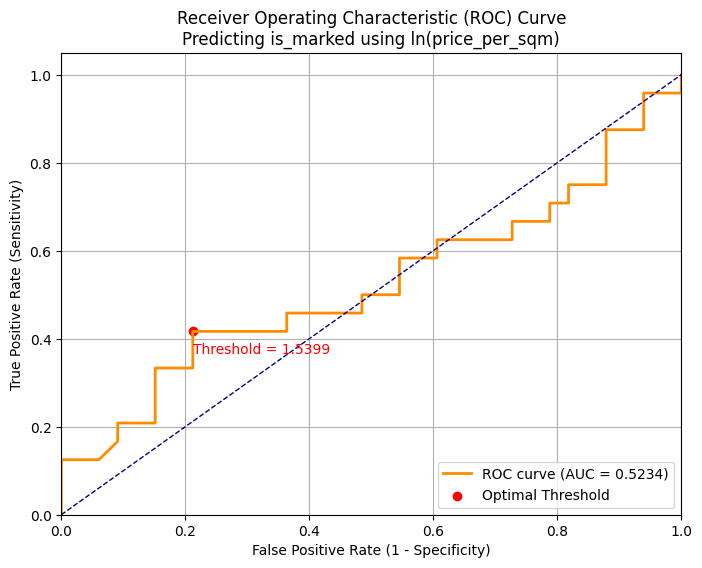

ROC Analysis Results:
AUC: 0.5234
Optimal Threshold: 1.5399
True Positive Rate at Optimal Threshold (Sensitivity): 0.4167
False Positive Rate at Optimal Threshold: 0.2121
Specificity at Optimal Threshold: 0.7879
Accuracy at Optimal Threshold: 0.6316
Precision at Optimal Threshold: 0.5882
Recall (Sensitivity) at Optimal Threshold: 0.4167
F1 Score at Optimal Threshold: 0.4878

Confusion Matrix at Optimal Threshold:
TN: 26, FP: 7, FN: 14, TP: 10

Logarithmic transformation applied using base 2.718281828459045.


In [109]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_not_omsk, y_column, x_column, log_transform=True)

In [110]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -0.634109
price_per_sqm    0.615282
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.530408  0.256643  1.096201
price_per_sqm  1.850178  1.298378  2.636486

Model Fit Statistics:
Log-Likelihood: -53.4640
AIC: 110.9280
BIC: 115.9276
Pseudo R-squared: 0.1173

Classification Performance at Threshold 0.6093:
Accuracy: 0.7222
Precision: 0.8222
Recall (Sensitivity): 0.6852
Specificity: 0.7778
F1 Score: 0.7475

ROC AUC: 0.7369

Optimal threshold (Youden's Index): 0.6093

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           28            8
Actual 1           17           37


In [111]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const            1.022325
price_per_sqm    0.415020
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%       97.5%
const          2.779649  0.034526  223.786863
price_per_sqm  1.514402  0.364672    6.288971

Model Fit Statistics:
Log-Likelihood: -9.8874
AIC: 23.7749
BIC: 26.7679
Pseudo R-squared: 0.0165

Classification Performance at Threshold 0.9106:
Accuracy: 0.6970
Precision: 0.9545
Recall (Sensitivity): 0.7000
Specificity: 0.6667
F1 Score: 0.8077

ROC AUC: 0.5778

Optimal threshold (Youden's Index): 0.9106

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0            2            1
Actual 1            9           21


In [112]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_not_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -0.408908
price_per_sqm    0.090168
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.664375  0.323067  1.366263
price_per_sqm  1.094358  0.672527  1.780774

Model Fit Statistics:
Log-Likelihood: -38.7297
AIC: 81.4594
BIC: 85.5455
Pseudo R-squared: 0.0017

Classification Performance at Threshold 0.4329:
Accuracy: 0.6316
Precision: 0.5882
Recall (Sensitivity): 0.4167
Specificity: 0.7879
F1 Score: 0.4878

ROC AUC: 0.5234

Optimal threshold (Youden's Index): 0.4329

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           26            7
Actual 1           14           10


In [113]:
# Transformed values for Y and binary X
results = perform_linear_regression(df, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.148
Model:                            OLS   Adj. R-squared:                  0.138
Method:                 Least Squares   F-statistic:                     15.29
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           0.000181
Time:                        20:28:40   Log-Likelihood:                -154.73
No. Observations:                  90   AIC:                             313.5
Df Residuals:                      88   BIC:                             318.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.1157      0.228      4.902      0.0

In [114]:
# Transformed values for Y and binary X
results = perform_linear_regression(df_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                 -0.022
Method:                 Least Squares   F-statistic:                    0.3156
Date:                Sat, 09 Nov 2024   Prob (F-statistic):              0.578
Time:                        20:29:26   Log-Likelihood:                -40.902
No. Observations:                  33   AIC:                             85.80
Df Residuals:                      31   BIC:                             88.80
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.9380      0.498      5.902      0.0

In [115]:
# Transformed values for Y and binary X
results = perform_linear_regression(df_not_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.016
Method:                 Least Squares   F-statistic:                    0.1277
Date:                Sat, 09 Nov 2024   Prob (F-statistic):              0.722
Time:                        20:29:48   Log-Likelihood:                -85.516
No. Observations:                  57   AIC:                             175.0
Df Residuals:                      55   BIC:                             179.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.9500      0.192      4.942      0.0

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


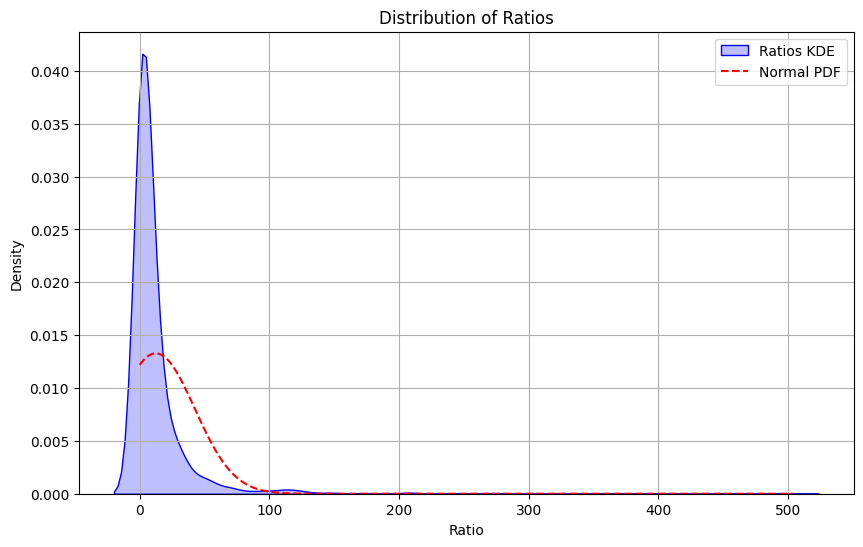

Mean of Ratios: 12.4277
Median of Ratios: 3.5505
95% Confidence Interval of Mean: (11.0908, 13.7645)
Shapiro-Wilk Test Statistic: 0.3804
Shapiro-Wilk Test p-value: 0.0000e+00
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [116]:
# Transformed values for Y and binary X
results = compare_groups_with_ratios(df, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


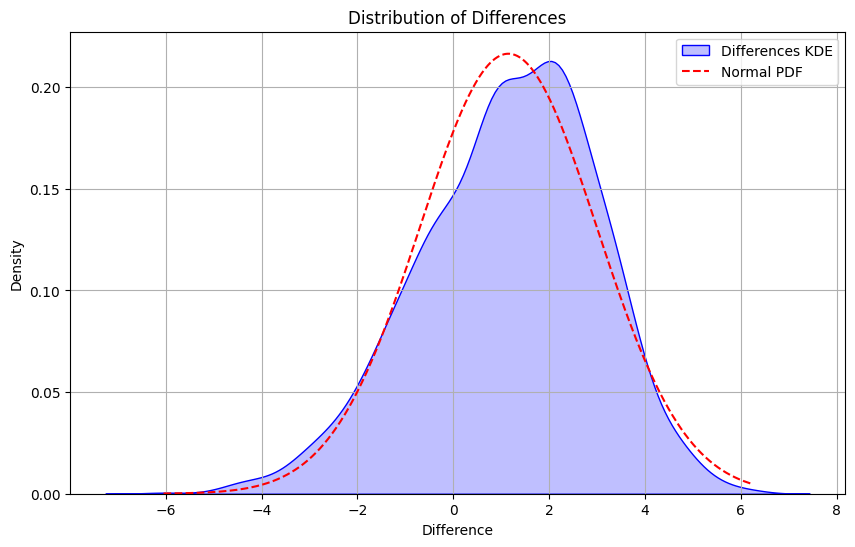

Mean of Differences: 1.1488
Median of Differences: 1.2671
95% Confidence Interval of Mean: (1.0668, 1.2307)
Shapiro-Wilk Test Statistic: 0.9908
Shapiro-Wilk Test p-value: 1.0121e-09
The distribution of differences is significantly different from normal (reject null hypothesis at alpha=0.05).


In [123]:
# Transformed values for Y and binary X
results = compare_groups_with_differences(df, y_column, x_column, log_transform=True)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


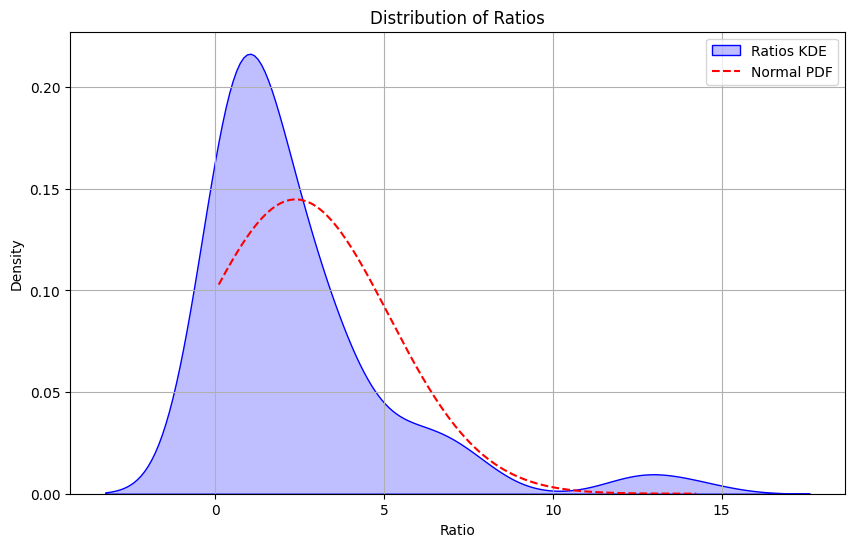

Mean of Ratios: 2.3849
Median of Ratios: 1.4628
95% Confidence Interval of Mean: (1.8077, 2.9621)
Shapiro-Wilk Test Statistic: 0.7324
Shapiro-Wilk Test p-value: 1.6386e-11
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [118]:
# Transformed values for Y and binary X
results = compare_groups_with_ratios(df_omsk, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


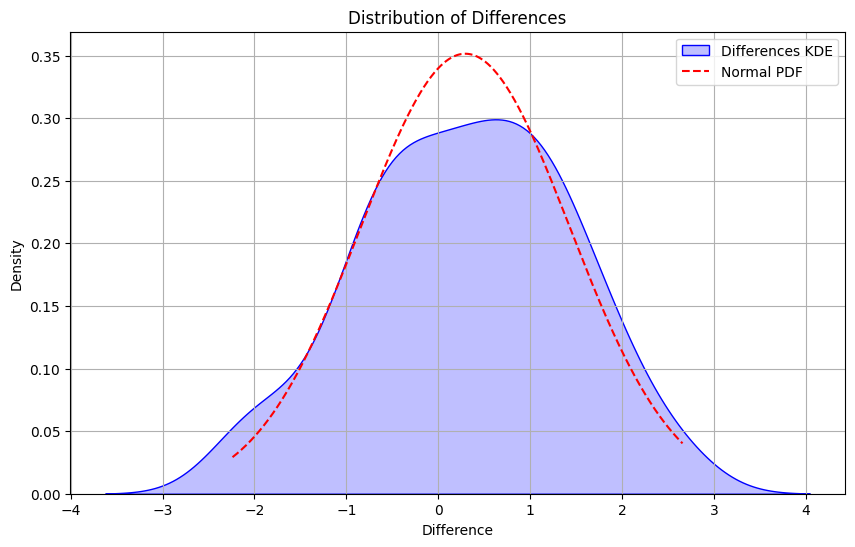

Mean of Differences: 0.2933
Median of Differences: 0.3801
95% Confidence Interval of Mean: (0.0556, 0.5310)
Shapiro-Wilk Test Statistic: 0.9863
Shapiro-Wilk Test p-value: 4.7043e-01
The distribution of differences is not significantly different from normal (fail to reject null hypothesis at alpha=0.05).


In [126]:
# Transformed values for Y and binary X
results = compare_groups_with_differences(df_omsk, y_column, x_column, log_transform=True)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


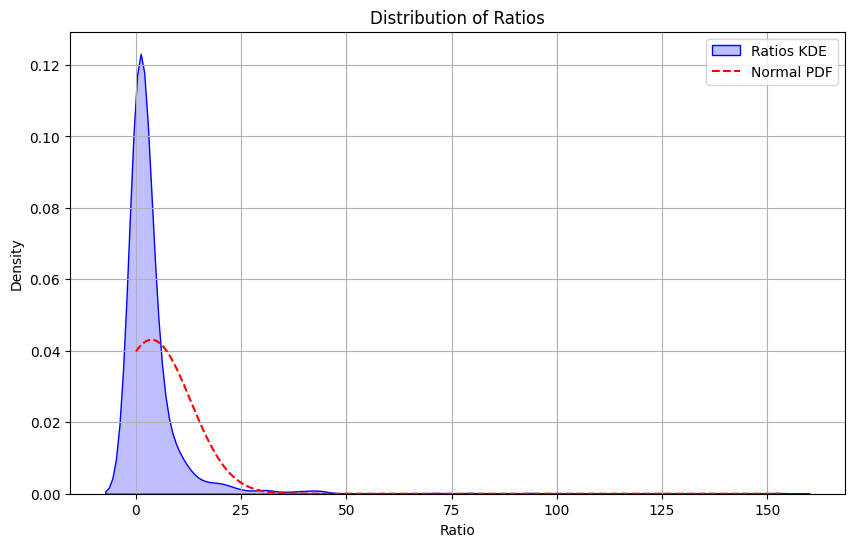

Mean of Ratios: 3.6899
Median of Ratios: 1.0723
95% Confidence Interval of Mean: (3.0443, 4.3355)
Shapiro-Wilk Test Statistic: 0.3562
Shapiro-Wilk Test p-value: 0.0000e+00
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [127]:
# Transformed values for Y and binary X
results = compare_groups_with_ratios(df_not_omsk, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


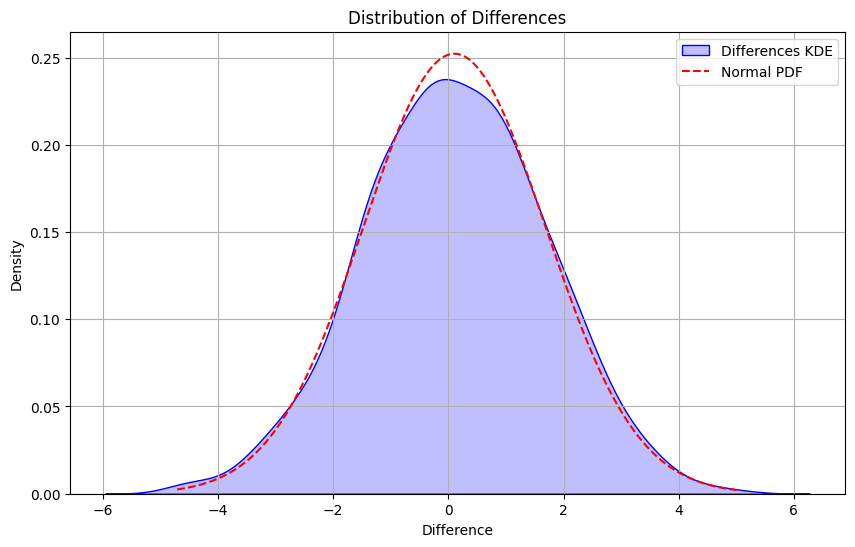

Mean of Differences: 0.1059
Median of Differences: 0.0698
95% Confidence Interval of Mean: (-0.0044, 0.2162)
Shapiro-Wilk Test Statistic: 0.9990
Shapiro-Wilk Test p-value: 9.5883e-01
The distribution of differences is not significantly different from normal (fail to reject null hypothesis at alpha=0.05).


In [128]:
# Transformed values for Y and binary X
results = compare_groups_with_differences(df_not_omsk, y_column, x_column, log_transform=True)

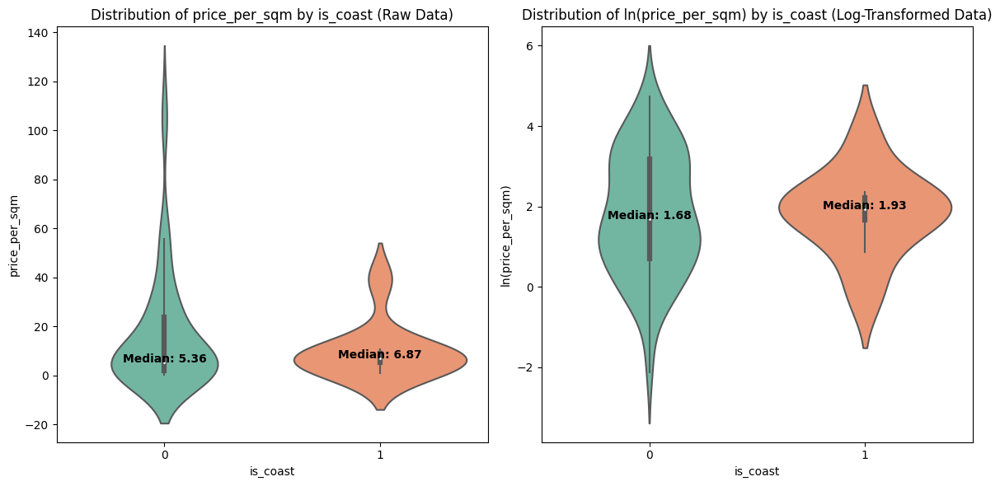

In [129]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_coast'         # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df, y_column, x_column)

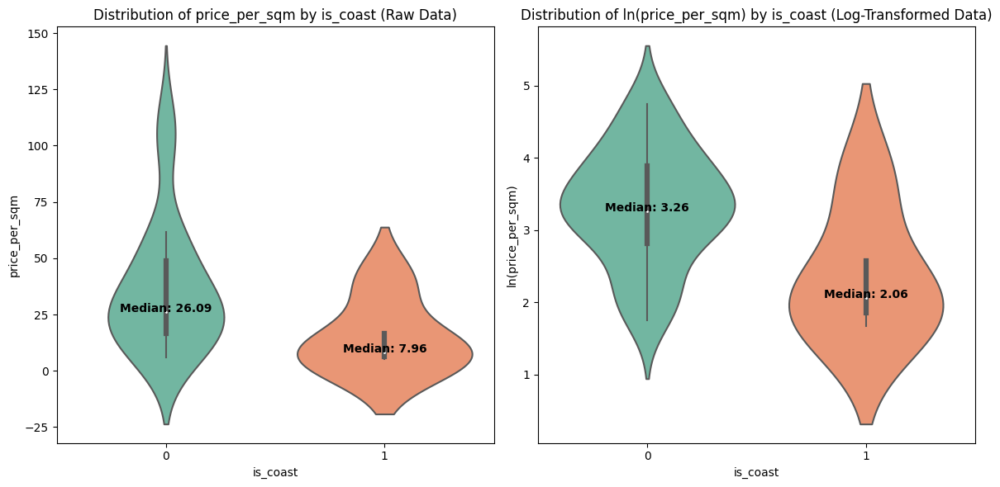

In [130]:
# Call the function
plot_violin_comparison(df_omsk, y_column, x_column)

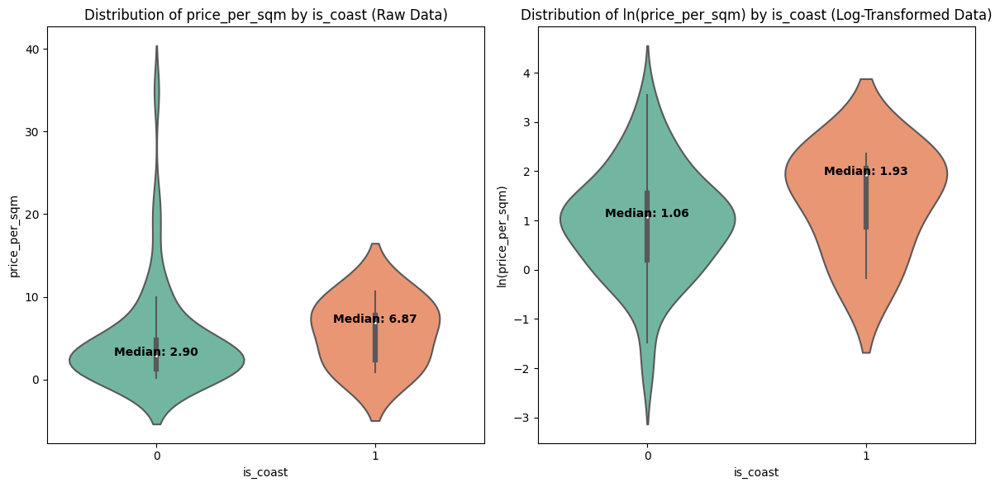

In [131]:
# Call the function
plot_violin_comparison(df_not_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

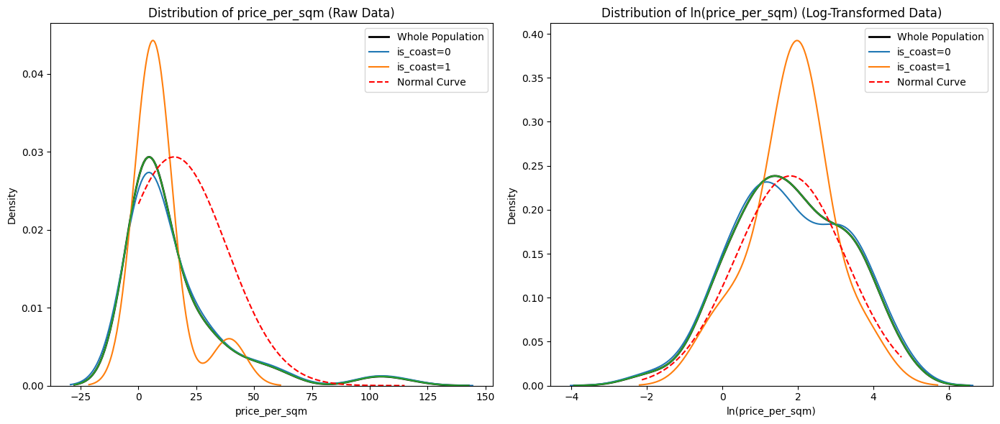

In [132]:
# Call the function
plot_kde_comparison(df, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

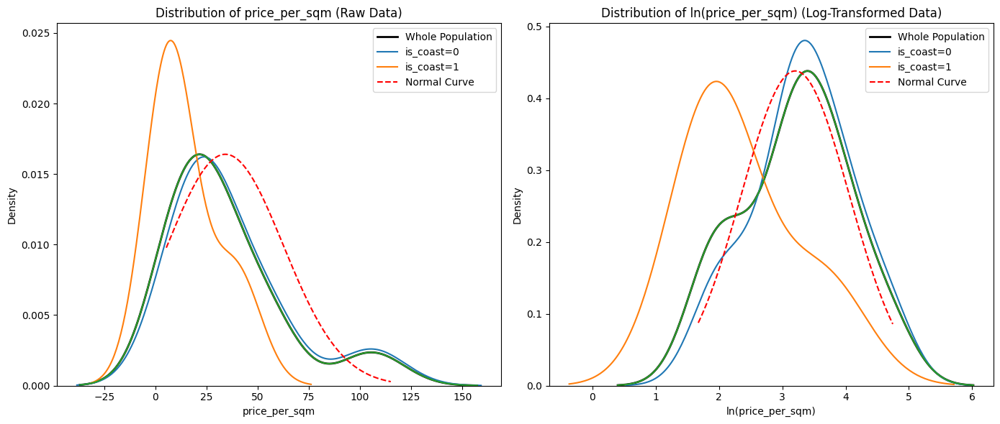

In [133]:
# Call the function
plot_kde_comparison(df_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

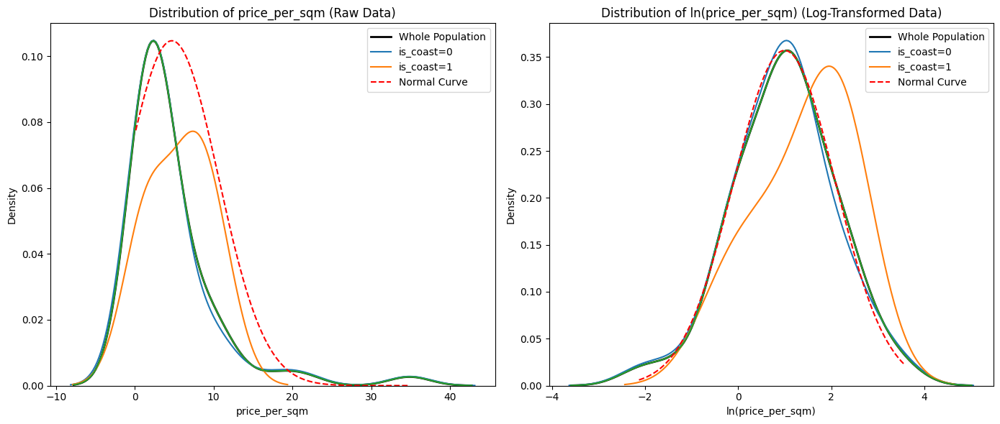

In [134]:
# Call the function
plot_kde_comparison(df_not_omsk, y_column, x_column)

In [135]:
# Call the function
results = perform_mann_whitney_tests(df, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 5.3636
Group 1 Median: 6.8718
U Statistic: 356.0000
P-value: 0.9143
Effect Size (Rank-Biserial Correlation): 0.0233
Sample Sizes: n0 = 81, n1 = 9

Log-Transformed Data:
Group 0 Median: 1.6796
Group 1 Median: 1.9274
U Statistic: 356.0000
P-value: 0.9143
Effect Size (Rank-Biserial Correlation): 0.0233
Sample Sizes: n0 = 81, n1 = 9
Log Base Used: 2.718281828459045


In [136]:
# Call the function
results = perform_mann_whitney_tests(df_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 26.0870
Group 1 Median: 7.9594
U Statistic: 92.0000
P-value: 0.0631
Effect Size (Rank-Biserial Correlation): -0.5862
Sample Sizes: n0 = 29, n1 = 4

Log-Transformed Data:
Group 0 Median: 3.2614
Group 1 Median: 2.0629
U Statistic: 92.0000
P-value: 0.0631
Effect Size (Rank-Biserial Correlation): -0.5862
Sample Sizes: n0 = 29, n1 = 4
Log Base Used: 2.718281828459045


In [137]:
# Call the function
results = perform_mann_whitney_tests(df_not_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 2.9000
Group 1 Median: 6.8718
U Statistic: 97.0000
P-value: 0.3592
Effect Size (Rank-Biserial Correlation): 0.2538
Sample Sizes: n0 = 52, n1 = 5

Log-Transformed Data:
Group 0 Median: 1.0641
Group 1 Median: 1.9274
U Statistic: 97.0000
P-value: 0.3592
Effect Size (Rank-Biserial Correlation): 0.2538
Sample Sizes: n0 = 52, n1 = 5
Log Base Used: 2.718281828459045


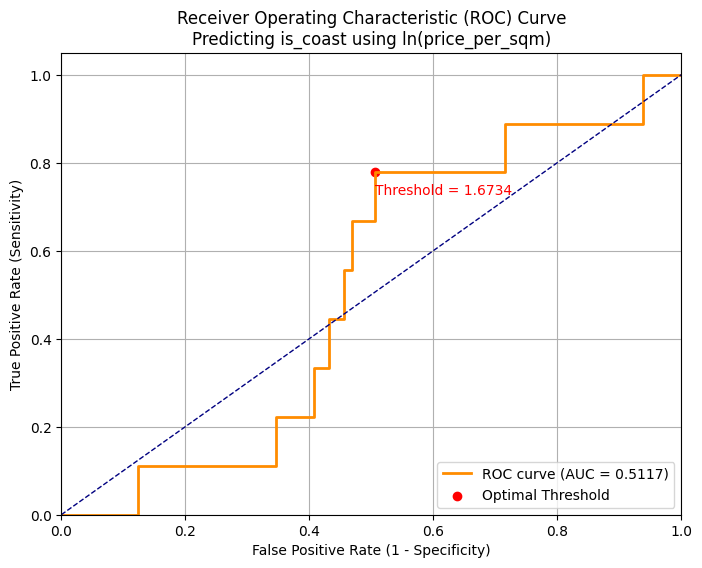

ROC Analysis Results:
AUC: 0.5117
Optimal Threshold: 1.6734
True Positive Rate at Optimal Threshold (Sensitivity): 0.7778
False Positive Rate at Optimal Threshold: 0.5062
Specificity at Optimal Threshold: 0.4938
Accuracy at Optimal Threshold: 0.5222
Precision at Optimal Threshold: 0.1458
Recall (Sensitivity) at Optimal Threshold: 0.7778
F1 Score at Optimal Threshold: 0.2456

Confusion Matrix at Optimal Threshold:
TN: 40, FP: 41, FN: 2, TP: 7

Logarithmic transformation applied using base 2.718281828459045.


In [138]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df, y_column, x_column, log_transform=True)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


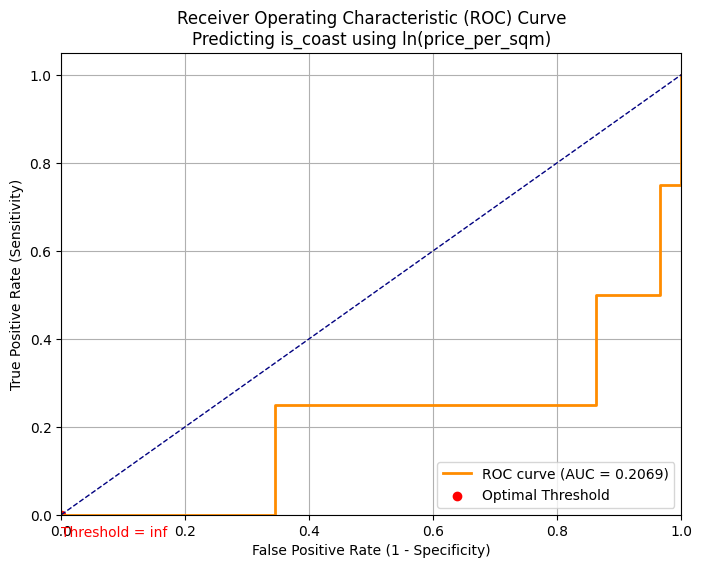

ROC Analysis Results:
AUC: 0.2069
Optimal Threshold: inf
True Positive Rate at Optimal Threshold (Sensitivity): 0.0000
False Positive Rate at Optimal Threshold: 0.0000
Specificity at Optimal Threshold: 1.0000
Accuracy at Optimal Threshold: 0.8788
Precision at Optimal Threshold: 0.0000
Recall (Sensitivity) at Optimal Threshold: 0.0000
F1 Score at Optimal Threshold: 0.0000

Confusion Matrix at Optimal Threshold:
TN: 29, FP: 0, FN: 4, TP: 0

Logarithmic transformation applied using base 2.718281828459045.


In [139]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_omsk, y_column, x_column, log_transform=True)

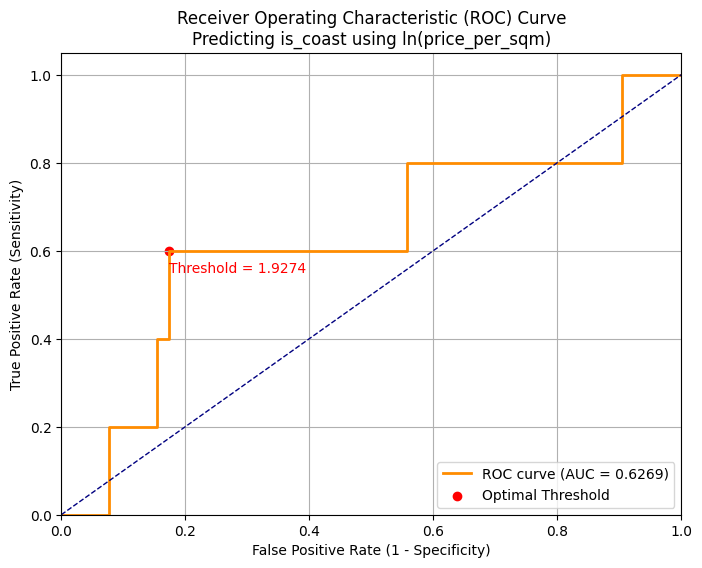

ROC Analysis Results:
AUC: 0.6269
Optimal Threshold: 1.9274
True Positive Rate at Optimal Threshold (Sensitivity): 0.6000
False Positive Rate at Optimal Threshold: 0.1731
Specificity at Optimal Threshold: 0.8269
Accuracy at Optimal Threshold: 0.8070
Precision at Optimal Threshold: 0.2500
Recall (Sensitivity) at Optimal Threshold: 0.6000
F1 Score at Optimal Threshold: 0.3529

Confusion Matrix at Optimal Threshold:
TN: 43, FP: 9, FN: 2, TP: 3

Logarithmic transformation applied using base 2.718281828459045.


In [140]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_not_omsk, y_column, x_column, log_transform=True)

In [141]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -2.225913
price_per_sqm    0.015776
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.107969  0.035786  0.325750
price_per_sqm  1.015901  0.634172  1.627407

Model Fit Statistics:
Log-Likelihood: -29.2553
AIC: 62.5106
BIC: 67.5102
Pseudo R-squared: 0.0001

Classification Performance at Threshold 0.0998:
Accuracy: 0.5222
Precision: 0.1458
Recall (Sensitivity): 0.7778
Specificity: 0.4938
F1 Score: 0.2456

ROC AUC: 0.5117

Optimal threshold (Youden's Index): 0.0998

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           40           41
Actual 1            2            7


In [142]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const            2.498934
price_per_sqm   -1.590497
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                      OR      2.5%       97.5%
const          12.169509  0.172860  856.743645
price_per_sqm   0.203824  0.039412    1.054098

Model Fit Statistics:
Log-Likelihood: -9.7706
AIC: 23.5412
BIC: 26.5342
Pseudo R-squared: 0.1983

Classification Performance at Threshold 0.2644:
Accuracy: 0.8485
Precision: 0.4286
Recall (Sensitivity): 0.7500
Specificity: 0.8621
F1 Score: 0.5455

ROC AUC: 0.7931

Optimal threshold (Youden's Index): 0.2644

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           25            4
Actual 1            1            3


In [143]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_not_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -2.822536
price_per_sqm    0.405626
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.059455  0.012852  0.275039
price_per_sqm  1.500242  0.614014  3.665593

Model Fit Statistics:
Log-Likelihood: -16.5291
AIC: 37.0582
BIC: 41.1443
Pseudo R-squared: 0.0244

Classification Performance at Threshold 0.1150:
Accuracy: 0.8070
Precision: 0.2500
Recall (Sensitivity): 0.6000
Specificity: 0.8269
F1 Score: 0.3529

ROC AUC: 0.6269

Optimal threshold (Youden's Index): 0.1150

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           43            9
Actual 1            2            3


In [144]:
# Transformed values for Y and binary X
results = perform_linear_regression(df, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.011
Method:                 Least Squares   F-statistic:                  0.004211
Date:                Sat, 09 Nov 2024   Prob (F-statistic):              0.948
Time:                        20:57:18   Log-Likelihood:                -161.93
No. Observations:                  90   AIC:                             327.9
Df Residuals:                      88   BIC:                             332.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.8016      0.164     10.961      0.0

In [145]:
# Transformed values for Y and binary X
results = perform_linear_regression(df_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.109
Method:                 Least Squares   F-statistic:                     4.921
Date:                Sat, 09 Nov 2024   Prob (F-statistic):             0.0340
Time:                        20:57:33   Log-Likelihood:                -38.638
No. Observations:                  33   AIC:                             81.28
Df Residuals:                      31   BIC:                             84.27
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.3201      0.149     22.208      0.0

In [146]:
# Transformed values for Y and binary X
results = perform_linear_regression(df_not_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.7830
Date:                Sat, 09 Nov 2024   Prob (F-statistic):              0.380
Time:                        20:57:44   Log-Likelihood:                -85.179
No. Observations:                  57   AIC:                             174.4
Df Residuals:                      55   BIC:                             178.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.9547      0.152      6.271      0.0

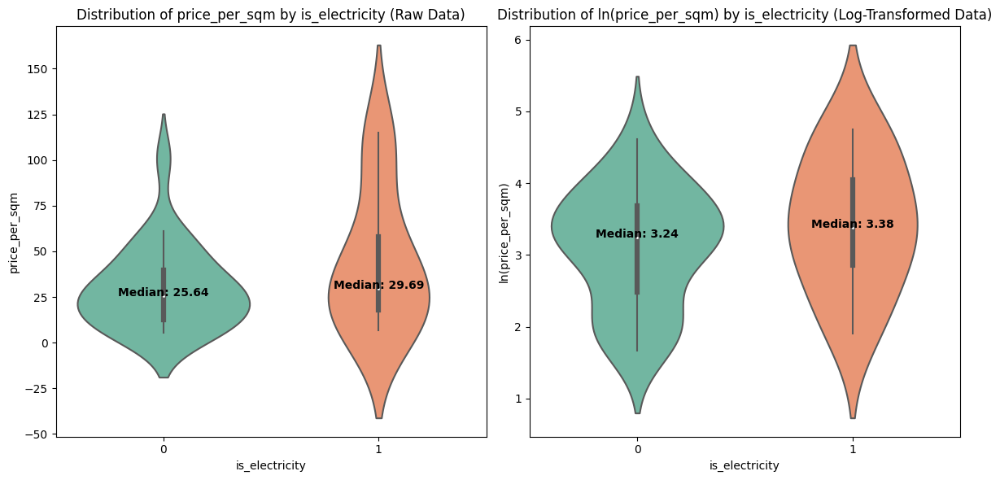

In [147]:
# Specify the columns
y_column = 'price_per_sqm'    # Continuous variable
x_column = 'is_electricity'         # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

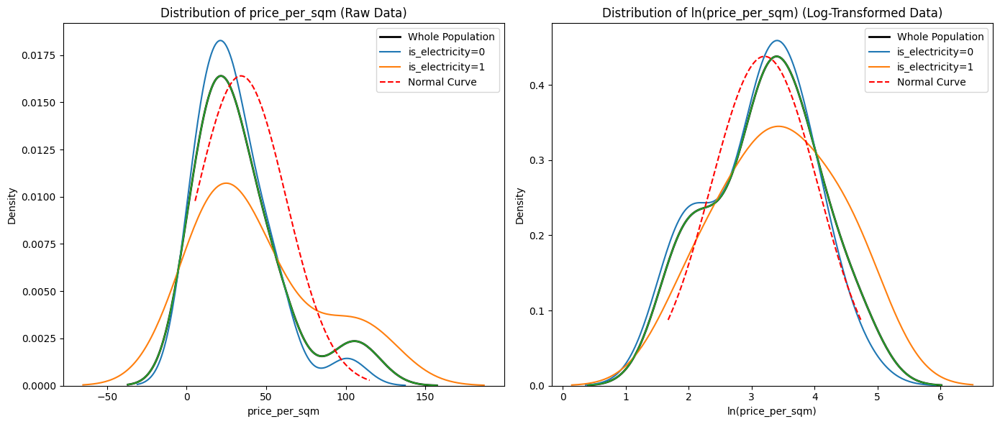

In [148]:
# Call the function
plot_kde_comparison(df_omsk, y_column, x_column)

In [149]:
# Call the function
results = perform_mann_whitney_tests(df_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 25.6410
Group 1 Median: 29.6875
U Statistic: 93.0000
P-value: 0.3997
Effect Size (Rank-Biserial Correlation): 0.1913
Sample Sizes: n0 = 23, n1 = 10

Log-Transformed Data:
Group 0 Median: 3.2442
Group 1 Median: 3.3831
U Statistic: 93.0000
P-value: 0.3997
Effect Size (Rank-Biserial Correlation): 0.1913
Sample Sizes: n0 = 23, n1 = 10
Log Base Used: 2.718281828459045


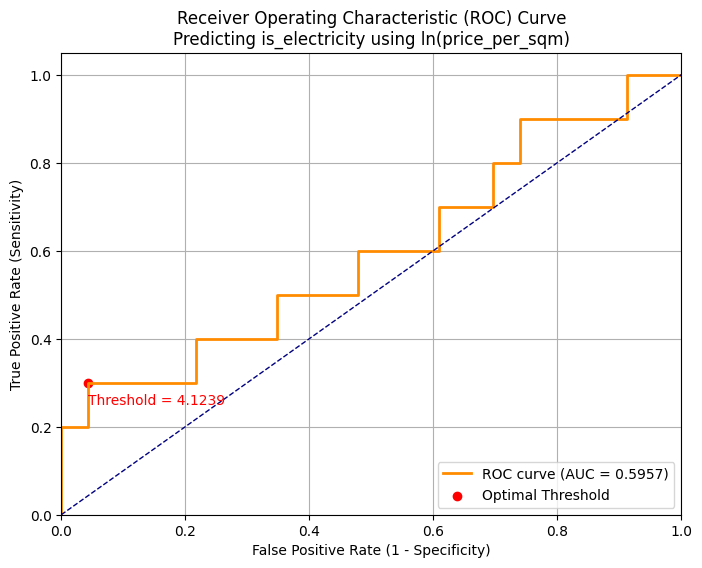

ROC Analysis Results:
AUC: 0.5957
Optimal Threshold: 4.1239
True Positive Rate at Optimal Threshold (Sensitivity): 0.3000
False Positive Rate at Optimal Threshold: 0.0435
Specificity at Optimal Threshold: 0.9565
Accuracy at Optimal Threshold: 0.7576
Precision at Optimal Threshold: 0.7500
Recall (Sensitivity) at Optimal Threshold: 0.3000
F1 Score at Optimal Threshold: 0.4286

Confusion Matrix at Optimal Threshold:
TN: 22, FP: 1, FN: 7, TP: 3

Logarithmic transformation applied using base 2.718281828459045.


In [150]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_omsk, y_column, x_column, log_transform=True)

In [151]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -2.375961
price_per_sqm    0.471896
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.092925  0.003807  2.268058
price_per_sqm  1.603031  0.631685  4.068024

Model Fit Statistics:
Log-Likelihood: -19.7247
AIC: 43.4495
BIC: 46.4425
Pseudo R-squared: 0.0256

Classification Performance at Threshold 0.3942:
Accuracy: 0.7576
Precision: 0.7500
Recall (Sensitivity): 0.3000
Specificity: 0.9565
F1 Score: 0.4286

ROC AUC: 0.5957

Optimal threshold (Youden's Index): 0.3942

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           22            1
Actual 1            7            3


In [152]:
# Transformed values for Y and binary X
results = perform_linear_regression(df_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.9831
Date:                Sat, 09 Nov 2024   Prob (F-statistic):              0.329
Time:                        21:14:49   Log-Likelihood:                -40.554
No. Observations:                  33   AIC:                             85.11
Df Residuals:                      31   BIC:                             88.10
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              3.1075      0.178     17.

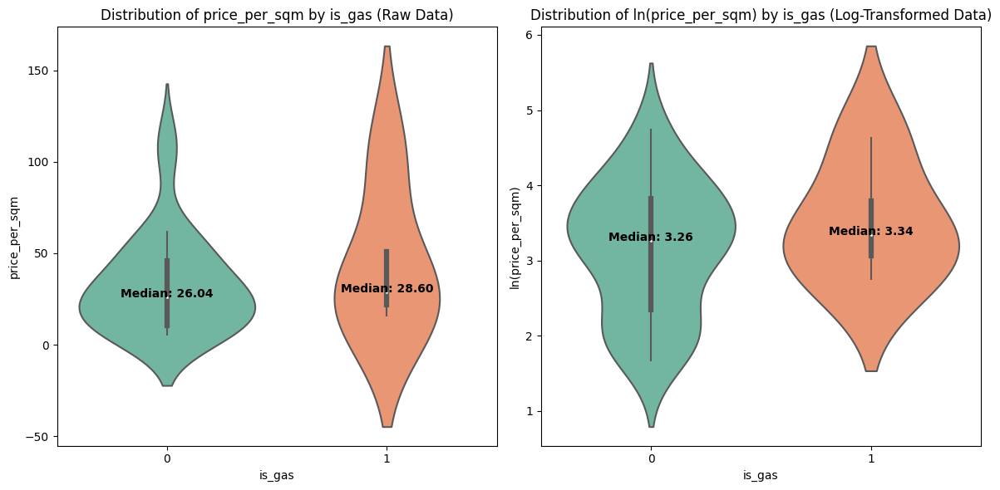

In [153]:
# Specify the columns
y_column = 'price_per_sqm'     # Continuous variable
x_column = 'is_gas'    # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

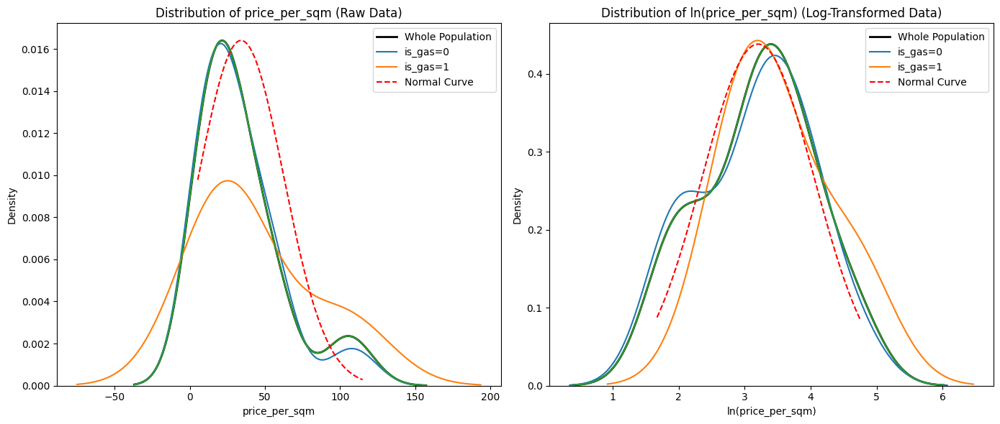

In [154]:
# Call the function
plot_kde_comparison(df_omsk, y_column, x_column)

In [155]:
# Call the function
results = perform_mann_whitney_tests(df_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 26.0417
Group 1 Median: 28.5985
U Statistic: 50.0000
P-value: 0.6900
Effect Size (Rank-Biserial Correlation): 0.1379
Sample Sizes: n0 = 29, n1 = 4

Log-Transformed Data:
Group 0 Median: 3.2597
Group 1 Median: 3.3395
U Statistic: 50.0000
P-value: 0.6900
Effect Size (Rank-Biserial Correlation): 0.1379
Sample Sizes: n0 = 29, n1 = 4
Log Base Used: 2.718281828459045


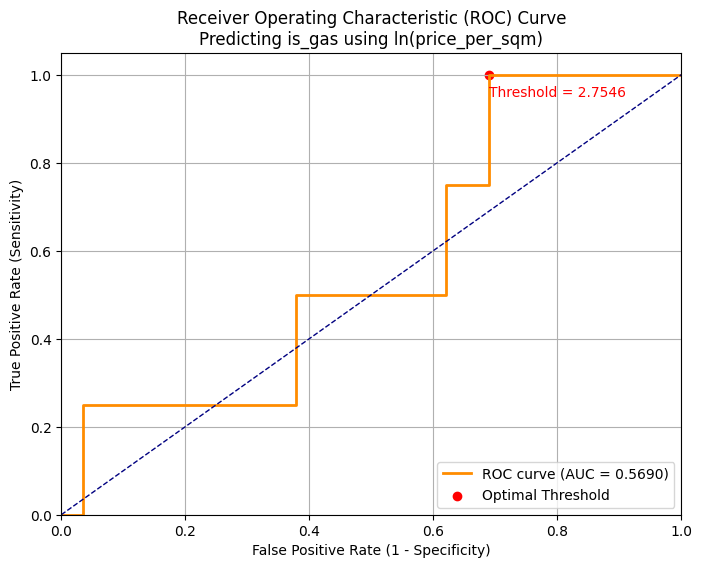

ROC Analysis Results:
AUC: 0.5690
Optimal Threshold: 2.7546
True Positive Rate at Optimal Threshold (Sensitivity): 1.0000
False Positive Rate at Optimal Threshold: 0.6897
Specificity at Optimal Threshold: 0.3103
Accuracy at Optimal Threshold: 0.3939
Precision at Optimal Threshold: 0.1667
Recall (Sensitivity) at Optimal Threshold: 1.0000
F1 Score at Optimal Threshold: 0.2857

Confusion Matrix at Optimal Threshold:
TN: 9, FP: 20, FN: 0, TP: 4

Logarithmic transformation applied using base 2.718281828459045.


In [156]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_omsk, y_column, x_column, log_transform=True)

In [157]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -3.754539
price_per_sqm    0.530589
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.023411  0.000203  2.693394
price_per_sqm  1.699934  0.448902  6.437435

Model Fit Statistics:
Log-Likelihood: -11.8644
AIC: 27.7287
BIC: 30.7217
Pseudo R-squared: 0.0266

Classification Performance at Threshold 0.0917:
Accuracy: 0.3939
Precision: 0.1667
Recall (Sensitivity): 1.0000
Specificity: 0.3103
F1 Score: 0.2857

ROC AUC: 0.5690

Optimal threshold (Youden's Index): 0.0917

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0            9           20
Actual 1            0            4


In [158]:
# Transformed values for Y and binary X
results = perform_linear_regression(df_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                 -0.013
Method:                 Least Squares   F-statistic:                    0.6015
Date:                Sat, 09 Nov 2024   Prob (F-statistic):              0.444
Time:                        21:22:46   Log-Likelihood:                -40.752
No. Observations:                  33   AIC:                             85.50
Df Residuals:                      31   BIC:                             88.50
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.1616      0.159     19.836      0.0

In [3]:
# Parameters
shape_column = 'shape'
binary_column_name = 'is_simple_shape'
value_for_one = 'simple'
value_for_zero = 'complex'
na_values = 'unknown'

# Call the function
df_shape = create_binary_column(df, shape_column, binary_column_name, value_for_one, value_for_zero, na_values)


In [4]:
print(df_shape[['is_simple_shape']].describe())

       is_simple_shape
count        51.000000
mean          0.686275
std           0.468623
min           0.000000
25%           0.000000
50%           1.000000
75%           1.000000
max           1.000000


In [5]:
# Create separate Data Frames for different groups of districts
specific_districts = ['Омский район']  # List of districts to include
df_shape_omsk = df_shape[df_shape['district'].isin(specific_districts)]
df_shape_not_omsk = df_shape[~df_shape['district'].isin(specific_districts)]

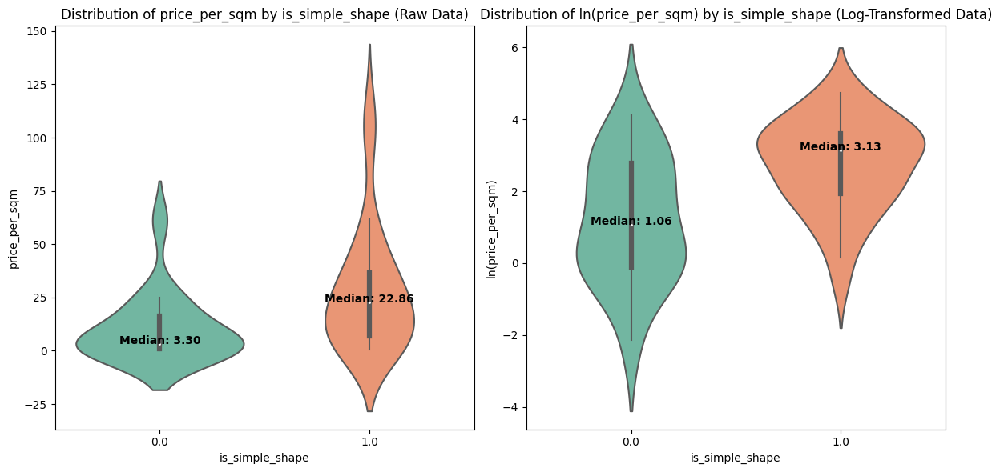

In [7]:
# Specify the columns
y_column = 'price_per_sqm'     # Continuous variable
x_column = 'is_simple_shape'    # Binary variable with values 0 and 1

# Call the function
plot_violin_comparison(df_shape, y_column, x_column)

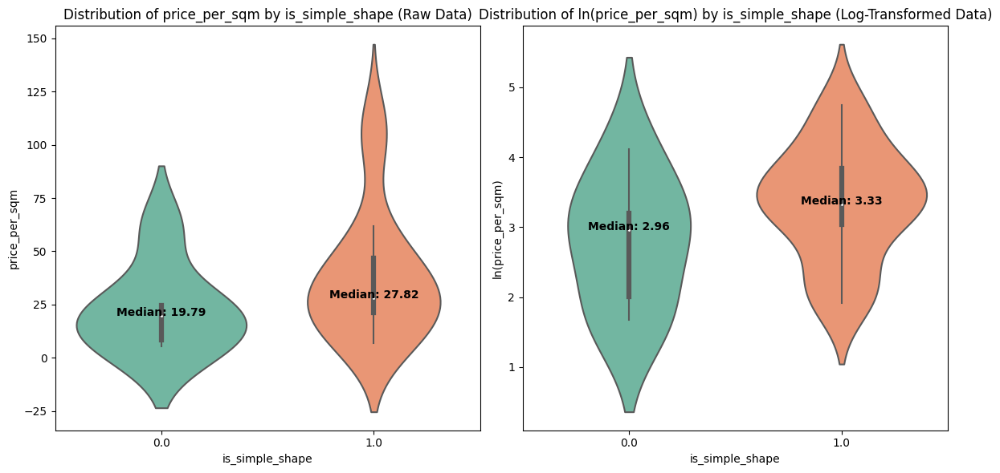

In [8]:
# Call the function
plot_violin_comparison(df_shape_omsk, y_column, x_column)

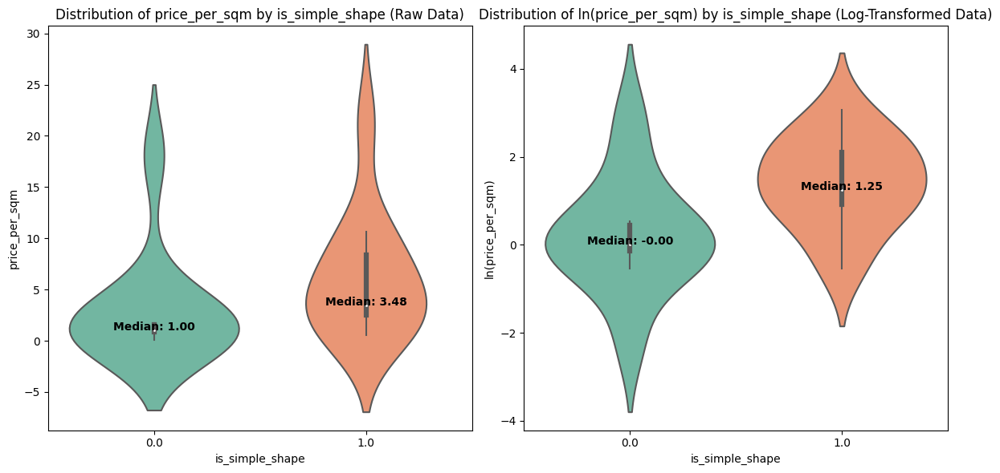

In [9]:
# Call the function
plot_violin_comparison(df_shape_not_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

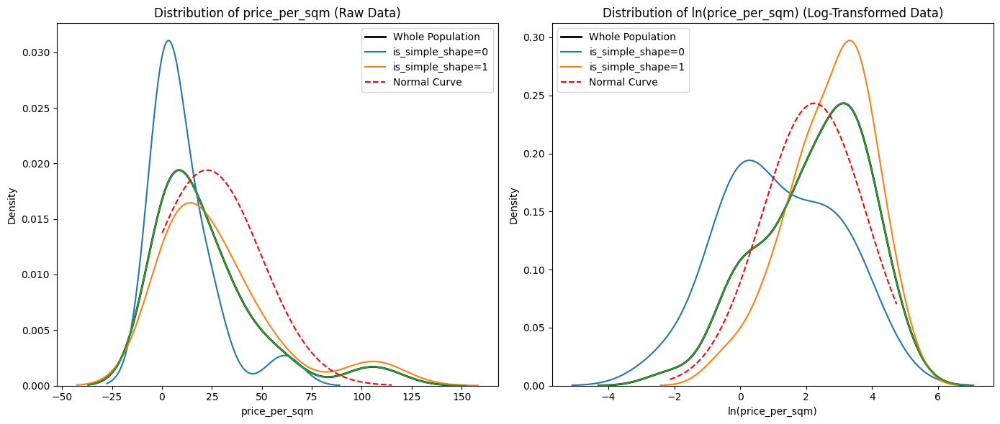

In [10]:
# Call the function
plot_kde_comparison(df_shape, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

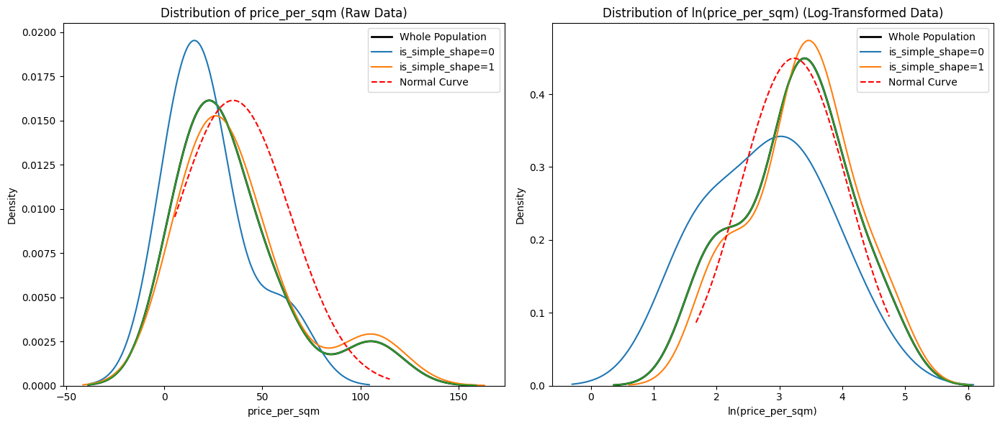

In [11]:
# Call the function
plot_kde_comparison(df_shape_omsk, y_column, x_column)

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future ver

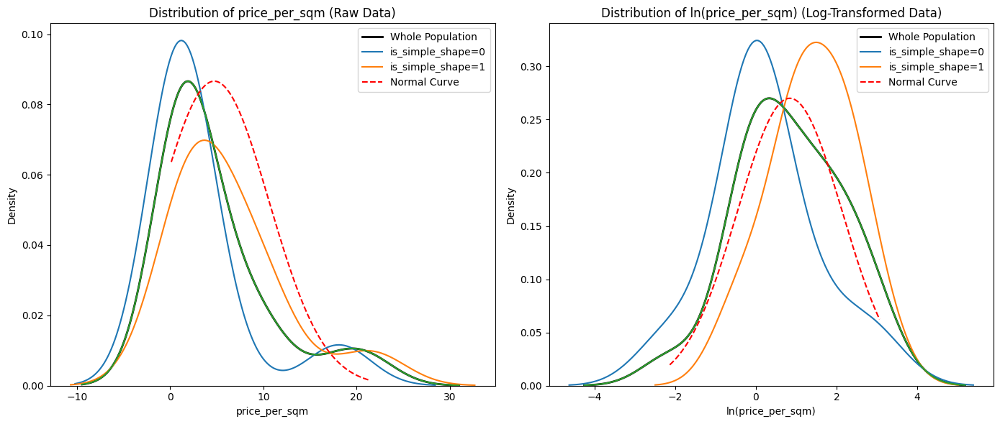

In [12]:
plot_kde_comparison(df_shape_not_omsk, y_column, x_column)

In [13]:
# Call the function
results = perform_mann_whitney_tests(df_shape, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 3.2962
Group 1 Median: 22.8622
U Statistic: 126.0000
P-value: 0.0018
Effect Size (Rank-Biserial Correlation): 0.5500
Sample Sizes: n0 = 16, n1 = 35

Log-Transformed Data:
Group 0 Median: 1.0592
Group 1 Median: 3.1295
U Statistic: 126.0000
P-value: 0.0018
Effect Size (Rank-Biserial Correlation): 0.5500
Sample Sizes: n0 = 16, n1 = 35
Log Base Used: 2.718281828459045


In [14]:
# Call the function
results = perform_mann_whitney_tests(df_shape_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 19.7892
Group 1 Median: 27.8223
U Statistic: 40.0000
P-value: 0.1036
Effect Size (Rank-Biserial Correlation): 0.4444
Sample Sizes: n0 = 6, n1 = 24

Log-Transformed Data:
Group 0 Median: 2.9635
Group 1 Median: 3.3251
U Statistic: 40.0000
P-value: 0.1036
Effect Size (Rank-Biserial Correlation): 0.4444
Sample Sizes: n0 = 6, n1 = 24
Log Base Used: 2.718281828459045


In [15]:
# Call the function
results = perform_mann_whitney_tests(df_shape_not_omsk, y_column, x_column)

Mann-Whitney U-test Results:

Raw Data:
Group 0 Median: 1.0038
Group 1 Median: 3.4783
U Statistic: 25.0000
P-value: 0.0378
Effect Size (Rank-Biserial Correlation): 0.5455
Sample Sizes: n0 = 10, n1 = 11

Log-Transformed Data:
Group 0 Median: -0.0015
Group 1 Median: 1.2465
U Statistic: 25.0000
P-value: 0.0378
Effect Size (Rank-Biserial Correlation): 0.5455
Sample Sizes: n0 = 10, n1 = 11
Log Base Used: 2.718281828459045


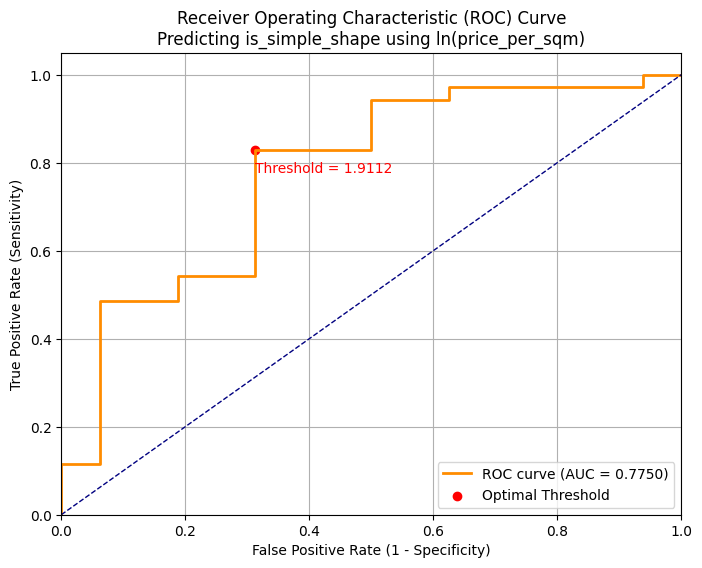

ROC Analysis Results:
AUC: 0.7750
Optimal Threshold: 1.9112
True Positive Rate at Optimal Threshold (Sensitivity): 0.8286
False Positive Rate at Optimal Threshold: 0.3125
Specificity at Optimal Threshold: 0.6875
Accuracy at Optimal Threshold: 0.7843
Precision at Optimal Threshold: 0.8529
Recall (Sensitivity) at Optimal Threshold: 0.8286
F1 Score at Optimal Threshold: 0.8406

Confusion Matrix at Optimal Threshold:
TN: 11, FP: 5, FN: 6, TP: 29

Logarithmic transformation applied using base 2.718281828459045.


In [16]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_shape, y_column, x_column, log_transform=True)

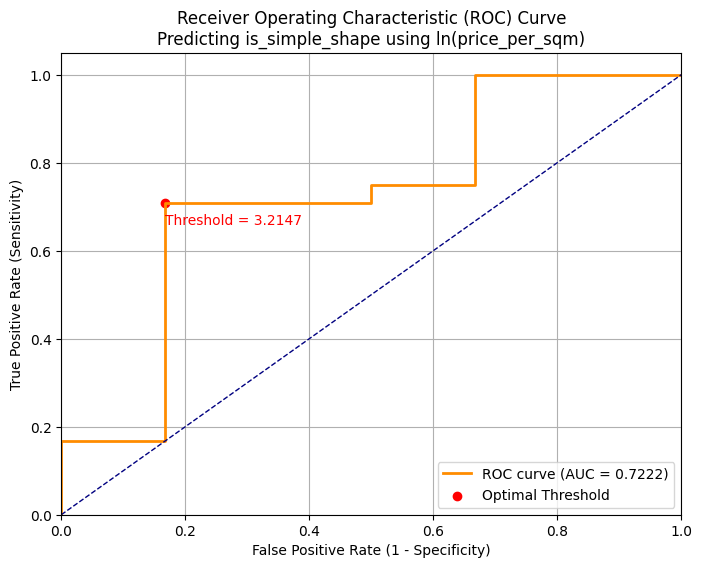

ROC Analysis Results:
AUC: 0.7222
Optimal Threshold: 3.2147
True Positive Rate at Optimal Threshold (Sensitivity): 0.7083
False Positive Rate at Optimal Threshold: 0.1667
Specificity at Optimal Threshold: 0.8333
Accuracy at Optimal Threshold: 0.7333
Precision at Optimal Threshold: 0.9444
Recall (Sensitivity) at Optimal Threshold: 0.7083
F1 Score at Optimal Threshold: 0.8095

Confusion Matrix at Optimal Threshold:
TN: 5, FP: 1, FN: 7, TP: 17

Logarithmic transformation applied using base 2.718281828459045.


In [17]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_shape_omsk, y_column, x_column, log_transform=True)

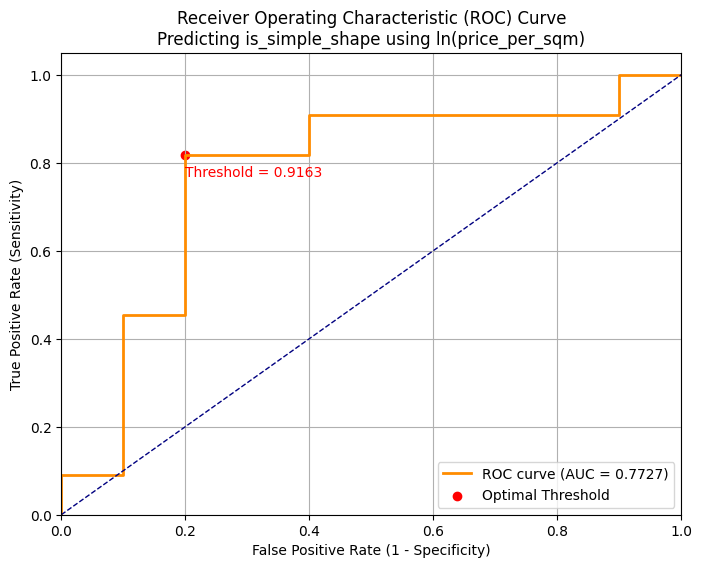

ROC Analysis Results:
AUC: 0.7727
Optimal Threshold: 0.9163
True Positive Rate at Optimal Threshold (Sensitivity): 0.8182
False Positive Rate at Optimal Threshold: 0.2000
Specificity at Optimal Threshold: 0.8000
Accuracy at Optimal Threshold: 0.8095
Precision at Optimal Threshold: 0.8182
Recall (Sensitivity) at Optimal Threshold: 0.8182
F1 Score at Optimal Threshold: 0.8182

Confusion Matrix at Optimal Threshold:
TN: 8, FP: 2, FN: 2, TP: 9

Logarithmic transformation applied using base 2.718281828459045.


In [18]:
# Perform ROC analysis with logarithmic transformation
results = perform_roc_analysis(df_shape_not_omsk, y_column, x_column, log_transform=True)

In [19]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_shape, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -0.625474
price_per_sqm    0.700203
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.535008  0.179288  1.596504
price_per_sqm  2.014161  1.263069  3.211893

Model Fit Statistics:
Log-Likelihood: -26.2172
AIC: 56.4343
BIC: 60.2980
Pseudo R-squared: 0.1736

Classification Performance at Threshold 0.6710:
Accuracy: 0.7843
Precision: 0.8529
Recall (Sensitivity): 0.8286
Specificity: 0.6875
F1 Score: 0.8406

ROC AUC: 0.7750

Optimal threshold (Youden's Index): 0.6710

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0           11            5
Actual 1            6           29


In [20]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_shape_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -1.126297
price_per_sqm    0.820221
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%      97.5%
const          0.324232  0.010417  10.092131
price_per_sqm  2.271001  0.727828   7.086074

Model Fit Statistics:
Log-Likelihood: -13.9292
AIC: 31.8584
BIC: 34.6608
Pseudo R-squared: 0.0721

Classification Performance at Threshold 0.8191:
Accuracy: 0.7333
Precision: 0.9444
Recall (Sensitivity): 0.7083
Specificity: 0.8333
F1 Score: 0.8095

ROC AUC: 0.7222

Optimal threshold (Youden's Index): 0.8191

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0            5            1
Actual 1            7           17


In [22]:
# Perform logistic regression with logarithmic transformation
results = perform_logistic_regression(df_shape_not_omsk, y_column, x_column, log_transform=True)

Logistic Regression Results:
Coefficients:
const           -0.640474
price_per_sqm    0.902852
dtype: float64

Odds Ratios and 95% Confidence Intervals:
                     OR      2.5%     97.5%
const          0.527043  0.157399  1.764773
price_per_sqm  2.466629  0.974611  6.242756

Model Fit Statistics:
Log-Likelihood: -12.0715
AIC: 28.1430
BIC: 30.2320
Pseudo R-squared: 0.1693

Classification Performance at Threshold 0.5466:
Accuracy: 0.8095
Precision: 0.8182
Recall (Sensitivity): 0.8182
Specificity: 0.8000
F1 Score: 0.8182

ROC AUC: 0.7727

Optimal threshold (Youden's Index): 0.5466

Logarithmic transformation applied using base 2.718281828459045.

Confusion Matrix:
          Predicted 0  Predicted 1
Actual 0            8            2
Actual 1            2            9


In [23]:
# Transformed values for Y and binary X
results = perform_linear_regression(df_shape, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.209
Model:                            OLS   Adj. R-squared:                  0.192
Method:                 Least Squares   F-statistic:                     12.92
Date:                Sat, 09 Nov 2024   Prob (F-statistic):           0.000754
Time:                        22:39:29   Log-Likelihood:                -89.391
No. Observations:                  51   AIC:                             182.8
Df Residuals:                      49   BIC:                             186.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               1.1868      0.356     

In [24]:
# Transformed values for Y and binary X
results = perform_linear_regression(df_shape_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.071
Model:                            OLS   Adj. R-squared:                  0.038
Method:                 Least Squares   F-statistic:                     2.152
Date:                Sat, 09 Nov 2024   Prob (F-statistic):              0.154
Time:                        22:39:42   Log-Likelihood:                -36.363
No. Observations:                  30   AIC:                             76.73
Df Residuals:                      28   BIC:                             79.53
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               2.7804      0.344     

In [25]:
# Transformed values for Y and binary X
results = perform_linear_regression(df_shape_not_omsk, y_column, x_column,
                                    use_log_y=True, use_log_x=False)

                            OLS Regression Results                            
Dep. Variable:          price_per_sqm   R-squared:                       0.211
Model:                            OLS   Adj. R-squared:                  0.170
Method:                 Least Squares   F-statistic:                     5.084
Date:                Sat, 09 Nov 2024   Prob (F-statistic):             0.0361
Time:                        22:39:51   Log-Likelihood:                -32.279
No. Observations:                  21   AIC:                             68.56
Df Residuals:                      19   BIC:                             70.65
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.2306      0.374     

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


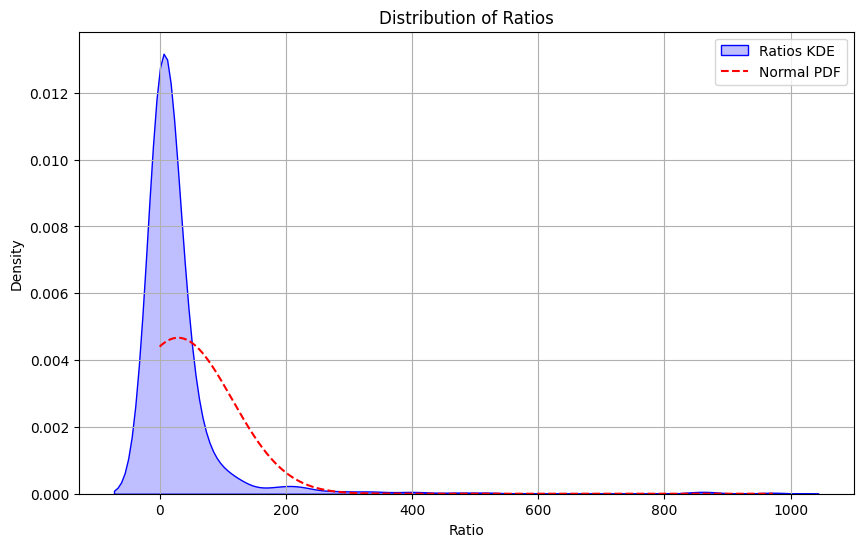

Mean of Ratios: 29.2316
Median of Ratios: 5.0571
95% Confidence Interval of Mean: (22.1382, 36.3249)
Shapiro-Wilk Test Statistic: 0.3319
Shapiro-Wilk Test p-value: 7.7716e-41
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [26]:
# Transformed values for Y and binary X
results = compare_groups_with_ratios(df_shape, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


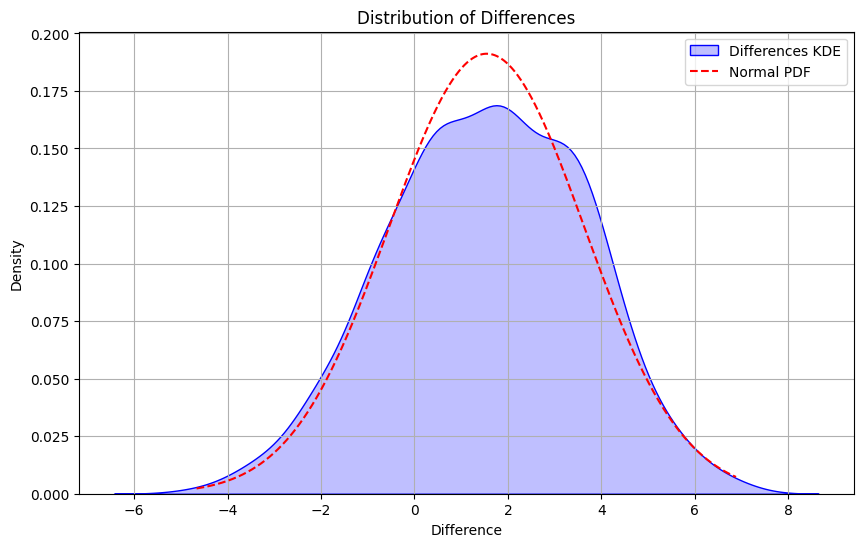

Mean of Differences: 1.5451
Median of Differences: 1.6208
95% Confidence Interval of Mean: (1.3718, 1.7183)
Shapiro-Wilk Test Statistic: 0.9951
Shapiro-Wilk Test p-value: 6.9719e-02
The distribution of differences is not significantly different from normal (fail to reject null hypothesis at alpha=0.05).


In [27]:
# Transformed values for Y and binary X
results = compare_groups_with_differences(df_shape, y_column, x_column, log_transform=True)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2304: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(ratios, label='Ratios KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


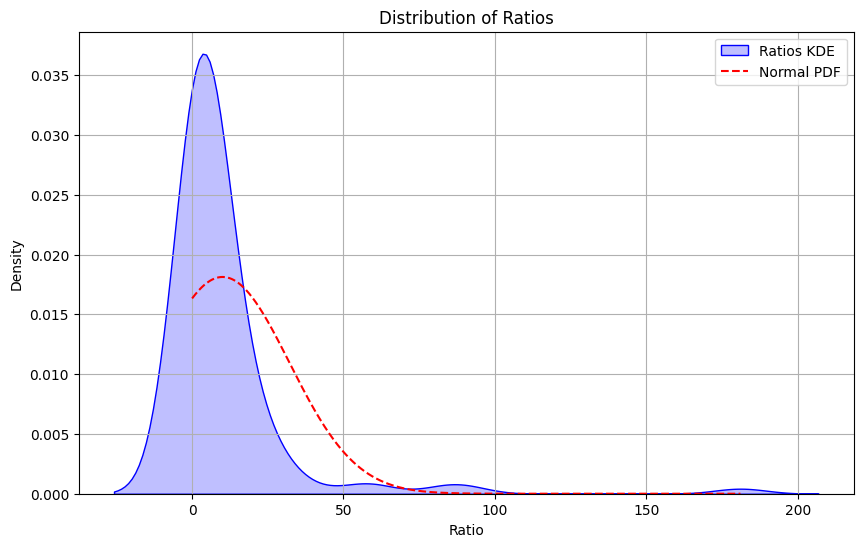

Mean of Ratios: 10.0861
Median of Ratios: 3.4483
95% Confidence Interval of Mean: (5.9267, 14.2456)
Shapiro-Wilk Test Statistic: 0.4290
Shapiro-Wilk Test p-value: 8.9163e-19
The distribution of ratios is significantly different from normal (reject null hypothesis at alpha=0.05).


In [28]:
# Transformed values for Y and binary X
results = compare_groups_with_ratios(df_shape_not_omsk, y_column, x_column, log_transform=False)

/home/kaarlahti/Tresors/Researches/omsk/omsk_agro/syvajarvirus55a243.py:2425: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(differences, label='Differences KDE', shade=True, color='blue')
/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


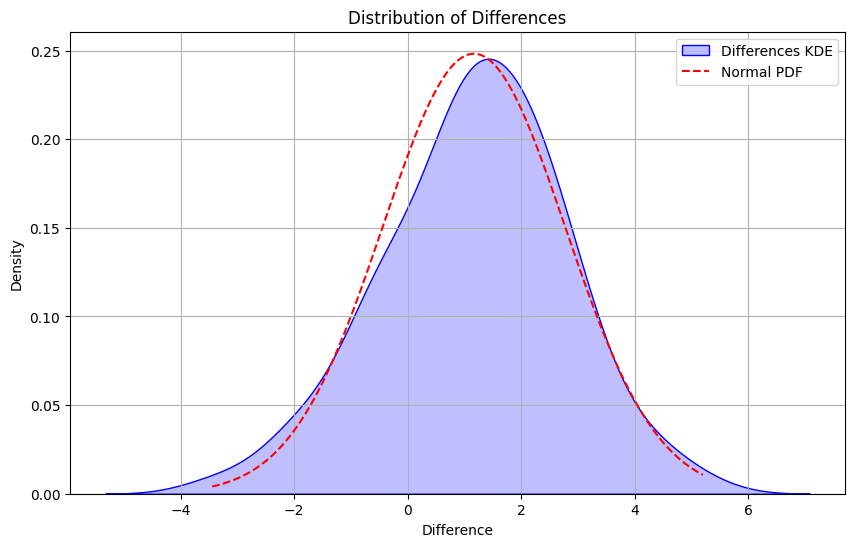

Mean of Differences: 1.1657
Median of Differences: 1.2378
95% Confidence Interval of Mean: (0.8619, 1.4694)
Shapiro-Wilk Test Statistic: 0.9922
Shapiro-Wilk Test p-value: 7.8745e-01
The distribution of differences is not significantly different from normal (fail to reject null hypothesis at alpha=0.05).


In [29]:
# Transformed values for Y and binary X
results = compare_groups_with_differences(df_shape_not_omsk, y_column, x_column, log_transform=True)